# belief eye neural analysis


## imports

In [67]:
%reload_ext autoreload
%autoreload 2

In [ ]:

import sys
import os
from pathlib import Path
import configparser
config = configparser.ConfigParser()
config.read_file(open('privateconfig'))
resdir = Path(config['Datafolder']['data'])
workdir = Path(config['Codefolder']['workspace'])
os.chdir(workdir)
# analysis
from scipy.io import loadmat
from sklearn.decomposition import FastICA
from sklearn.linear_model import LinearRegression
from sklearn.datasets import make_regression
from sklearn.model_selection import KFold
from sklearn.linear_model import LassoCV, Lasso
from sklearn.metrics import mean_squared_error
from scipy.stats import pearsonr
from sklearn.cross_decomposition import CCA
# misc
import pickle
from collections import defaultdict
from neural_plot_ult import *
import time
tic=time.time()
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score

In [69]:
# run this once per notebook session  —  ideally in the first cell
from IPython import get_ipython

def notify_exc(shell, etype, evalue, tb, tb_offset=None):
    # 1. push notification
    summary = f"{etype.__name__}: {evalue}"
    notify(msg=summary, title="Python Error")

    # 2. let IPython show its normal traceback
    shell.showtraceback((etype, evalue, tb), tb_offset=tb_offset)
    return None            # ← must be None or a list of strings

get_ipython().set_custom_exc((Exception,), notify_exc)


## load data

## load standard data


In [70]:
df = pd.read_pickle(resdir/'0507_m44df.pkl')
len(df)


27450

In [71]:
def process_one(y):
    related_taskvar=np.array(normalize_z(y))
    mask=(related_taskvar > -4) & (related_taskvar < 4)
    related_taskvar[~mask]=0
    return related_taskvar, mask

def process(rawtaskvar, returnmask=False):
    # normalize each item to 0 mean 1 std
    rawtaskvar=[np.array(normalize_z(y)) for y in rawtaskvar]
    related_taskvar=np.vstack(rawtaskvar).T
    # related_taskvar=np.clip(related_taskvar,-4,4)
    mask=(related_taskvar > -4) & (related_taskvar < 4)
    mask=np.all(mask, axis=1)
    related_taskvar=related_taskvar[mask]
    if returnmask:
        return related_taskvar, mask
    return related_taskvar
def process_list(rawtaskvar, returnmask=False):
    # normalize each item to 0 mean 1 std
    rawtaskvar=[np.array(normalize_z(y)) for y in rawtaskvar]
    mask=[(a > -4) & (a < 4) for a in rawtaskvar]
    mask=np.all(mask)
    related_taskvar=[a[mask] for a in rawtaskvar]
    if returnmask:
        return related_taskvar, mask
    return related_taskvar

In [73]:
# error distribution
def get_stop_error(row):
    return ((row.fx[-1]-row.mx[-1])**2+(row.fy[-1]-row.my[-1])**2)**0.5
df['state_error']=df.apply(get_stop_error, axis=1)
def get_stop_error(row):
    return ((row.fx[-1]-row.bmx[-1])**2+(row.fy[-1]-row.bmy[-1])**2)**0.5
df['belief_error']=df.apply(get_stop_error, axis=1)

# time ratio
df['time_ratio']=df.apply(lambda x: x.timer/x.timer[-1], axis=1)


In [89]:
def gettimedf(sessdf):
    # state=np.concatenate(sessdf.belief_ff_hori.to_numpy())
    # belief=np.concatenate(sessdf.ff_hori.to_numpy())
    # eye=np.concatenate(sessdf.eye_hori.to_numpy())
    # timeratio=np.concatenate(sessdf.time_ratio.to_numpy())
    timer=np.concatenate(sessdf.timer.to_numpy())
    # countdown=np.concatenate(sessdf.countdown.to_numpy())
    sessdf['density_t']=sessdf.apply(lambda x: np.array([[x.density]*len(x.mx)]).reshape(-1), axis=1)
    sessdf['fullon_t']=sessdf.apply(lambda x: np.array([[x.fullon]*len(x.mx)]).reshape(-1), axis=1)
    sessdf['error_t']=sessdf.apply(lambda x: np.array([[x.error]*len(x.mx)]).reshape(-1), axis=1)
    timedf=pd.DataFrame({'timer':timer})
    timedf['rawcov']=list(np.vstack(sessdf['rawcov'].to_numpy()))
    timedf['belief']=np.concatenate(sessdf.belief_ff_hori.to_numpy())
    timedf['state']=np.concatenate(sessdf.ff_hori.to_numpy())
    timedf['eye']=np.concatenate(sessdf.eye_hori.to_numpy())
    timedf['timeratio']=np.concatenate(sessdf.time_ratio.to_numpy())
    timedf['mv']=np.concatenate(sessdf.mv.to_numpy())
    timedf['mw']=np.concatenate(sessdf.mw.to_numpy())
    timedf['belief_heading']=np.concatenate(sessdf.belief_heading.to_numpy())
    timedf['timer']=np.concatenate(sessdf.timer.to_numpy())
    timedf['countdown']=np.concatenate(sessdf.countdown.to_numpy())
    timedf['belief_angle_from_start']=np.concatenate(sessdf.belief_angle_from_start.to_numpy())
    timedf['PPC']=list(np.vstack(sessdf.PPC.to_numpy()))
    timedf['uncertainty']=list(np.concatenate(sessdf.relcov.to_numpy()))
    timedf['density']=np.concatenate(sessdf.density_t.to_numpy())
    timedf['fullon']=np.concatenate(sessdf.fullon_t.to_numpy())
    timedf['error']=np.concatenate(sessdf.error_t.to_numpy())
    timedf['trial'] = np.concatenate(sessdf.apply(lambda x: np.full(len(x.mx), x.trial), axis=1).to_numpy())
    timedf['dbelief']=np.concatenate(sessdf.apply(lambda x: np.diff(x.belief_ff_hori, prepend=x.belief_ff_hori[:1],axis=0),axis=1).to_numpy())
    timedf['deye']=np.concatenate(sessdf.apply(lambda x: np.diff(x.eye_hori, prepend=x.eye_hori[:1],axis=0),axis=1).to_numpy())
    timedf['dneural']=list(np.vstack(sessdf.apply(lambda x: np.diff(x.PPC, prepend=x.PPC[:1], axis=0),axis=1).to_numpy()))
    timedf = timedf.dropna(subset=['eye', 'state', 'belief'])

    return timedf

# for loop

In [90]:

def analyze_session(timedf):
    """Analyze a single session and return importance values and R2 scores"""
    # 1. Load inputs
    eye = np.vstack(timedf['eye'].to_numpy())          # [T, 1]
    state = np.vstack(timedf['state'].to_numpy())      # [T, 1]
    timer = timedf['timer'].to_numpy().reshape(-1, 1)  # [T, 1]
    mw = timedf['mw'].to_numpy().reshape(-1, 1)        # [T, 1]
    belief = np.vstack(timedf['belief'].to_numpy())    # [T, 1]
    uncertainty = np.array([u[0, 0] for u in timedf['uncertainty'].to_numpy()]).reshape(-1, 1)
    # [T, 1]
    fr = np.vstack(timedf['PPC'].to_numpy())[:,:10]    # [T, N] # for faster testing

    # 2. Combine all predictors
    X = np.hstack([eye, state, timer, mw, belief, uncertainty])
    feature_names = ['eye', 'state', 'timer', 'mw', 'belief', 'uncertainty']

    # 3. Remove invalid rows
    valid = np.isfinite(X).all(axis=1) & np.isfinite(fr).all(axis=1)
    X = X[valid]
    fr = fr[valid]

    # 4. Train random forest per neuron
    importances_all = []
    r2_all = []

    for i in range(fr.shape[1]):
        y = fr[:, i]
        model = RandomForestRegressor(n_estimators=50, max_depth=10, random_state=0, n_jobs=-1)
        model.fit(X, y)
        y_pred = model.predict(X)
        r2 = r2_score(y, y_pred)
        r2_all.append(r2)
        importances_all.append(model.feature_importances_)

    return np.array(importances_all), np.array(r2_all), feature_names

def plot_importance_across_sessions(sessions_data, session_names=None):
    """
    Plot feature importance across multiple sessions with error bars
    
    Parameters:
        sessions_data: List of (importances, r2_scores, feature_names) tuples
        session_names: Optional list of session names
    """
    if session_names is None:
        session_names = [f"Session {i+1}" for i in range(len(sessions_data))]
    
    # Extract feature names from first session
    feature_names = sessions_data[0][2]
    n_features = len(feature_names)
    
    # Collect all importance values
    all_importances = []
    all_r2 = []
    
    for session_idx, (imp, r2, _) in enumerate(sessions_data):
        all_importances.append(imp)
        all_r2.append(r2)
    
    # Combine importances across sessions
    combined_importances = np.concatenate(all_importances, axis=0)
    
    # Calculate mean and std for bar chart with error bars
    mean_importance = np.mean(combined_importances, axis=0)
    std_importance = np.std(combined_importances, axis=0)
    
    # Calculate mean R² across all sessions and neurons
    mean_r2 = np.mean([np.mean(r2) for r2 in all_r2])
    
    # Create the plot
    plt.figure(figsize=(10, 6))
    
    # Bar chart with error bars
    bars = plt.bar(np.arange(n_features), mean_importance, yerr=std_importance, 
                capsize=5, alpha=0.7, color='steelblue', ecolor='black')
    
    # Set x-axis labels
    plt.xticks(np.arange(n_features), feature_names, rotation=45, ha='right')
    
    # Add title and labels
    plt.title(f"Feature Importance Across {len(sessions_data)} Sessions\n(Mean R² = {mean_r2:.4f})")
    plt.ylabel("Mean Feature Importance")
    plt.xlabel("Features")
    
    # Add a horizontal grid for better readability
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    
    plt.tight_layout()
    
    # Optional: Add a legend showing session information
    if len(sessions_data) > 1:
        # Create a separate figure for session-specific information
        plt.figure(figsize=(10, 6))
        
        # Plot session-specific means
        for i, (imp, r2, _) in enumerate(sessions_data):
            session_mean = np.mean(imp, axis=0)
            plt.plot(np.arange(n_features), session_mean, 'o-', 
                    label=f"{session_names[i]} (R² = {np.mean(r2):.4f})")
        
        plt.xticks(np.arange(n_features), feature_names, rotation=45, ha='right')
        plt.title("Feature Importance by Session")
        plt.ylabel("Mean Feature Importance")
        plt.xlabel("Features")
        plt.grid(axis='y', linestyle='--', alpha=0.7)
        plt.legend(loc='best')
        plt.tight_layout()
    
    plt.show()

# for ithsess in range(len(df.session.unique())):

#     sessdf=df[(df.session==sorted(df.session.unique())[ithsess])]
#     timedf=gettimedf(sessdf)



all_session_results = []

# Get unique sessions and sort them
unique_sessions = sorted(df.session.unique())
session_names = [f"Session {ithsess+1}" for ithsess in range(len(unique_sessions))]

# Loop through sessions
for ithsess in range(len(unique_sessions)):
    print(f"Analyzing session {ithsess+1}/{len(unique_sessions)}...")
    
    # Filter data for this session
    sessdf = df[df.session == unique_sessions[ithsess]]
    
    # Get time-based dataframe
    timedf = gettimedf(sessdf)
    
    # Analyze session and store results
    session_results = analyze_session(timedf)
    all_session_results.append(session_results)

# Plot combined results
plot_importance_across_sessions(all_session_results, session_names)



# Call the main function (uncomment when ready to run)
# all_session_results = main(df, gettimedf)

Analyzing session 1/26...
Analyzing session 2/26...
Analyzing session 3/26...
Analyzing session 4/26...
Analyzing session 5/26...
Analyzing session 6/26...


KeyboardInterrupt: 

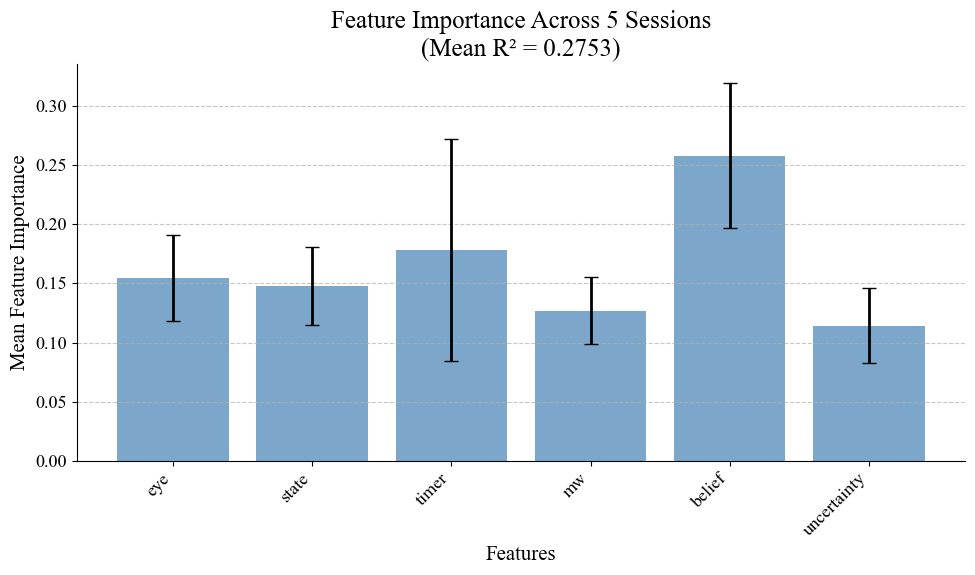

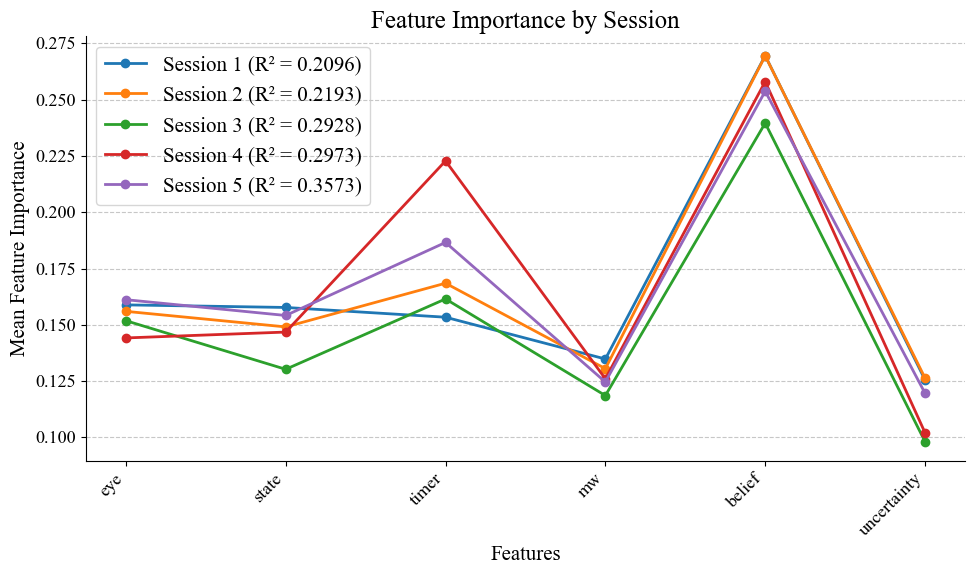

In [91]:
plot_importance_across_sessions(all_session_results, session_names)


# done

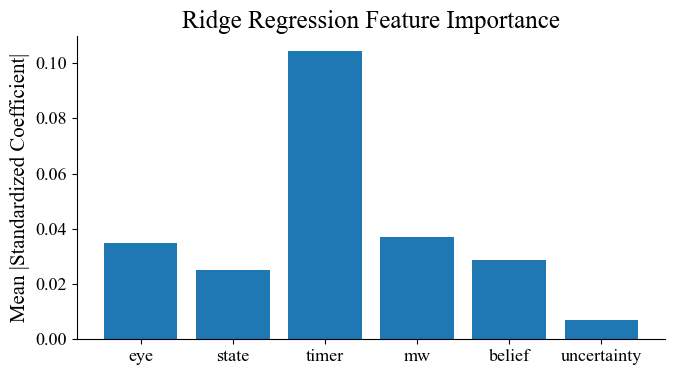

In [77]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import Ridge
from sklearn.preprocessing import StandardScaler

# 1. Load predictors
eye = np.vstack(timedf['eye'].to_numpy())
state = np.vstack(timedf['state'].to_numpy())
timer = timedf['timer'].to_numpy().reshape(-1, 1)
mw = timedf['mw'].to_numpy().reshape(-1, 1)
belief = np.vstack(timedf['belief'].to_numpy())
uncertainty = np.array([u[0, 0] for u in timedf['uncertainty'].to_numpy()]).reshape(-1, 1)
fr = np.vstack(timedf['PPC'].to_numpy())[:,:10]  # [T, N]

# 2. Combine predictors
X = np.hstack([eye, state, timer, mw, belief, uncertainty])
feature_names = ['eye', 'state', 'timer', 'mw', 'belief', 'uncertainty']

# 3. Remove NaNs
valid = np.isfinite(X).all(axis=1) & np.isfinite(fr).all(axis=1)
X = X[valid]
fr = fr[valid]

# 4. Standardize predictors
scaler_X = StandardScaler()
X_scaled = scaler_X.fit_transform(X)

# 5. Collect standardized coefficients across neurons
coefs_all = []

for i in range(fr.shape[1]):
    y = fr[:, i]
    y_scaled = StandardScaler().fit_transform(y.reshape(-1, 1)).flatten()

    model = Ridge(alpha=10.0)
    model.fit(X_scaled, y_scaled)
    coefs_all.append(model.coef_)

coefs_all = np.array(coefs_all)  # [neurons, features]

# 6. Plot mean |coefficient| across neurons
mean_importance = np.mean(np.abs(coefs_all), axis=0)

plt.figure(figsize=(7, 4))
plt.bar(feature_names, mean_importance)
plt.ylabel("Mean |Standardized Coefficient|")
plt.title("Ridge Regression Feature Importance")
plt.tight_layout()
plt.show()


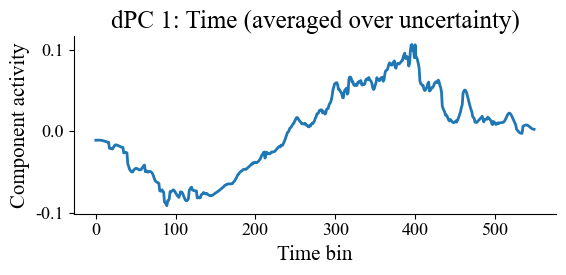

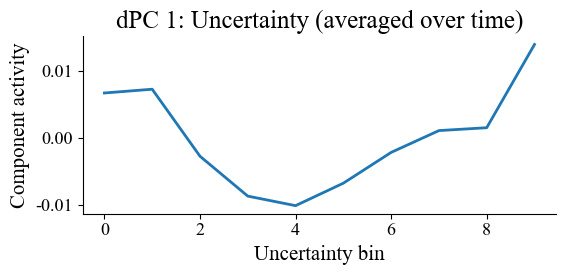

In [78]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from dPCA.dPCA import dPCA

# === Load data ===
fr = np.vstack(timedf['PPC'].to_numpy())           # [T_total, N_neurons]
uncertainty = np.array([u[0, 0] for u in timedf['uncertainty'].to_numpy()]).reshape(-1, 1)
time_bin = timedf['timer'].to_numpy()              # assumed int bin index

n_neurons = fr.shape[1]
n_time_bins = int(np.max(time_bin)) + 1
n_bins_uncert = 10

# === Bin uncertainty ===
uncert_bin = pd.qcut(uncertainty.flatten(), q=n_bins_uncert, labels=False, duplicates='drop')

# === Create data tensor: [neurons, time, uncertainty_bin] ===
X = np.full((n_neurons, n_time_bins, n_bins_uncert), np.nan)

for u in range(n_bins_uncert):
    idx_u = (uncert_bin == u)
    for t in range(n_time_bins):
        idx = idx_u & (time_bin == t)
        if np.any(idx):
            fr_slice = fr[idx]                              # [samples x neurons]
            X[:, t, u] = np.nanmean(fr_slice, axis=0)

# === Fill missing with neuron-wise global mean ===
X_mean = np.nanmean(X, axis=(1, 2), keepdims=True)
X = np.where(np.isnan(X), X_mean, X)

# === Run dPCA ===
dpca = dPCA(labels='tu', regularizer=1e-5)
Z = dpca.fit_transform(X)

# === Plotting ===

# --- Time component (averaged across uncertainty bins) ---
plt.figure(figsize=(6, 3))
plt.plot(np.mean(Z['t'][0], axis=1))  # [time]
plt.title("dPC 1: Time (averaged over uncertainty)")
plt.xlabel("Time bin")
plt.ylabel("Component activity")
plt.tight_layout()
plt.show()

# --- Uncertainty component (averaged across time bins) ---
plt.figure(figsize=(6, 3))
plt.plot(np.mean(Z['u'][0], axis=0))  # [uncertainty bin]
plt.title("dPC 1: Uncertainty (averaged over time)")
plt.xlabel("Uncertainty bin")
plt.ylabel("Component activity")
plt.tight_layout()
plt.show()


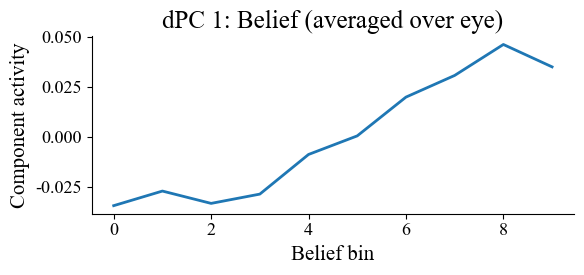

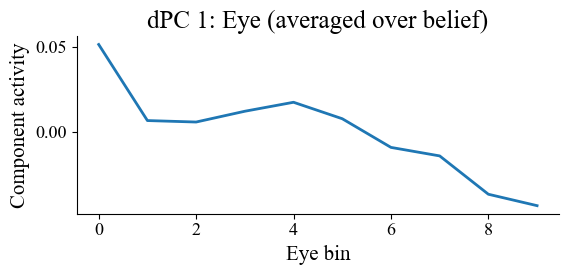

In [79]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from dPCA.dPCA import dPCA

# === Load data ===
fr = np.vstack(timedf['PPC'].to_numpy())           # [T_total, N_neurons]
belief = np.vstack(timedf['belief'].to_numpy())    # [T_total, 1]
eye = np.vstack(timedf['eye'].to_numpy())          # [T_total, 1]

n_neurons = fr.shape[1]
n_bins_belief = 10
n_bins_eye = 10

# === Bin belief and eye ===
belief_bin = pd.qcut(belief.flatten(), q=n_bins_belief, labels=False)
eye_bin = pd.qcut(eye.flatten(), q=n_bins_eye, labels=False, duplicates='drop')

# === Build tensor: [neurons, belief_bin, eye_bin] ===
X = np.full((n_neurons, n_bins_belief, n_bins_eye), np.nan)

for b in range(n_bins_belief):
    for e in range(n_bins_eye):
        idx = (belief_bin == b) & (eye_bin == e)
        if np.any(idx):
            fr_slice = fr[idx]                     # [samples x neurons]
            X[:, b, e] = np.nanmean(fr_slice, axis=0)

# === Fill missing values with neuron-wise mean ===
X_mean = np.nanmean(X, axis=(1, 2), keepdims=True)
X = np.where(np.isnan(X), X_mean, X)

# === Run dPCA ===
dpca = dPCA(labels='be', regularizer=1e-5)
Z = dpca.fit_transform(X)

# === Plot dPCs ===

# --- Belief component (mean over eye) ---
plt.figure(figsize=(6, 3))
plt.plot(np.mean(Z['b'][0], axis=1))  # shape [belief]
plt.title("dPC 1: Belief (averaged over eye)")
plt.xlabel("Belief bin")
plt.ylabel("Component activity")
plt.tight_layout()
plt.show()

# --- Eye component (mean over belief) ---
plt.figure(figsize=(6, 3))
plt.plot(np.mean(Z['e'][0], axis=0))  # shape [eye]
plt.title("dPC 1: Eye (averaged over belief)")
plt.xlabel("Eye bin")
plt.ylabel("Component activity")
plt.tight_layout()
plt.show()


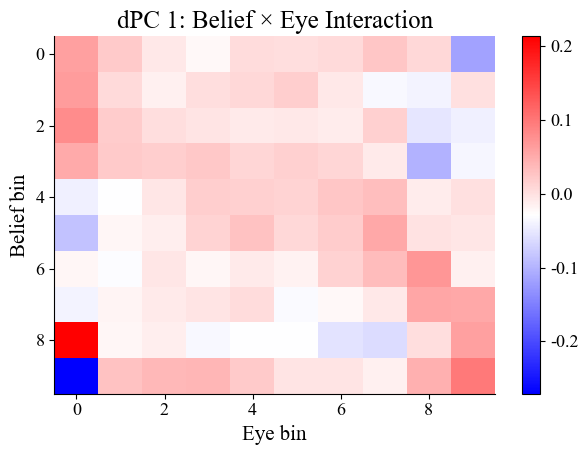

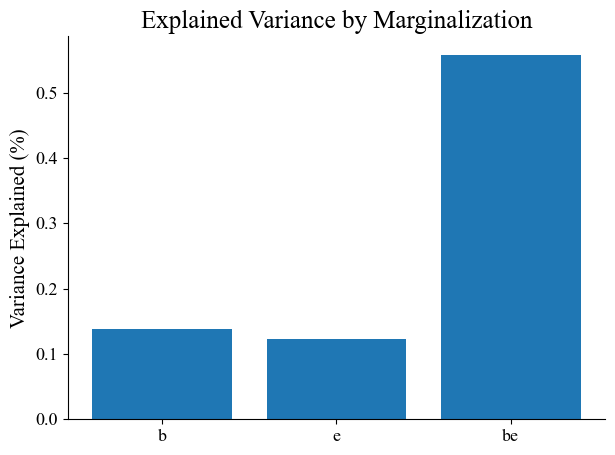

In [80]:
plt.imshow(Z['be'][0], aspect='auto', cmap='bwr')  # shape: [belief_bin, eye_bin]
plt.colorbar()
plt.title("dPC 1: Belief × Eye Interaction")
plt.xlabel("Eye bin")
plt.ylabel("Belief bin")
plt.tight_layout()
plt.show()
expl_var = dpca.explained_variance_ratio_
plt.bar(expl_var.keys(), [np.sum(v) for v in expl_var.values()])
plt.title("Explained Variance by Marginalization")
plt.ylabel("Variance Explained (%)")
plt.tight_layout()
plt.show()


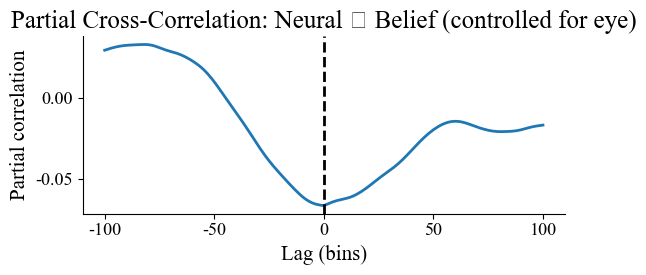

In [81]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from scipy.signal import correlate

# === Load data ===
neural_data = np.vstack(timedf['PPC'].to_numpy())     # [T, N]
belief_data = np.vstack(timedf['belief'].to_numpy())  # [T, 1]
eye_data = np.vstack(timedf['eye'].to_numpy())        # [T, 1]
trial_id = timedf['trial'].to_numpy()                 # [T]

# === Get population activity ===
pop_activity = neural_data.mean(axis=1, keepdims=True)  # [T, 1]

# === Detrend per trial (demean optional) ===
def zscore_within_trials(x, trial_id):
    return np.concatenate([
        (x[trial_id == tid] - np.mean(x[trial_id == tid])) / (np.std(x[trial_id == tid]) + 1e-6)
        for tid in np.unique(trial_id)
    ])

pop_z = zscore_within_trials(pop_activity, trial_id)
belief_z = zscore_within_trials(belief_data, trial_id)
eye_z = zscore_within_trials(eye_data, trial_id)

# === Partial out eye from both belief and neural ===
reg_eye_on_belief = LinearRegression().fit(eye_z, belief_z)
belief_resid = belief_z - reg_eye_on_belief.predict(eye_z)

reg_eye_on_neural = LinearRegression().fit(eye_z, pop_z)
neural_resid = pop_z - reg_eye_on_neural.predict(eye_z)

# === Compute cross-correlation ===
max_lag = 100  # in time bins (adjust if needed)
corr = correlate(neural_resid[:, 0], belief_resid[:, 0], mode='full', method='auto')
lags = np.arange(-len(neural_resid) + 1, len(neural_resid))

# Restrict to desired lag window
center = len(corr) // 2
lag_idx = np.arange(center - max_lag, center + max_lag + 1)
corr = corr[lag_idx]
lags = lags[lag_idx]

# Normalize correlation
corr /= np.std(neural_resid) * np.std(belief_resid) * len(neural_resid)

# === Plot ===
plt.figure(figsize=(6, 3))
plt.plot(lags, corr)
plt.axvline(0, color='k', linestyle='--')
plt.title("Partial Cross-Correlation: Neural ⟷ Belief (controlled for eye)")
plt.xlabel("Lag (bins)")
plt.ylabel("Partial correlation")
plt.tight_layout()
plt.show()


Analyzing cross-correlation for session 1/5...
Analyzing cross-correlation for session 2/5...
Analyzing cross-correlation for session 3/5...
Analyzing cross-correlation for session 4/5...
Analyzing cross-correlation for session 5/5...


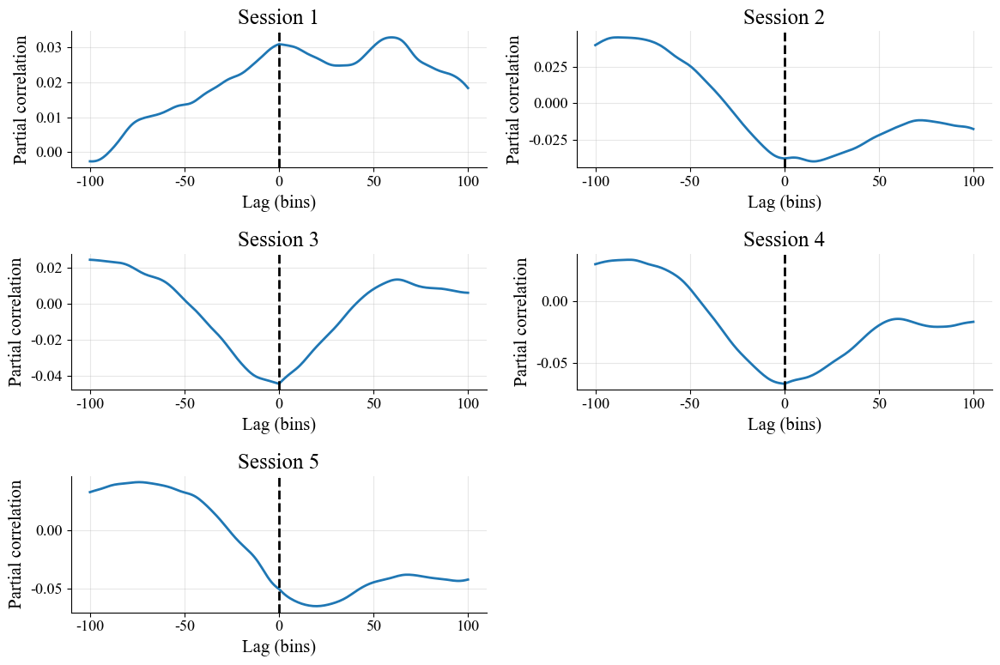

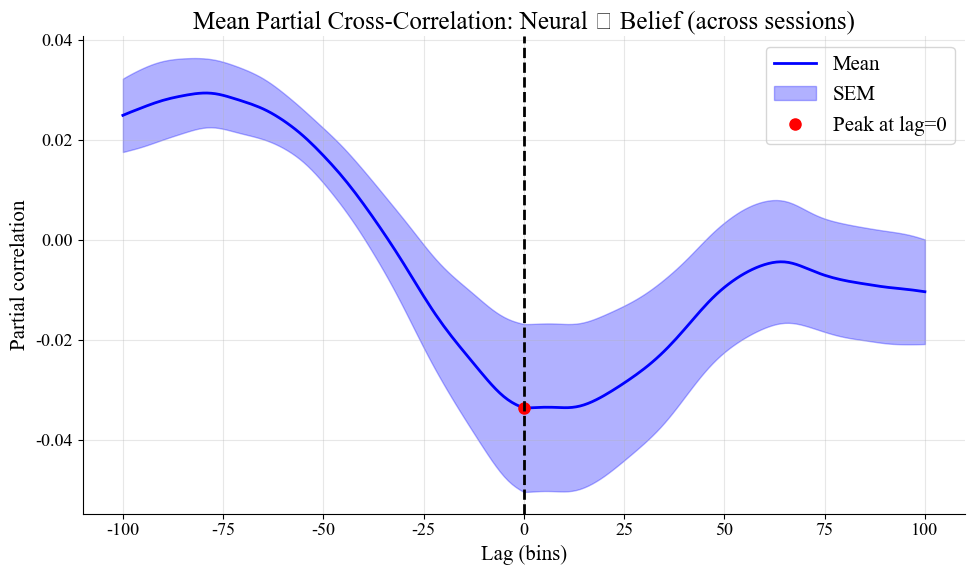

In [93]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from scipy.signal import correlate
import seaborn as sns
from scipy.stats import sem

def analyze_cross_correlation(timedf):
    """
    Analyze cross-correlation between neural data and belief for a single session
    
    Parameters:
        timedf: DataFrame with neural, belief, and eye data
        
    Returns:
        corr: Normalized cross-correlation values
        lags: Corresponding lag values
    """
    # === Load data ===
    neural_data = np.vstack(timedf['PPC'].to_numpy())     # [T, N]
    belief_data = np.vstack(timedf['belief'].to_numpy())  # [T, 1]
    eye_data = np.vstack(timedf['eye'].to_numpy())        # [T, 1]
    trial_id = timedf['trial'].to_numpy()                 # [T]

    # === Get population activity ===
    pop_activity = neural_data.mean(axis=1, keepdims=True)  # [T, 1]

    # === Detrend per trial (demean optional) ===
    def zscore_within_trials(x, trial_id):
        return np.concatenate([
            (x[trial_id == tid] - np.mean(x[trial_id == tid])) / (np.std(x[trial_id == tid]) + 1e-6)
            for tid in np.unique(trial_id)
        ])

    pop_z = zscore_within_trials(pop_activity, trial_id)
    belief_z = zscore_within_trials(belief_data, trial_id)
    eye_z = zscore_within_trials(eye_data, trial_id)

    # === Partial out eye from both belief and neural ===
    reg_eye_on_belief = LinearRegression().fit(eye_z, belief_z)
    belief_resid = belief_z - reg_eye_on_belief.predict(eye_z)

    reg_eye_on_neural = LinearRegression().fit(eye_z, pop_z)
    neural_resid = pop_z - reg_eye_on_neural.predict(eye_z)

    # === Compute cross-correlation ===
    max_lag = 100  # in time bins (adjust if needed)
    corr = correlate(neural_resid[:, 0], belief_resid[:, 0], mode='full', method='auto')
    lags = np.arange(-len(neural_resid) + 1, len(neural_resid))

    # Restrict to desired lag window
    center = len(corr) // 2
    lag_idx = np.arange(center - max_lag, center + max_lag + 1)
    corr = corr[lag_idx]
    lags = lags[lag_idx]

    # Normalize correlation
    corr /= np.std(neural_resid) * np.std(belief_resid) * len(neural_resid)
    
    return corr, lags

def plot_cross_correlations(all_corrs, all_lags, session_names=None):
    """
    Plot cross-correlations from multiple sessions
    
    Parameters:
        all_corrs: List of correlation arrays from each session
        all_lags: List of lag arrays from each session
        session_names: Optional list of session names
    """
    if session_names is None:
        session_names = [f"Session {i+1}" for i in range(len(all_corrs))]
    
    # === Plot individual sessions ===
    plt.figure(figsize=(12, 8))
    
    # Create subplot grid
    n_sessions = len(all_corrs)
    n_rows = int(np.ceil(n_sessions / 2))
    
    for i, (corr, lags, name) in enumerate(zip(all_corrs, all_lags, session_names)):
        plt.subplot(n_rows, 2, i+1)
        plt.plot(lags, corr)
        plt.axvline(0, color='k', linestyle='--')
        plt.title(f"{name}")
        plt.xlabel("Lag (bins)")
        plt.ylabel("Partial correlation")
        plt.grid(alpha=0.3)
    
    plt.tight_layout()
    
    # === Plot mean across sessions ===
    plt.figure(figsize=(10, 6))
    
    # Interpolate to common lag axis if needed
    min_lag = max([min(lags) for lags in all_lags])
    max_lag = min([max(lags) for lags in all_lags])
    common_lags = np.arange(min_lag, max_lag + 1)
    
    # Resample each correlation to common lag axis
    resampled_corrs = []
    for i, (corr, lags) in enumerate(zip(all_corrs, all_lags)):
        # Find indices within common range
        valid_idx = (lags >= min_lag) & (lags <= max_lag)
        valid_lags = lags[valid_idx]
        valid_corr = corr[valid_idx]
        
        # Only need to resample if lags don't exactly match common_lags
        if len(valid_lags) != len(common_lags) or not np.all(valid_lags == common_lags):
            from scipy.interpolate import interp1d
            f = interp1d(valid_lags, valid_corr, bounds_error=False, fill_value=np.nan)
            resampled_corr = f(common_lags)
        else:
            resampled_corr = valid_corr
            
        resampled_corrs.append(resampled_corr)
    
    # Stack resampled correlations and compute statistics
    stacked_corrs = np.vstack(resampled_corrs)
    mean_corr = np.nanmean(stacked_corrs, axis=0)
    sem_corr = sem(stacked_corrs, axis=0, nan_policy='omit')
    
    # Plot mean and standard error
    plt.plot(common_lags, mean_corr, 'b-', linewidth=2, label='Mean')
    plt.fill_between(common_lags, mean_corr - sem_corr, mean_corr + sem_corr, 
                     color='b', alpha=0.3, label='SEM')
    
    # Find and mark the peak
    peak_idx = np.nanargmax(np.abs(mean_corr))
    peak_lag = common_lags[peak_idx]
    peak_corr = mean_corr[peak_idx]
    plt.plot(peak_lag, peak_corr, 'ro', markersize=8, label=f'Peak at lag={peak_lag}')
    
    plt.axvline(0, color='k', linestyle='--')
    plt.title("Mean Partial Cross-Correlation: Neural ⟷ Belief (across sessions)")
    plt.xlabel("Lag (bins)")
    plt.ylabel("Partial correlation")
    plt.grid(alpha=0.3)
    plt.legend()
    
    plt.tight_layout()
    plt.show()

# Main analysis pipeline
def main(df, gettimedf):
    """
    Main function to run cross-correlation analysis across sessions
    
    Parameters:
        df: DataFrame with session information
        gettimedf: Function to process session data into time series
        
    Returns:
        all_corrs: List of correlation arrays
        all_lags: List of lag arrays
    """
    # Initialize lists to store results
    all_corrs = []
    all_lags = []
    
    # Get unique sessions and sort them
    unique_sessions = sorted(df.session.unique())[:5]
    session_names = [f"Session {ithsess+1}" for ithsess in range(len(unique_sessions))]
    
    # Loop through sessions
    for ithsess in range(len(unique_sessions)):
        print(f"Analyzing cross-correlation for session {ithsess+1}/{len(unique_sessions)}...")
        
        # Filter data for this session
        sessdf = df[df.session == unique_sessions[ithsess]]
        
        # Get time-based dataframe
        timedf = gettimedf(sessdf)
        
        # Skip sessions with insufficient data
        if len(timedf) < 200:  # Adjust threshold as needed
            print(f"  Skipping session {ithsess+1} due to insufficient data")
            continue
        
        # Analyze cross-correlation
        try:
            corr, lags = analyze_cross_correlation(timedf)
            all_corrs.append(corr)
            all_lags.append(lags)
        except Exception as e:
            print(f"  Error analyzing session {ithsess+1}: {e}")
            continue
    
    # Plot results
    if all_corrs:
        plot_cross_correlations(all_corrs, all_lags, session_names[:len(all_corrs)])
    else:
        print("No valid sessions to analyze")
    
    return all_corrs, all_lags

# Call the main function (uncomment when ready to run)
all_corrs, all_lags = main(df, gettimedf)

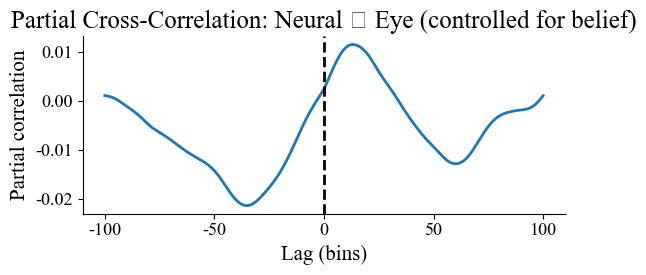

In [82]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from scipy.signal import correlate

# === Load data ===
neural_data = np.vstack(timedf['PPC'].to_numpy())     # [T, N]
belief_data = np.vstack(timedf['belief'].to_numpy())  # [T, 1]
eye_data = np.vstack(timedf['eye'].to_numpy())        # [T, 1]
trial_id = timedf['trial'].to_numpy()                 # [T]

# === Get population activity ===
pop_activity = neural_data.mean(axis=1, keepdims=True)  # [T, 1]

# === Detrend per trial (demean + z-score) ===
def zscore_within_trials(x, trial_id):
    return np.concatenate([
        (x[trial_id == tid] - np.mean(x[trial_id == tid])) / (np.std(x[trial_id == tid]) + 1e-6)
        for tid in np.unique(trial_id)
    ])

pop_z = zscore_within_trials(pop_activity, trial_id)
belief_z = zscore_within_trials(belief_data, trial_id)
eye_z = zscore_within_trials(eye_data, trial_id)

# === Partial out belief from both neural and eye ===
reg_belief_on_eye = LinearRegression().fit(belief_z, eye_z)
eye_resid = eye_z - reg_belief_on_eye.predict(belief_z)

reg_belief_on_neural = LinearRegression().fit(belief_z, pop_z)
neural_resid = pop_z - reg_belief_on_neural.predict(belief_z)

# === Compute cross-correlation ===
max_lag = 100  # in time bins
corr = correlate(neural_resid[:, 0], eye_resid[:, 0], mode='full', method='auto')
lags = np.arange(-len(neural_resid) + 1, len(neural_resid))

# Restrict to desired lag window
center = len(corr) // 2
lag_idx = np.arange(center - max_lag, center + max_lag + 1)
corr = corr[lag_idx]
lags = lags[lag_idx]

# Normalize correlation
corr /= np.std(neural_resid) * np.std(eye_resid) * len(neural_resid)

# === Plot ===
plt.figure(figsize=(6, 3))
plt.plot(lags, corr)
plt.axvline(0, color='k', linestyle='--')
plt.title("Partial Cross-Correlation: Neural ⟷ Eye (controlled for belief)")
plt.xlabel("Lag (bins)")
plt.ylabel("Partial correlation")
plt.tight_layout()
plt.show()


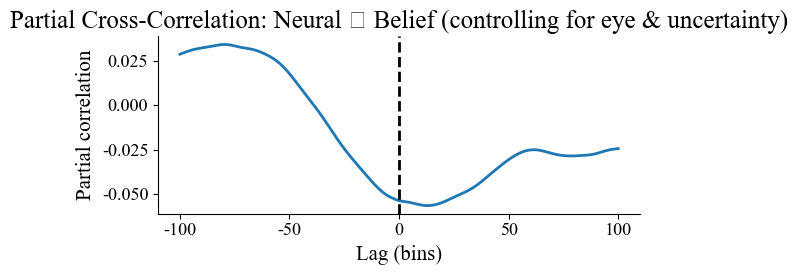

In [83]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from scipy.signal import correlate

# Load the required data arrays
neural_data = np.vstack(timedf['PPC'].to_numpy())     # [T, N]
belief_data = np.vstack(timedf['belief'].to_numpy())  # [T, 1]
eye_data = np.vstack(timedf['eye'].to_numpy())        # [T, 1]
uncertainty_data = np.array([u[0, 0] for u in timedf['uncertainty'].to_numpy()]).reshape(-1, 1)
trial_id = timedf['trial'].to_numpy()                 # [T]

# Compute population activity
pop_activity = neural_data.mean(axis=1, keepdims=True)  # [T, 1]

# Detrend per trial
def zscore_within_trials(x, trial_id):
    return np.concatenate([
        (x[trial_id == tid] - np.mean(x[trial_id == tid])) / (np.std(x[trial_id == tid]) + 1e-6)
        for tid in np.unique(trial_id)
    ])

pop_z = zscore_within_trials(pop_activity, trial_id)
belief_z = zscore_within_trials(belief_data, trial_id)
eye_z = zscore_within_trials(eye_data, trial_id)
uncert_z = zscore_within_trials(uncertainty_data, trial_id)

# Regress out uncertainty and eye from belief
X_confounds = np.hstack([eye_z, uncert_z])
reg = LinearRegression().fit(X_confounds, belief_z)
belief_resid = belief_z - reg.predict(X_confounds)

# Regress out uncertainty and eye from neural
reg = LinearRegression().fit(X_confounds, pop_z)
neural_resid = pop_z - reg.predict(X_confounds)

# Compute cross-correlation
max_lag = 100
corr = correlate(neural_resid[:, 0], belief_resid[:, 0], mode='full')
lags = np.arange(-len(neural_resid) + 1, len(neural_resid))

# Trim to lag window
center = len(corr) // 2
lag_idx = np.arange(center - max_lag, center + max_lag + 1)
corr = corr[lag_idx]
lags = lags[lag_idx]

# Normalize
corr /= np.std(neural_resid) * np.std(belief_resid) * len(neural_resid)

# Plot
plt.figure(figsize=(6, 3))
plt.plot(lags, corr)
plt.axvline(0, color='k', linestyle='--')
plt.title("Partial Cross-Correlation: Neural ⟷ Belief (controlling for eye & uncertainty)")
plt.xlabel("Lag (bins)")
plt.ylabel("Partial correlation")
plt.tight_layout()
plt.show()


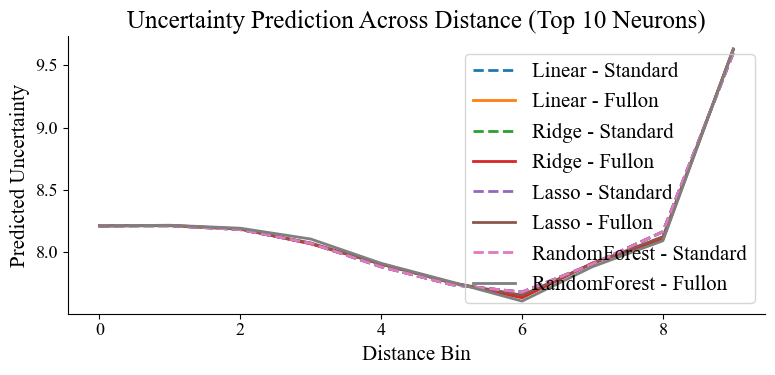

In [84]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import StandardScaler

DT = 0.006
timedf['distance_traveled'] = timedf.groupby('trial')['mv'].transform(lambda v: np.cumsum(v) * DT)
timedf['dist_bin'] = pd.qcut(timedf['distance_traveled'], q=10, labels=False, duplicates='drop')

# Extract neural data and target
neural_data = np.vstack(timedf['PPC'].to_numpy())          # [T, N]
uncertainty = np.array([u[0] for u in timedf['uncertainty'].to_numpy()])
is_standard = ~timedf['fullon'].to_numpy()

# === Select top 10 neurons based on linear regression R² (standard trials only) ===
r2_scores = []
for i in range(neural_data.shape[1]):
    X_i = neural_data[is_standard, i].reshape(-1, 1)
    y = uncertainty[is_standard]
    model = LinearRegression().fit(X_i, y)
    r2 = model.score(X_i, y)
    r2_scores.append(r2)

top_neuron_idx = np.argsort(r2_scores)[-10:]
neural_data = neural_data[:, top_neuron_idx]

# Standardize neural data
scaler = StandardScaler()
neural_data_scaled = scaler.fit_transform(neural_data)

# Initialize model families
models = {
    'Linear': LinearRegression(),
    'Ridge': Ridge(alpha=1.0),
    'Lasso': Lasso(alpha=0.1),
    'RandomForest': RandomForestRegressor(n_estimators=100, max_depth=5, random_state=0)
}

results = {name: {'standard': [], 'fullon': []} for name in models}

# Iterate over distance bins
for b in sorted(timedf['dist_bin'].dropna().unique()):
    idx_bin = timedf['dist_bin'] == b
    idx_train = idx_bin & (~timedf['fullon'])
    idx_test = idx_bin & timedf['fullon']

    if idx_train.sum() < 10 or idx_test.sum() < 10:
        continue

    X_train = neural_data_scaled[idx_train]
    y_train = uncertainty[idx_train]
    X_test = neural_data_scaled[idx_test]

    for name, model in models.items():
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        results[name]['standard'].append(np.mean(y_train))
        results[name]['fullon'].append(np.mean(y_pred))

# Plot
plt.figure(figsize=(8, 4))
bins = sorted(timedf['dist_bin'].dropna().unique())
for name in models:
    plt.plot(bins, results[name]['standard'], label=f"{name} - Standard", linestyle='--')
    plt.plot(bins, results[name]['fullon'], label=f"{name} - Fullon")

plt.xlabel("Distance Bin")
plt.ylabel("Predicted Uncertainty")
plt.title("Uncertainty Prediction Across Distance (Top 10 Neurons)")
plt.legend()
plt.tight_layout()
plt.show()


Analyzing full-on effect for session 1/26...
38049 349841
Analyzing full-on effect for session 2/26...
33173 328703
Analyzing full-on effect for session 3/26...
31380 311860
Analyzing full-on effect for session 4/26...
28952 265082
Analyzing full-on effect for session 5/26...
9206 87410
Analyzing full-on effect for session 6/26...
33076 298956
Analyzing full-on effect for session 7/26...
36331 328351
Analyzing full-on effect for session 8/26...
37324 327526
Analyzing full-on effect for session 9/26...
43379 375876
Analyzing full-on effect for session 10/26...
13183 136694
Analyzing full-on effect for session 11/26...
37967 367362
Analyzing full-on effect for session 12/26...
49291 402179
Analyzing full-on effect for session 13/26...
47710 410508
Analyzing full-on effect for session 14/26...
49967 394745
Analyzing full-on effect for session 15/26...
42458 377768
Analyzing full-on effect for session 16/26...
43205 368608
Analyzing full-on effect for session 17/26...
41986 378583
Analyzin

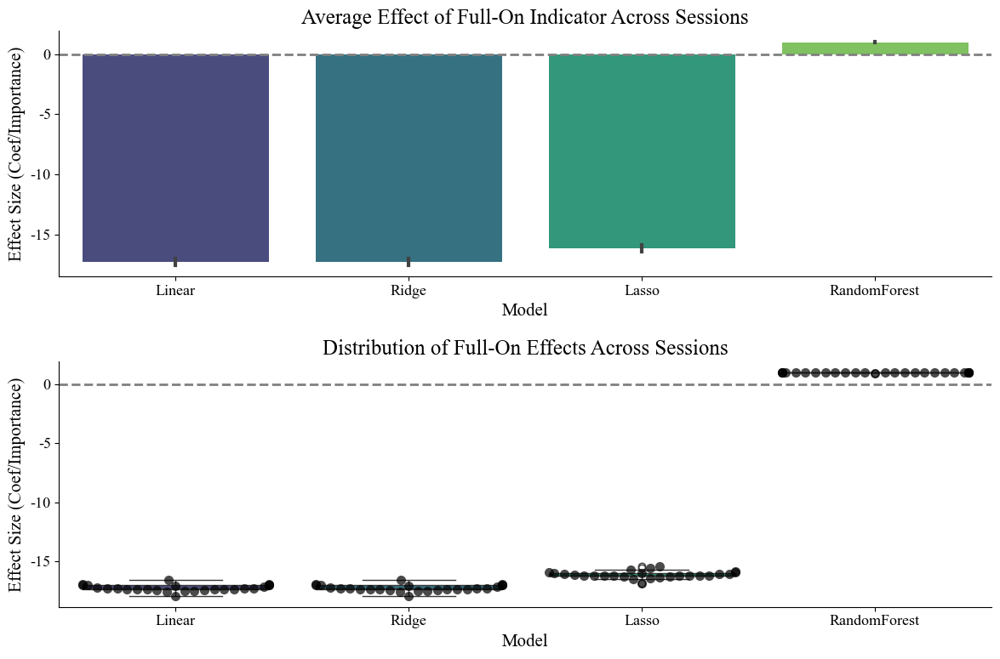

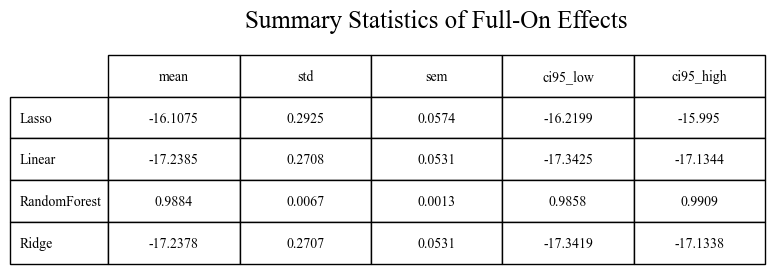

In [98]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import StandardScaler
import seaborn as sns
from scipy.stats import sem

def analyze_fullon_effect(timedf, DT=0.006):
    """
    Analyze the effect of full-on indicator on uncertainty for a single session
    
    Parameters:
        timedf: DataFrame with neural data and uncertainty
        DT: Time bin duration in seconds
        
    Returns:
        fullon_effect: Dictionary with effect sizes for different models
    """
    # Compute distance traveled and bin
    timedf['distance_traveled'] = timedf.groupby('trial')['mv'].transform(lambda v: np.cumsum(v) * DT)
    timedf['dist_bin'] = pd.qcut(timedf['distance_traveled'], q=10, labels=False, duplicates='drop')

    # Extract relevant data
    neural_data = np.vstack(timedf['PPC'].to_numpy())                      # [T, N]
    uncertainty = np.array([u[0] for u in timedf['uncertainty'].to_numpy()])  # [T,]
    fullon_flag = timedf['fullon'].astype(int).to_numpy()                 # [T,]
    is_standard = ~timedf['fullon'].to_numpy()
    print(len(timedf[timedf['fullon'] == 1]), len(timedf[timedf['fullon'] == 0]))
    
    # Check if we have enough standard trials to proceed
    # if np.sum(is_standard) < 10:
    #     return None  # Not enough data for a reliable analysis

    # --- Select Top 10 Neurons ---
    r2_scores = []
    for i in range(neural_data.shape[1]):
        X_i = neural_data[is_standard, i].reshape(-1, 1)
        y = uncertainty[is_standard]
        model = LinearRegression().fit(X_i, y)
        r2_scores.append(model.score(X_i, y))

    # Select top neurons (up to 10, but might be fewer if there are fewer neurons)
    top_k = min(10, len(r2_scores))
    top_idx = np.argsort(r2_scores)[-top_k:]
    neural_data = neural_data[:, top_idx]

    # --- Standardize neural data ---
    scaler = StandardScaler()
    neural_data_scaled = scaler.fit_transform(neural_data)

    # --- Add fullon flag to inputs ---
    X_all = np.hstack([neural_data_scaled, fullon_flag.reshape(-1, 1)])  # [T, top_k+1]

    # --- Define models ---
    models = {
        'Linear': LinearRegression(),
        'Ridge': Ridge(alpha=1.0),
        'Lasso': Lasso(alpha=0.1),
        'RandomForest': RandomForestRegressor(n_estimators=100, max_depth=5, random_state=0)
    }

    # --- Fit models and extract fullon effect ---
    fullon_effect = {}
    for name, model in models.items():
        try:
            model.fit(X_all, uncertainty)
            if hasattr(model, 'coef_'):
                coef = model.coef_
                # If it's 1D (e.g., [10 + 1]), just get the last element
                if coef.ndim == 1:
                    fullon_effect[name] = float(coef[-1])
                # If it's 2D (e.g., [1, 11]), also get last element from first row
                elif coef.ndim == 2:
                    fullon_effect[name] = float(coef[0, -1])
            elif hasattr(model, 'feature_importances_'):
                fullon_effect[name] = float(model.feature_importances_[-1])
        except Exception as e:
            print(f"Error fitting {name} model: {e}")
            fullon_effect[name] = np.nan
            
    return fullon_effect

def plot_fullon_effects(all_session_effects, session_names=None):
    """
    Plot the fullon effects across all sessions
    
    Parameters:
        all_session_effects: List of dictionaries with effect sizes
        session_names: Optional list of session names
    """
    if not all_session_effects:
        print("No valid sessions to plot")
        return
        
    # Extract model names (should be the same across sessions)
    model_names = list(all_session_effects[0].keys())
    
    # Create a DataFrame to hold all results
    results_data = []
    for i, effects in enumerate(all_session_effects):
        session_name = session_names[i] if session_names else f"Session {i+1}"
        for model_name, effect in effects.items():
            results_data.append({
                'Session': session_name,
                'Model': model_name,
                'Effect': effect
            })
    
    results_df = pd.DataFrame(results_data)
    
    # --- Create combined plots ---
    plt.figure(figsize=(12, 8))
    
    # 1. Bar plot of effects by model (averaged across sessions)
    plt.subplot(2, 1, 1)
    sns.barplot(x='Model', y='Effect', data=results_df, 
                ci='sd', palette='viridis')
    plt.axhline(0, color='gray', linestyle='--')
    plt.title("Average Effect of Full-On Indicator Across Sessions")
    plt.ylabel("Effect Size (Coef/Importance)")
    
    # 2. Effect by session and model
    plt.subplot(2, 1, 2)
    sns.boxplot(x='Model', y='Effect', data=results_df, palette='viridis')
    sns.swarmplot(x='Model', y='Effect', data=results_df, 
                  color='black', alpha=0.7, size=8)
    plt.axhline(0, color='gray', linestyle='--')
    plt.title("Distribution of Full-On Effects Across Sessions")
    plt.ylabel("Effect Size (Coef/Importance)")
    
    plt.tight_layout()
    
    # --- Summary statistics Table ---
    plt.figure(figsize=(8, 3))
    summary = results_df.groupby('Model')['Effect'].agg(['mean', 'std', 'sem'])
    summary['ci95_low'] = summary['mean'] - 1.96 * summary['sem']
    summary['ci95_high'] = summary['mean'] + 1.96 * summary['sem']
    
    plt.axis('off')
    table = plt.table(
        cellText=np.round(summary.values, 4),
        colLabels=summary.columns,
        rowLabels=summary.index,
        cellLoc='center',
        loc='center',
        bbox=[0.0, 0.0, 1.0, 1.0]
    )
    table.auto_set_font_size(False)
    table.set_fontsize(10)
    table.scale(1.2, 1.5)
    plt.title("Summary Statistics of Full-On Effects", pad=20)
    
    plt.tight_layout()
    plt.show()

# Main analysis pipeline
def main(df, gettimedf, DT=0.006):
    """
    Main function to analyze fullon effects across sessions
    
    Parameters:
        df: DataFrame with session information
        gettimedf: Function to process session data into time series
        DT: Time bin duration in seconds
        
    Returns:
        all_session_effects: List of dictionaries with effect sizes
    """
    # Initialize list to store results
    all_session_effects = []
    
    # Get unique sessions and sort them
    unique_sessions = sorted(df.session.unique())
    session_names = [f"Session {ithsess+1}" for ithsess in range(len(unique_sessions))]
    
    # Loop through sessions
    for ithsess in range(len(unique_sessions)):
        print(f"Analyzing full-on effect for session {ithsess+1}/{len(unique_sessions)}...")
        
        # Filter data for this session
        sessdf = df[df.session == unique_sessions[ithsess]]
        
        # Get time-based dataframe
        timedf = gettimedf(sessdf)
        
        # Skip sessions with insufficient data
        if len(timedf) < 100:  # Adjust threshold as needed
            print(f"  Skipping session {ithsess+1} due to insufficient data")
            continue
            
        # Ensure 'fullon' column exists
        if 'fullon' not in timedf.columns:
            print(f"  Skipping session {ithsess+1}: 'fullon' column missing")
            continue
            
        # Analyze fullon effect
        try:
            session_effects = analyze_fullon_effect(timedf, DT)
            if session_effects:
                all_session_effects.append(session_effects)
            else:
                print(f"  Skipping session {ithsess+1}: Not enough standard trials")
        except Exception as e:
            print(f"  Error analyzing session {ithsess+1}: {e}")
            continue
    
    # Plot results
    if all_session_effects:
        plot_fullon_effects(all_session_effects, session_names[:len(all_session_effects)])
    else:
        print("No valid sessions to analyze")
    
    return all_session_effects

# Call the main function (uncomment when ready to run)
all_session_effects = main(df, gettimedf, DT=0.006)

Analyzing partial correlations for session 1/26...
  Successfully analyzed session 1 with 80 neurons
Analyzing partial correlations for session 2/26...
  Successfully analyzed session 2 with 68 neurons
Analyzing partial correlations for session 3/26...
  Error in GraphicalLasso analysis: The system is too ill-conditioned for this solver. The system is too ill-conditioned for this solver
Analyzing partial correlations for session 4/26...
  Successfully analyzed session 4 with 79 neurons
Analyzing partial correlations for session 5/26...
  Successfully analyzed session 5 with 87 neurons
Analyzing partial correlations for session 6/26...
  Successfully analyzed session 6 with 88 neurons
Analyzing partial correlations for session 7/26...
  Successfully analyzed session 7 with 80 neurons
Analyzing partial correlations for session 8/26...
  Successfully analyzed session 8 with 73 neurons
Analyzing partial correlations for session 9/26...
  Successfully analyzed session 9 with 64 neurons
Anal

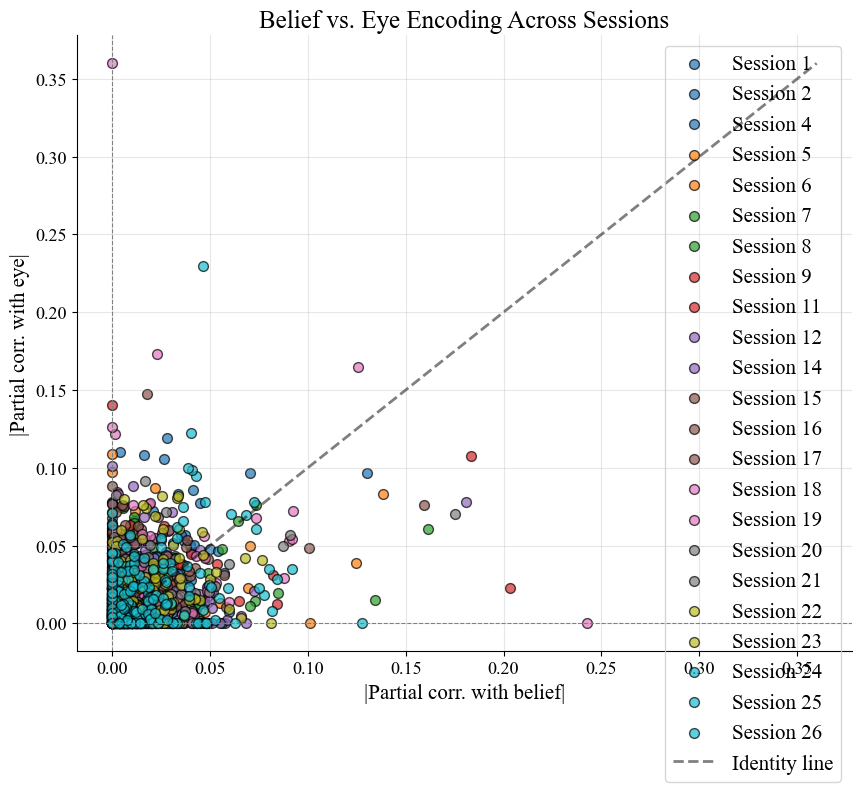

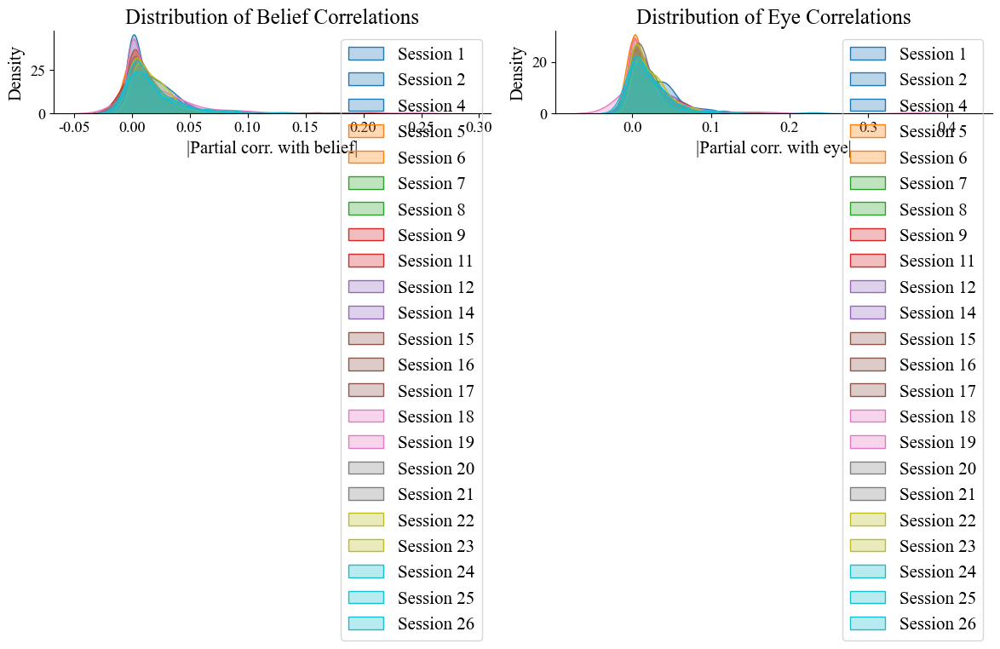

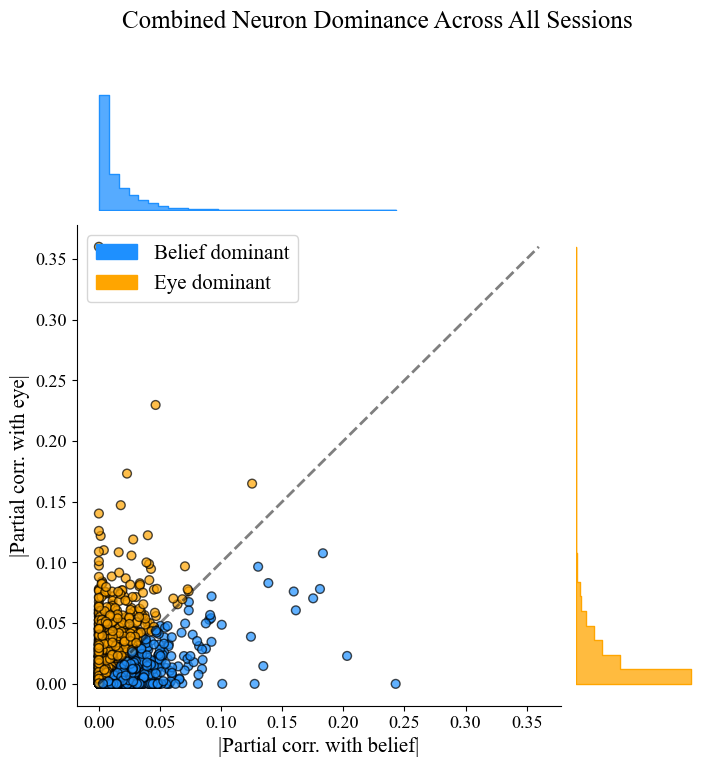

Summary across 23 sessions:
Total neurons analyzed: 1666
Belief-dominant neurons: 766 (46.0%)
Eye-dominant neurons: 900 (54.0%)


In [99]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.covariance import GraphicalLassoCV
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import ListedColormap
import matplotlib.patches as mpatches

def analyze_partial_correlations(timedf, bin_size=20):
    """
    Analyze partial correlations between neurons, belief, and eye using Graphical Lasso
    
    Parameters:
        timedf: DataFrame with neural, belief, and eye data
        bin_size: Number of time bins to average
        
    Returns:
        belief_pc: Partial correlations between neurons and belief
        eye_pc: Partial correlations between neurons and eye
    """
    # ==== Step 1: Bin time ====
    n_total = len(timedf)
    n_bins = n_total // bin_size
    
    if n_bins < 10:  # Skip if not enough bins
        return None, None
    
    def bin_and_average(data):
        data = np.vstack(data)[:n_bins * bin_size]
        return data.reshape(n_bins, bin_size, -1).mean(axis=1)
    
    try:
        # Extract and bin
        neural = bin_and_average(timedf['PPC'])           # [T_bins, N]
        belief = bin_and_average(timedf['belief'])        # [T_bins, 1]
        eye = bin_and_average(timedf['eye'])              # [T_bins, 1]
        
        # ==== Step 2: Stack features ====
        X = np.hstack([neural, belief, eye])  # [T_bins, N + 2]
        
        # Standardize
        X = StandardScaler().fit_transform(X)
        
        # ==== Step 3: Fit Graphical Lasso ====
        model = GraphicalLassoCV(cv=5)
        model.fit(X)
        
        precision = model.precision_
        n_neurons = neural.shape[1]
        labels = [f'N{i}' for i in range(n_neurons)] + ['belief', 'eye']
        
        # ==== Step 4: Extract partial correlation ====
        # Helper to get partial corr. from precision
        def partial_corr(precision_matrix, i, j):
            return -precision_matrix[i, j] / (
                np.sqrt(precision_matrix[i, i] * precision_matrix[j, j]) + 1e-8
            )
        
        # Partial corr. between each neuron and belief
        idx_belief = labels.index('belief')
        belief_pc = [
            partial_corr(precision, i, idx_belief) for i in range(n_neurons)
        ]
        
        # Partial corr. between each neuron and eye
        idx_eye = labels.index('eye')
        eye_pc = [
            partial_corr(precision, i, idx_eye) for i in range(n_neurons)
        ]
        
        return np.array(belief_pc), np.array(eye_pc)
    
    except Exception as e:
        print(f"  Error in GraphicalLasso analysis: {e}")
        return None, None

def plot_combined_scatter(all_belief_pc, all_eye_pc, session_names=None):
    """
    Create combined scatter plots of partial correlations
    
    Parameters:
        all_belief_pc: List of arrays with belief partial correlations
        all_eye_pc: List of arrays with eye partial correlations
        session_names: Optional list of session names
    """
    if not all_belief_pc:
        print("No valid sessions to plot")
        return
    
    # Take the absolute values for scatter plotting
    abs_belief_pc_all = [np.abs(pc) for pc in all_belief_pc]
    abs_eye_pc_all = [np.abs(pc) for pc in all_eye_pc]
    
    # Create a color palette for sessions
    n_sessions = len(all_belief_pc)
    colors = plt.cm.tab10(np.linspace(0, 1, n_sessions))
    
    # === Combined scatter plot ===
    plt.figure(figsize=(10, 8))
    
    # Plot each session's data with different colors
    for i, (belief_pc, eye_pc) in enumerate(zip(abs_belief_pc_all, abs_eye_pc_all)):
        session_name = session_names[i] if session_names else f"Session {i+1}"
        plt.scatter(belief_pc, eye_pc, c=[colors[i]], label=session_name, 
                   alpha=0.7, edgecolor='k', s=50)
    
    # Add reference lines
    plt.axhline(0, color='gray', linestyle='--', linewidth=0.8)
    plt.axvline(0, color='gray', linestyle='--', linewidth=0.8)
    
    # Add identity line
    max_val = max(np.max([np.max(pc) for pc in abs_belief_pc_all]), 
                 np.max([np.max(pc) for pc in abs_eye_pc_all]))
    plt.plot([0, max_val], [0, max_val], 'k--', alpha=0.5, label='Identity line')
    
    plt.xlabel("|Partial corr. with belief|")
    plt.ylabel("|Partial corr. with eye|")
    plt.title("Belief vs. Eye Encoding Across Sessions")
    plt.legend(loc='best')
    plt.grid(alpha=0.3)
    
    # === Combined histograms ===
    plt.figure(figsize=(12, 5))
    
    plt.subplot(1, 2, 1)
    for i, belief_pc in enumerate(all_belief_pc):
        session_name = session_names[i] if session_names else f"Session {i+1}"
        sns.kdeplot(np.abs(belief_pc), color=colors[i], label=session_name, fill=True, alpha=0.3)
    plt.xlabel("|Partial corr. with belief|")
    plt.ylabel("Density")
    plt.title("Distribution of Belief Correlations")
    plt.legend()
    
    plt.subplot(1, 2, 2)
    for i, eye_pc in enumerate(all_eye_pc):
        session_name = session_names[i] if session_names else f"Session {i+1}"
        sns.kdeplot(np.abs(eye_pc), color=colors[i], label=session_name, fill=True, alpha=0.3)
    plt.xlabel("|Partial corr. with eye|")
    plt.ylabel("Density")
    plt.title("Distribution of Eye Correlations")
    plt.legend()
    
    plt.tight_layout()
    
    # === Belief vs. Eye dominance plot ===
    # Combine all neurons across sessions
    all_belief = np.concatenate(abs_belief_pc_all)
    all_eye = np.concatenate(abs_eye_pc_all)
    
    plt.figure(figsize=(8, 8))
    gs = plt.GridSpec(2, 2, width_ratios=[4, 1], height_ratios=[1, 4], hspace=0.05, wspace=0.05)
    
    # Main scatter
    ax_scatter = plt.subplot(gs[1, 0])
    dominance = np.where(all_belief >= all_eye, 'belief', 'eye')
    dominance_colors = np.where(dominance == 'belief', 'dodgerblue', 'orange')
    
    ax_scatter.scatter(all_belief, all_eye, c=dominance_colors, edgecolor='k', alpha=0.7, s=40)
    
    # Add reference lines
    max_val = max(np.max(all_belief), np.max(all_eye))
    ax_scatter.plot([0, max_val], [0, max_val], 'k--', alpha=0.5)
    ax_scatter.set_xlabel("|Partial corr. with belief|")
    ax_scatter.set_ylabel("|Partial corr. with eye|")
    
    # Top histogram
    ax_top = plt.subplot(gs[0, 0], sharex=ax_scatter)
    sns.histplot(all_belief, bins=30, color='dodgerblue', ax=ax_top, element="step")
    ax_top.axis('off')
    
    # Right histogram
    ax_right = plt.subplot(gs[1, 1], sharey=ax_scatter)
    sns.histplot(y=all_eye, bins=30, color='orange', ax=ax_right, element="step")
    ax_right.axis('off')
    
    # Add legend
    belief_patch = mpatches.Patch(color='dodgerblue', label='Belief dominant')
    eye_patch = mpatches.Patch(color='orange', label='Eye dominant')
    ax_scatter.legend(handles=[belief_patch, eye_patch], loc='upper left')
    
    plt.suptitle("Combined Neuron Dominance Across All Sessions", y=0.98)
    plt.tight_layout()
    
    plt.show()
    
    # Calculate summary statistics
    belief_dominant = np.sum(all_belief >= all_eye)
    eye_dominant = np.sum(all_belief < all_eye)
    total_neurons = len(all_belief)
    
    print(f"Summary across {n_sessions} sessions:")
    print(f"Total neurons analyzed: {total_neurons}")
    print(f"Belief-dominant neurons: {belief_dominant} ({belief_dominant/total_neurons*100:.1f}%)")
    print(f"Eye-dominant neurons: {eye_dominant} ({eye_dominant/total_neurons*100:.1f}%)")

# Main analysis pipeline
def main(df, gettimedf, bin_size=20):
    """
    Main function to analyze partial correlations across sessions
    
    Parameters:
        df: DataFrame with session information
        gettimedf: Function to process session data into time series
        bin_size: Number of time bins to average
        
    Returns:
        all_belief_pc: List of arrays with belief partial correlations
        all_eye_pc: List of arrays with eye partial correlations
    """
    # Initialize lists to store results
    all_belief_pc = []
    all_eye_pc = []
    
    # Get unique sessions and sort them
    unique_sessions = sorted(df.session.unique())
    session_names = [f"Session {ithsess+1}" for ithsess in range(len(unique_sessions))]
    valid_session_names = []
    
    # Loop through sessions
    for ithsess in range(len(unique_sessions)):
        print(f"Analyzing partial correlations for session {ithsess+1}/{len(unique_sessions)}...")
        
        # Filter data for this session
        sessdf = df[df.session == unique_sessions[ithsess]]
        
        # Get time-based dataframe
        timedf = gettimedf(sessdf)
        
        # Skip sessions with insufficient data
        if len(timedf) < bin_size * 10:  # Need at least 10 bins
            print(f"  Skipping session {ithsess+1} due to insufficient data")
            continue
            
        # Analyze partial correlations
        belief_pc, eye_pc = analyze_partial_correlations(timedf, bin_size)
        
        if belief_pc is not None and eye_pc is not None:
            all_belief_pc.append(belief_pc)
            all_eye_pc.append(eye_pc)
            valid_session_names.append(session_names[ithsess])
            print(f"  Successfully analyzed session {ithsess+1} with {len(belief_pc)} neurons")
    
    # Plot results
    if all_belief_pc:
        plot_combined_scatter(all_belief_pc, all_eye_pc, valid_session_names)
    else:
        print("No valid sessions to analyze")
    
    return all_belief_pc, all_eye_pc

# Call the main function (uncomment when ready to run)
all_belief_pc, all_eye_pc = main(df, gettimedf, bin_size=20)


--- Full Neural Encoding Analysis with Heatmaps ---
Neural data shape: (364682, 80)
Belief data shape: (364682,)
Eye data shape: (364682,)
Analyzing 80 neurons

Neuron categorization summary:
  Not significant: 48 neurons (60.0%)
  Indep. eye dominant: 12 neurons (15.0%)
  Indep. belief dominant: 12 neurons (15.0%)
  Both indep. significant: 8 neurons (10.0%)

Independent Belief: Selected 10 neurons
  Neuron indices: [48 36 77 70 51 20 45 46 79 34]...


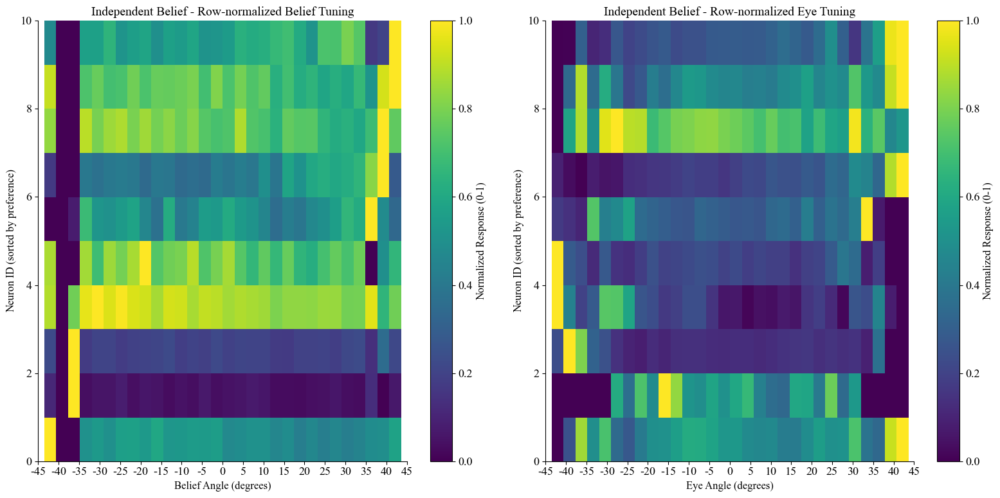


Independent Belief Example Neurons Statistics:
  Neuron 48:
    Independent belief coef: 16.787
    Independent eye coef: 1.714
    Total belief coef: 27.924
    Total eye coef: 9.944

  Neuron 36:
    Independent belief coef: -15.628
    Independent eye coef: -1.673
    Total belief coef: -26.126
    Total eye coef: -9.374

  Neuron 77:
    Independent belief coef: -15.570
    Independent eye coef: 2.699
    Total belief coef: -18.731
    Total eye coef: -2.822

  Neuron 70:
    Independent belief coef: -9.828
    Independent eye coef: 1.265
    Total belief coef: -12.555
    Total eye coef: -2.436

  Neuron 51:
    Independent belief coef: -9.655
    Independent eye coef: 2.569
    Total belief coef: -10.118
    Total eye coef: -0.413


Independent Eye: Selected 10 neurons
  Neuron indices: [ 1 63 43 25 75  3 24 35 30 22]...


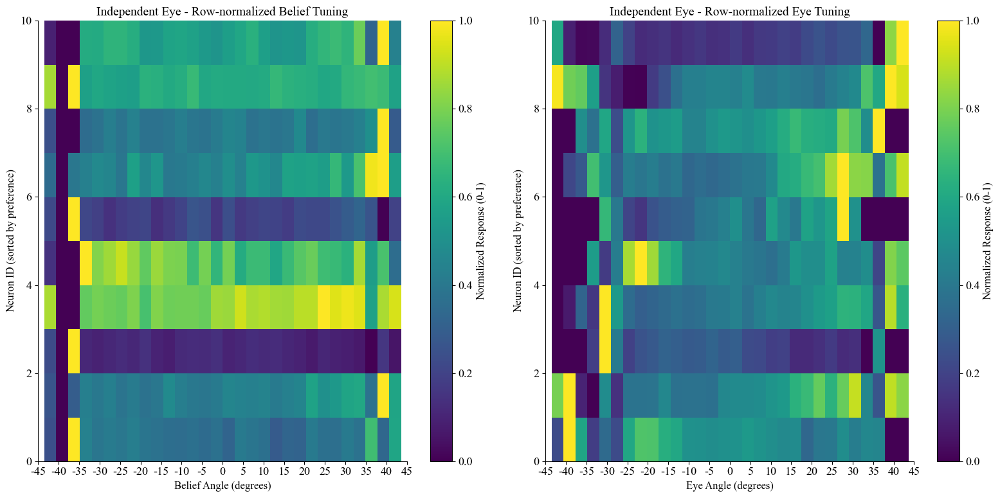


Independent Eye Example Neurons Statistics:
  Neuron 1:
    Independent belief coef: 2.566
    Independent eye coef: -12.963
    Total belief coef: -17.795
    Total eye coef: -18.174

  Neuron 63:
    Independent belief coef: -3.164
    Independent eye coef: 10.370
    Total belief coef: 12.614
    Total eye coef: 14.088

  Neuron 43:
    Independent belief coef: 2.527
    Independent eye coef: 9.064
    Total belief coef: 18.927
    Total eye coef: 14.643

  Neuron 25:
    Independent belief coef: 1.140
    Independent eye coef: -8.177
    Total belief coef: -11.969
    Total eye coef: -11.705

  Neuron 75:
    Independent belief coef: 2.528
    Independent eye coef: -6.647
    Total belief coef: -7.339
    Total eye coef: -8.810

No neurons found for Both Independent

All Neurons: Selected 80 neurons
  Neuron indices: [0 1 2 3 4 5 6 7 8 9]...


KeyboardInterrupt: 

In [103]:
def analyze_and_visualize_neuron_encoding(timedf, n_bins=30, n_examples=10):
    """
    Perform full encoding analysis and create heatmaps for example neurons from each category.
    Normalizes each row (neuron) separately in the heatmaps.
    Consistent sorting across both plots in each figure.
    Includes an additional plot for all neurons.
    
    Parameters:
    -----------
    timedf : pandas DataFrame
        DataFrame with neural, belief, eye, and uncertainty data
    n_bins : int
        Number of bins for degree ranges
    n_examples : int
        Number of neurons to show per category
    """
    import matplotlib.pyplot as plt
    import numpy as np
    import pandas as pd
    from sklearn.linear_model import LinearRegression
    
    print("\n--- Full Neural Encoding Analysis with Heatmaps ---")
    
    # Extract data
    neural_data = np.vstack(timedf['PPC'].to_numpy())
    belief_data = timedf['belief'].to_numpy()
    eye_data = timedf['eye'].to_numpy()
    
    print(f"Neural data shape: {neural_data.shape}")
    print(f"Belief data shape: {belief_data.shape}")
    print(f"Eye data shape: {eye_data.shape}")
    
    # Ensure eye_data is 2D for sklearn
    if len(eye_data.shape) == 1:
        eye_data_2d = eye_data.reshape(-1, 1)
    else:
        eye_data_2d = eye_data
    
    # Get number of neurons
    n_neurons = neural_data.shape[1]
    print(f"Analyzing {n_neurons} neurons")
    
    # Step 1: Calculate coefficients for each neuron
    
    # Calculate total belief coefficients
    model_total_belief = LinearRegression().fit(neural_data, belief_data)
    total_belief_coefs = model_total_belief.coef_
    
    # Calculate total eye coefficients
    model_total_eye = LinearRegression().fit(neural_data, eye_data_2d)
    total_eye_coefs = model_total_eye.coef_[0]  # Flatten
    
    # Calculate independent belief coefficients
    model_eye = LinearRegression().fit(eye_data_2d, neural_data)
    neural_residuals_after_eye = neural_data - model_eye.predict(eye_data_2d)
    
    model_indep_belief = LinearRegression().fit(neural_residuals_after_eye, belief_data)
    indep_belief_coefs = model_indep_belief.coef_
    
    # Calculate independent eye coefficients
    model_belief = LinearRegression().fit(belief_data.reshape(-1, 1), neural_data)
    neural_residuals_after_belief = neural_data - model_belief.predict(belief_data.reshape(-1, 1))
    
    model_indep_eye = LinearRegression().fit(neural_residuals_after_belief, eye_data_2d)
    indep_eye_coefs = model_indep_eye.coef_[0]  # Flatten
    
    # Step 2: Create neuron DataFrame for categorization
    neuron_df = pd.DataFrame({
        'neuron_idx': np.arange(n_neurons),
        'total_belief_coef': total_belief_coefs,
        'total_eye_coef': total_eye_coefs,
        'indep_belief_coef': indep_belief_coefs,
        'indep_eye_coef': indep_eye_coefs,
        'total_belief_abs': np.abs(total_belief_coefs),
        'total_eye_abs': np.abs(total_eye_coefs),
        'indep_belief_abs': np.abs(indep_belief_coefs),
        'indep_eye_abs': np.abs(indep_eye_coefs)
    })
    
    # Step 3: Define thresholds and categorize neurons
    threshold_pct = 75  # Use top 25% as threshold
    threshold_indep_belief = np.percentile(neuron_df['indep_belief_abs'], threshold_pct)
    threshold_indep_eye = np.percentile(neuron_df['indep_eye_abs'], threshold_pct)
    
    # Create categorizations
    neuron_df['indep_category'] = 'Not significant'
    
    # Independent belief dominant
    indep_belief_dominant_mask = (neuron_df['indep_belief_abs'] >= threshold_indep_belief) & \
                                 (neuron_df['indep_eye_abs'] < threshold_indep_eye)
    neuron_df.loc[indep_belief_dominant_mask, 'indep_category'] = 'Indep. belief dominant'
    
    # Independent eye dominant
    indep_eye_dominant_mask = (neuron_df['indep_belief_abs'] < threshold_indep_belief) & \
                               (neuron_df['indep_eye_abs'] >= threshold_indep_eye)
    neuron_df.loc[indep_eye_dominant_mask, 'indep_category'] = 'Indep. eye dominant'
    
    # Both independent
    indep_both_mask = (neuron_df['indep_belief_abs'] >= threshold_indep_belief) & \
                       (neuron_df['indep_eye_abs'] >= threshold_indep_eye)
    neuron_df.loc[indep_both_mask, 'indep_category'] = 'Both indep. significant'
    
    # Print summary
    print("\nNeuron categorization summary:")
    for category, count in neuron_df['indep_category'].value_counts().items():
        print(f"  {category}: {count} neurons ({count/n_neurons*100:.1f}%)")
    
    # Step 4: Convert to degrees (if not already)
    # Assuming data might be in radians if max value is small
    if np.max(np.abs(belief_data)) < 10:  # Likely in radians
        belief_degrees = np.degrees(belief_data)
    else:
        belief_degrees = belief_data
        
    if np.max(np.abs(eye_data)) < 10:  # Likely in radians
        eye_degrees = np.degrees(eye_data)
    else:
        eye_degrees = eye_data
    
    # Create degree bins
    degree_edges = np.linspace(-45, 45, n_bins + 1)
    bin_centers = (degree_edges[:-1] + degree_edges[1:]) / 2
    
    def calculate_tuning_curves(neuron_indices):
        """Helper function to calculate tuning curves for a set of neurons"""
        belief_tuning = np.zeros((len(neuron_indices), n_bins))
        eye_tuning = np.zeros((len(neuron_indices), n_bins))
        
        for i, neuron_idx in enumerate(neuron_indices):
            neuron_responses = neural_data[:, neuron_idx]
            
            # Bin neural responses by belief angle
            belief_binned = np.digitize(belief_degrees, degree_edges) - 1
            belief_binned = np.clip(belief_binned, 0, n_bins - 1)
            
            for j in range(n_bins):
                mask = belief_binned == j
                if np.sum(mask) > 0:
                    belief_tuning[i, j] = np.mean(neuron_responses[mask])
            
            # Bin neural responses by eye angle
            eye_binned = np.digitize(eye_degrees, degree_edges) - 1
            eye_binned = np.clip(eye_binned, 0, n_bins - 1)
            
            for j in range(n_bins):
                mask = eye_binned == j
                if np.sum(mask) > 0:
                    eye_tuning[i, j] = np.mean(neuron_responses[mask])
        
        return belief_tuning, eye_tuning
    
    def normalize_by_row(tuning_matrix):
        """Helper function to normalize each row independently"""
        normalized = np.zeros_like(tuning_matrix)
        
        for i in range(tuning_matrix.shape[0]):
            row = tuning_matrix[i, :]
            if not np.all(np.isclose(row, 0)):  # Avoid division by zero
                normalized[i, :] = (row - row.min()) / (row.max() - row.min())
        
        return normalized
    
    # Step 5: Find example neurons for each category and create plots
    
    # Define categories with their plotting specifications
    categories = {
        'Independent Belief': {
            'label': 'Indep. belief dominant',
            'sort_by': 'belief',  # Sort by belief preference for both plots
            'filename': 'independent_belief_tuning_heatmap.png'
        },
        'Independent Eye': {
            'label': 'Indep. eye dominant',
            'sort_by': 'eye',  # Sort by eye preference for both plots
            'filename': 'independent_eye_tuning_heatmap.png'
        },
        'Both Independent': {
            'label': 'tune to both, sort by both',
            'sort_by': 'both',  # Keep same sorting for both plots
            'filename': 'bothsortbyboth.png'
        },
        'Both Independent': {
            'label': 'tune to both, sort by belief',
            'sort_by': 'belief',  # Keep same sorting for both plots
            'filename': 'bothsortbybelief.png'
        },
        'Both Independent': {
            'label': 'tune to both, sort by eye',
            'sort_by': 'eye',  # Keep same sorting for both plots
            'filename': 'bothsortbyeye.png'
        },

        'All Neurons': {
            'label': 'all, sort by belief',  # Special case
            'sort_by': 'belief',  # Sort by belief preference
            'filename': 'all_neurons_tuning_heatmap_sortbelief.png'
        },
        'All Neurons': {
            'label': 'all, sort by eye',  # Special case
            'sort_by': 'eye',  # Sort by belief preference
            'filename': 'all_neurons_tuning_heatmap_sorteye.png'
        }
    }
    
    for cat_name, cat_info in categories.items():
        # Get neurons from this category
        if cat_name == 'All Neurons':
            # Get all neurons
            category_neurons = neuron_df
            n_to_take = n_neurons
        else:
            category_neurons = neuron_df[neuron_df['indep_category'] == cat_info['label']]
            # Sort by the relevant coefficient (absolute value)
            if 'Belief' in cat_name:
                sorted_neurons = category_neurons.sort_values('indep_belief_abs', ascending=False)
            elif 'Eye' in cat_name:
                sorted_neurons = category_neurons.sort_values('indep_eye_abs', ascending=False)
            else:  # Both
                # Sort by sum of both coefficients
                category_neurons['sum_coef'] = category_neurons['indep_belief_abs'] + category_neurons['indep_eye_abs']
                sorted_neurons = category_neurons.sort_values('sum_coef', ascending=False)
            
            # Take top examples
            n_to_take = min(n_examples, len(sorted_neurons))
        
        if n_to_take == 0:
            print(f"No neurons found for {cat_name}")
            continue
        
        if cat_name == 'All Neurons':
            neuron_indices = np.arange(n_neurons)
        else:
            neuron_indices = sorted_neurons.iloc[:n_to_take]['neuron_idx'].values
        
        print(f"\n{cat_name}: Selected {n_to_take} neurons")
        print(f"  Neuron indices: {neuron_indices[:10]}...")  # Show first 10 only
        
        # Calculate tuning curves
        belief_tuning, eye_tuning = calculate_tuning_curves(neuron_indices)
        
        # Normalize each row independently
        belief_tuning_normalized = normalize_by_row(belief_tuning)
        eye_tuning_normalized = normalize_by_row(eye_tuning)
        
        # Determine sorting order based on category specification
        if cat_info['sort_by'] == 'belief':
            sort_order = np.argsort(np.argmax(belief_tuning_normalized, axis=1))
        elif cat_info['sort_by'] == 'eye':
            sort_order = np.argsort(np.argmax(eye_tuning_normalized, axis=1))
        else:  # 'both' - keep the original order for "Both Independent" category
            # For Both Independent, sort by belief preference
            sort_order = np.argsort(np.argmax(belief_tuning_normalized, axis=1))
        
        # Create figure with two subplots (belief and eye)
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))
        
        # Plot belief tuning heatmap (row-normalized)
        im1 = ax1.imshow(belief_tuning_normalized[sort_order, :], 
                        aspect='auto', 
                        origin='lower',
                        cmap='viridis',
                        extent=[bin_centers[0], bin_centers[-1], 0, len(neuron_indices)],
                        vmin=0, vmax=1)  # Fixed scale for normalized data
        
        # Set x-ticks to show degree values
        ax1.set_xticks(np.arange(-45, 46, 5))
        ax1.set_xlabel('Belief Angle (degrees)', fontsize=12)
        ax1.set_ylabel('Neuron ID (sorted by preference)', fontsize=12)
        ax1.set_title(f'{cat_name} - Row-normalized Belief Tuning', fontsize=14)
        
        # Add colorbar
        cbar1 = plt.colorbar(im1, ax=ax1)
        cbar1.set_label('Normalized Response (0-1)', fontsize=12)
        
        # Plot eye tuning heatmap (row-normalized) with the SAME sorting order
        im2 = ax2.imshow(eye_tuning_normalized[sort_order, :], 
                        aspect='auto', 
                        origin='lower',
                        cmap='viridis',
                        extent=[bin_centers[0], bin_centers[-1], 0, len(neuron_indices)],
                        vmin=0, vmax=1)  # Fixed scale for normalized data
        
        # Set x-ticks to show degree values
        ax2.set_xticks(np.arange(-45, 46, 5))
        ax2.set_xlabel('Eye Angle (degrees)', fontsize=12)
        ax2.set_ylabel('Neuron ID (sorted by preference)', fontsize=12)
        ax2.set_title(f'{cat_name} - Row-normalized Eye Tuning', fontsize=14)
        
        # Add colorbar
        cbar2 = plt.colorbar(im2, ax=ax2)
        cbar2.set_label('Normalized Response (0-1)', fontsize=12)
        
        plt.tight_layout()
        plt.savefig(cat_info['filename'], dpi=300, bbox_inches='tight')
        plt.show()
        
        # Print some statistics about the example neurons
        if cat_name != 'All Neurons':  # Don't print stats for all neurons
            print(f"\n{cat_name} Example Neurons Statistics:")
            for i, idx in enumerate(neuron_indices[:5]):  # Show first 5 only
                neuron_info = neuron_df[neuron_df['neuron_idx'] == idx].iloc[0]
                print(f"  Neuron {idx}:")
                print(f"    Independent belief coef: {neuron_info['indep_belief_coef']:.3f}")
                print(f"    Independent eye coef: {neuron_info['indep_eye_coef']:.3f}")
                print(f"    Total belief coef: {neuron_info['total_belief_coef']:.3f}")
                print(f"    Total eye coef: {neuron_info['total_eye_coef']:.3f}")
                print()
    
    return neuron_df

# Run the complete analysis
neuron_df = analyze_and_visualize_neuron_encoding(timedf)


--- Multi-Session Neural Encoding Analysis ---
Found 26 unique sessions

--- Processing Session 1/26 (ID: 209) ---
Session data: 411813 timepoints, 55 neurons

Session 209 neuron categorization summary:
  Not significant: 33 neurons (60.0%)
  Indep. belief dominant: 8 neurons (14.5%)
  Indep. eye dominant: 8 neurons (14.5%)
  Both indep. significant: 6 neurons (10.9%)

--- Processing Session 2/26 (ID: 221) ---
Session data: 422050 timepoints, 70 neurons

Session 221 neuron categorization summary:
  Not significant: 41 neurons (58.6%)
  Indep. belief dominant: 11 neurons (15.7%)
  Indep. eye dominant: 11 neurons (15.7%)
  Both indep. significant: 7 neurons (10.0%)

--- Processing Session 3/26 (ID: 220) ---
Session data: 396483 timepoints, 73 neurons

Session 220 neuron categorization summary:
  Not significant: 42 neurons (57.5%)
  Indep. belief dominant: 12 neurons (16.4%)
  Indep. eye dominant: 12 neurons (16.4%)
  Both indep. significant: 7 neurons (9.6%)

--- Processing Session 4/2

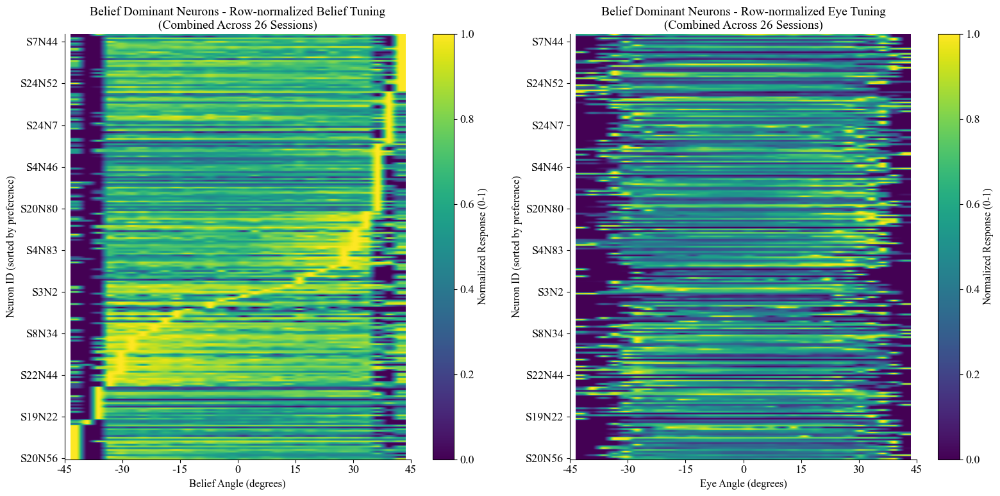

Created combined heatmap for Belief Dominant Neurons with 245 neurons


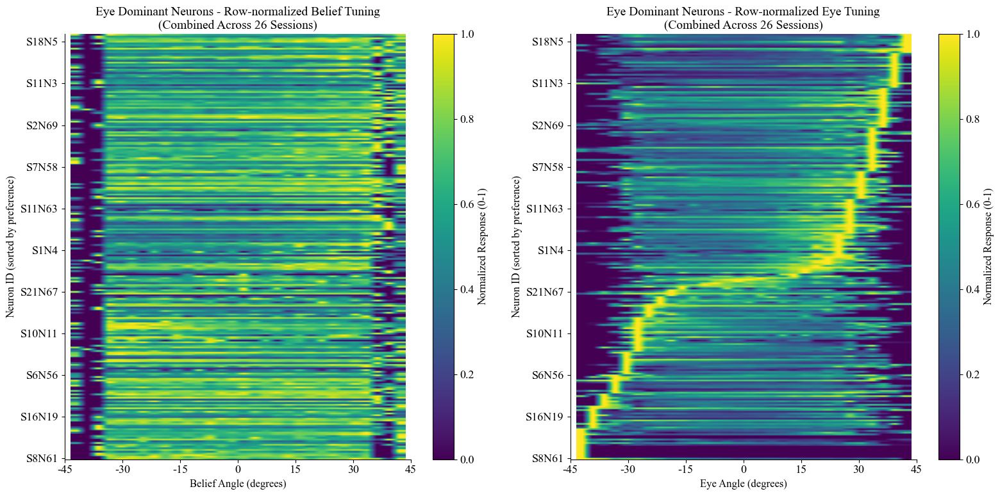

Created combined heatmap for Eye Dominant Neurons with 245 neurons


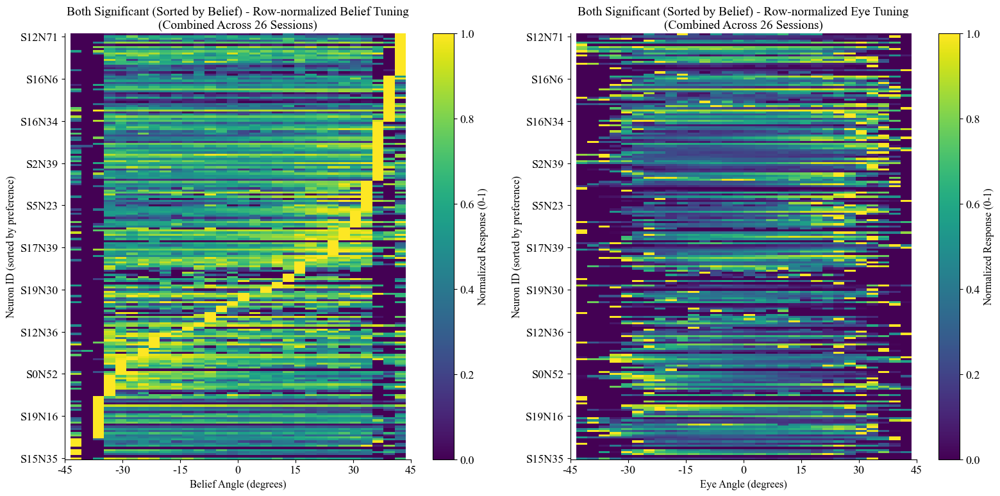

Created combined heatmap for Both Significant (Sorted by Belief) with 202 neurons


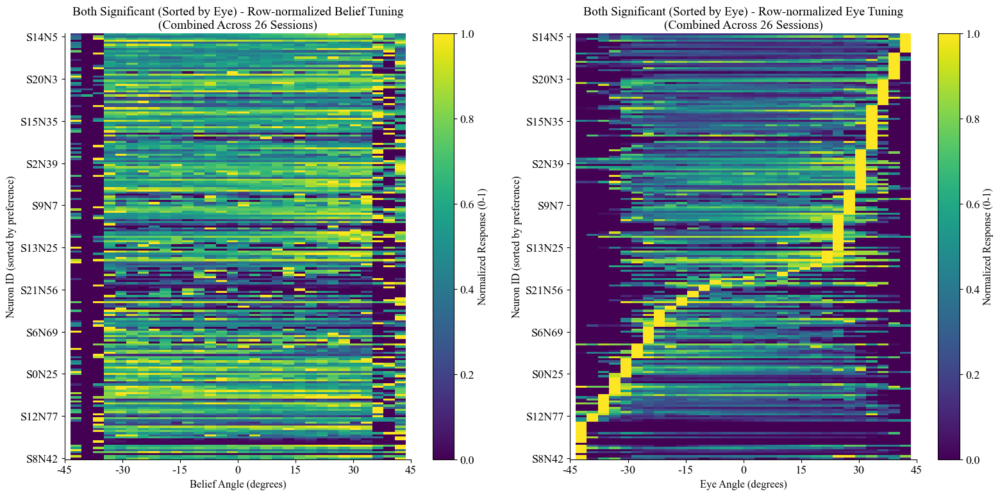

Created combined heatmap for Both Significant (Sorted by Eye) with 202 neurons

--- Full Neural Encoding Analysis with Heatmaps ---
Neural data shape: (411813, 55)
Belief data shape: (411813,)
Eye data shape: (411813,)
Analyzing 55 neurons

Neuron categorization summary:
  Not significant: 33 neurons (60.0%)
  Indep. belief dominant: 8 neurons (14.5%)
  Indep. eye dominant: 8 neurons (14.5%)
  Both indep. significant: 6 neurons (10.9%)

Independent Belief: Selected 8 neurons
  Neuron indices: [ 2 10  1 29 12 40 21 15]...


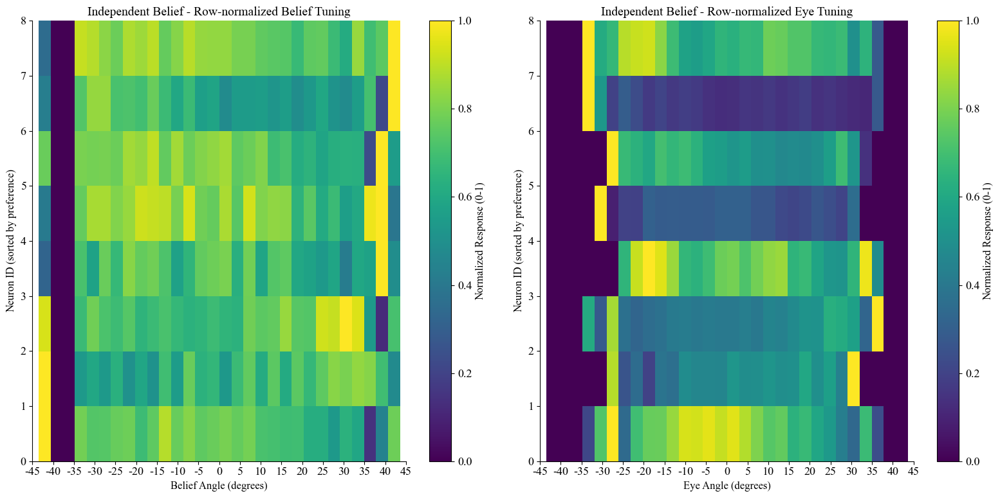


Independent Belief Example Neurons Statistics:
  Neuron 2:
    Independent belief coef: -16.599
    Independent eye coef: 1.705
    Total belief coef: -23.318
    Total eye coef: -4.727

  Neuron 10:
    Independent belief coef: -15.748
    Independent eye coef: 4.135
    Total belief coef: -16.236
    Total eye coef: -0.343

  Neuron 1:
    Independent belief coef: -14.280
    Independent eye coef: 1.108
    Total belief coef: -20.898
    Total eye coef: -4.656

  Neuron 29:
    Independent belief coef: 10.580
    Independent eye coef: 1.380
    Total belief coef: 20.629
    Total eye coef: 7.070

  Neuron 12:
    Independent belief coef: -9.495
    Independent eye coef: 1.266
    Total belief coef: -12.657
    Total eye coef: -2.225


Independent Eye: Selected 8 neurons
  Neuron indices: [24 22 48 27 23 47 42 37]...


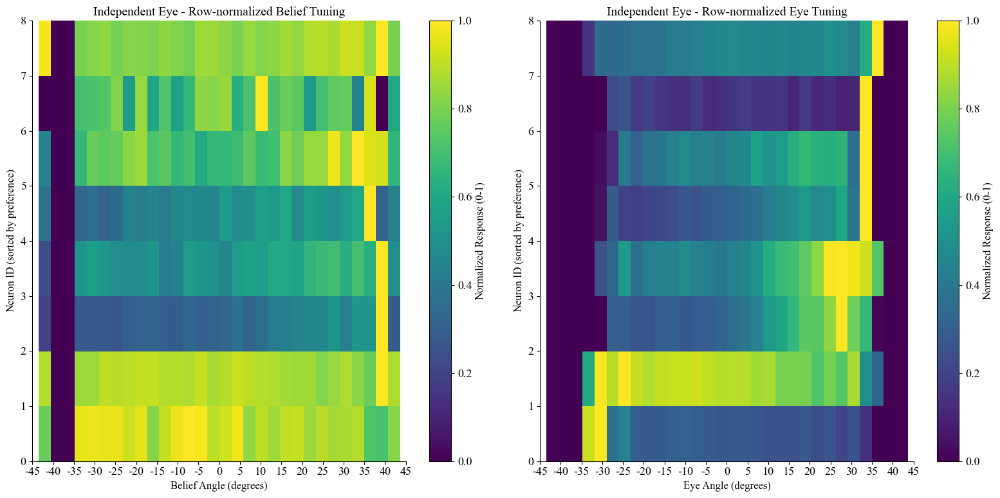


Independent Eye Example Neurons Statistics:
  Neuron 24:
    Independent belief coef: -0.603
    Independent eye coef: 11.918
    Total belief coef: 26.874
    Total eye coef: 19.331

  Neuron 22:
    Independent belief coef: 3.269
    Independent eye coef: 9.560
    Total belief coef: 27.730
    Total eye coef: 17.209

  Neuron 48:
    Independent belief coef: 0.623
    Independent eye coef: 6.470
    Total belief coef: 16.152
    Total eye coef: 10.925

  Neuron 27:
    Independent belief coef: -3.574
    Independent eye coef: 5.614
    Total belief coef: 7.249
    Total eye coef: 7.614

  Neuron 23:
    Independent belief coef: 5.457
    Independent eye coef: -5.196
    Total belief coef: -3.172
    Total eye coef: -6.071

No neurons found for Both Independent

All Neurons: Selected 55 neurons
  Neuron indices: [0 1 2 3 4 5 6 7 8 9]...


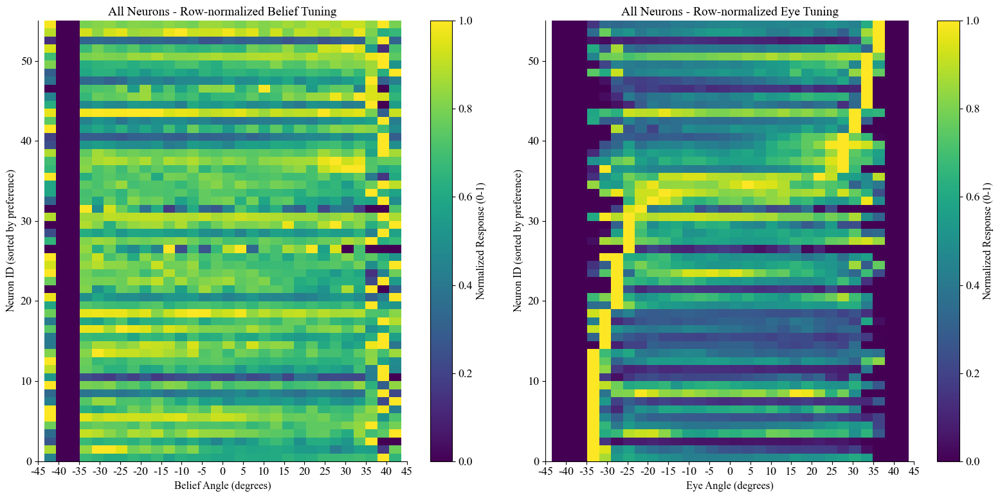

Created individual plots for Session 209

--- Full Neural Encoding Analysis with Heatmaps ---
Neural data shape: (422050, 70)
Belief data shape: (422050,)
Eye data shape: (422050,)
Analyzing 70 neurons

Neuron categorization summary:
  Not significant: 41 neurons (58.6%)
  Indep. belief dominant: 11 neurons (15.7%)
  Indep. eye dominant: 11 neurons (15.7%)
  Both indep. significant: 7 neurons (10.0%)

Independent Belief: Selected 10 neurons
  Neuron indices: [62  0 51 59 47 12 56  7 57 27]...


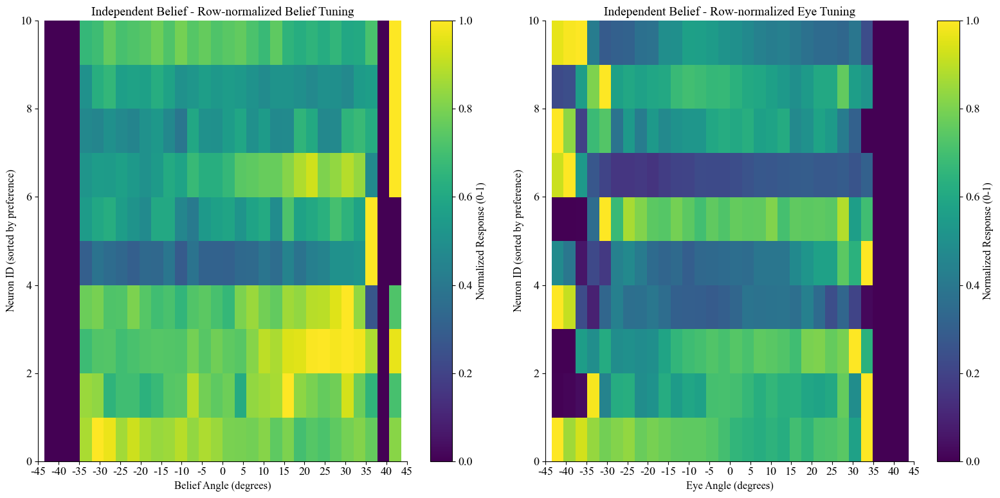


Independent Belief Example Neurons Statistics:
  Neuron 62:
    Independent belief coef: 22.960
    Independent eye coef: 3.944
    Total belief coef: 38.385
    Total eye coef: 14.191

  Neuron 0:
    Independent belief coef: 19.551
    Independent eye coef: -2.056
    Total belief coef: 24.389
    Total eye coef: 4.456

  Neuron 51:
    Independent belief coef: 17.949
    Independent eye coef: 2.904
    Total belief coef: 29.734
    Total eye coef: 10.842

  Neuron 59:
    Independent belief coef: 14.307
    Independent eye coef: -2.382
    Total belief coef: 16.509
    Total eye coef: 2.025

  Neuron 47:
    Independent belief coef: 12.537
    Independent eye coef: -3.458
    Total belief coef: 12.366
    Total eye coef: -0.157


Independent Eye: Selected 10 neurons
  Neuron indices: [20  4 21 35 43  2 63  6  1 49]...


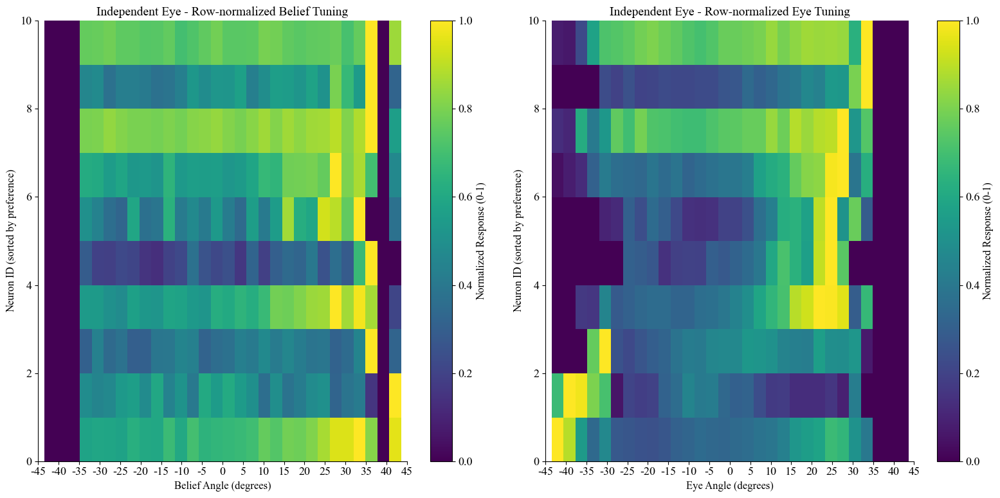


Independent Eye Example Neurons Statistics:
  Neuron 20:
    Independent belief coef: 4.048
    Independent eye coef: 13.271
    Total belief coef: 26.038
    Total eye coef: 20.228

  Neuron 4:
    Independent belief coef: 2.866
    Independent eye coef: 10.605
    Total belief coef: 20.284
    Total eye coef: 16.024

  Neuron 21:
    Independent belief coef: 3.162
    Independent eye coef: 8.860
    Total belief coef: 18.023
    Total eye coef: 13.671

  Neuron 35:
    Independent belief coef: 5.394
    Independent eye coef: 8.664
    Total belief coef: 20.868
    Total eye coef: 14.235

  Neuron 43:
    Independent belief coef: 7.985
    Independent eye coef: 8.661
    Total belief coef: 24.513
    Total eye coef: 15.206

No neurons found for Both Independent

All Neurons: Selected 70 neurons
  Neuron indices: [0 1 2 3 4 5 6 7 8 9]...


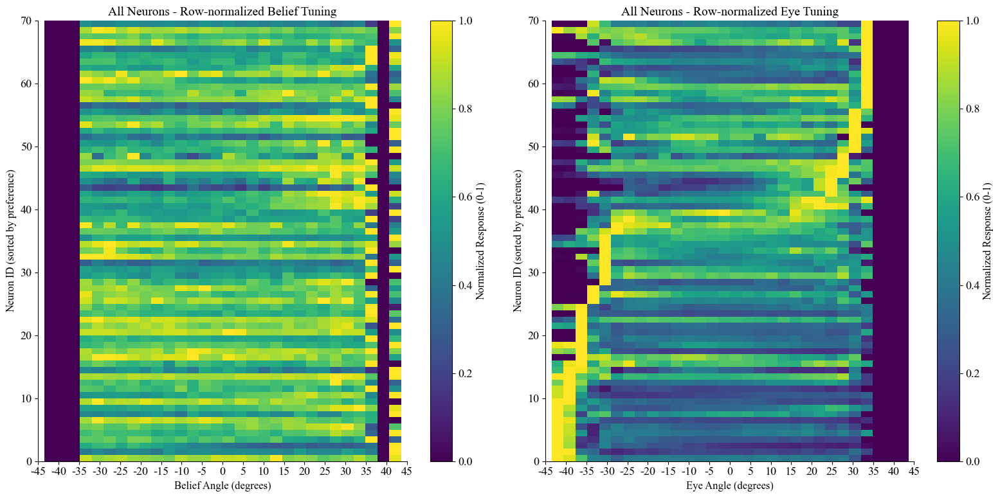

Created individual plots for Session 221

--- Full Neural Encoding Analysis with Heatmaps ---
Neural data shape: (396483, 73)
Belief data shape: (396483,)
Eye data shape: (396483,)
Analyzing 73 neurons

Neuron categorization summary:
  Not significant: 42 neurons (57.5%)
  Indep. belief dominant: 12 neurons (16.4%)
  Indep. eye dominant: 12 neurons (16.4%)
  Both indep. significant: 7 neurons (9.6%)

Independent Belief: Selected 10 neurons
  Neuron indices: [45  2 42  9 40  8 30 65 35 53]...


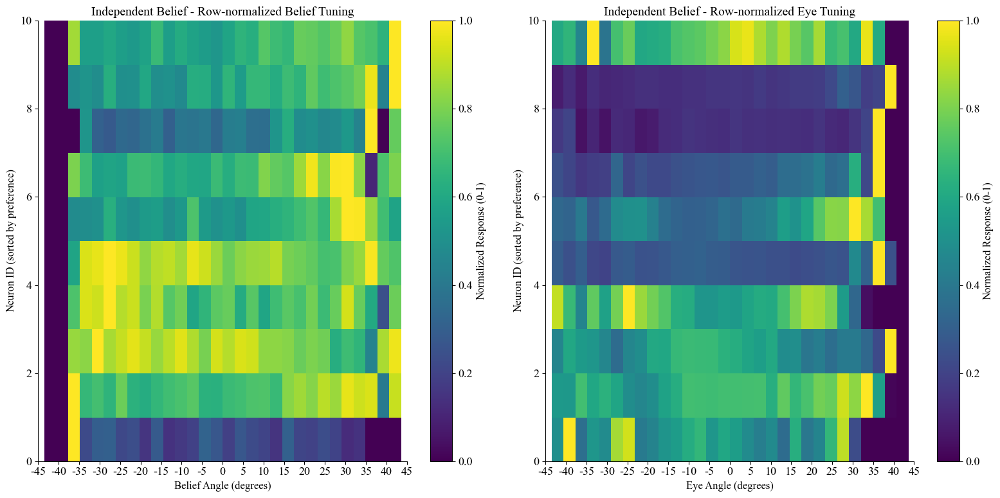


Independent Belief Example Neurons Statistics:
  Neuron 45:
    Independent belief coef: 17.920
    Independent eye coef: 0.181
    Total belief coef: 27.556
    Total eye coef: 8.521

  Neuron 2:
    Independent belief coef: 17.380
    Independent eye coef: 4.051
    Total belief coef: 33.389
    Total eye coef: 14.157

  Neuron 42:
    Independent belief coef: -17.005
    Independent eye coef: 0.991
    Total belief coef: -24.150
    Total eye coef: -6.319

  Neuron 9:
    Independent belief coef: -16.526
    Independent eye coef: 1.386
    Total belief coef: -22.742
    Total eye coef: -5.497

  Neuron 40:
    Independent belief coef: 16.299
    Independent eye coef: -1.270
    Total belief coef: 22.597
    Total eye coef: 5.570


Independent Eye: Selected 10 neurons
  Neuron indices: [21 12 72 62 69 63 49 24 71 22]...


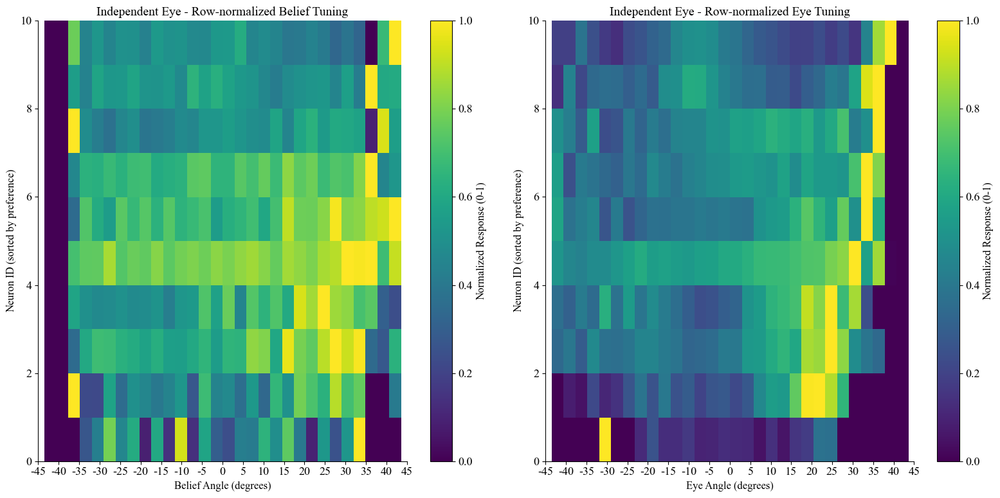


Independent Eye Example Neurons Statistics:
  Neuron 21:
    Independent belief coef: 2.190
    Independent eye coef: 20.363
    Total belief coef: 38.344
    Total eye coef: 31.973

  Neuron 12:
    Independent belief coef: -2.617
    Independent eye coef: 10.169
    Total belief coef: 13.502
    Total eye coef: 14.255

  Neuron 72:
    Independent belief coef: 1.791
    Independent eye coef: 9.886
    Total belief coef: 19.717
    Total eye coef: 15.853

  Neuron 62:
    Independent belief coef: 0.943
    Independent eye coef: 9.292
    Total belief coef: 17.408
    Total eye coef: 14.561

  Neuron 69:
    Independent belief coef: 7.141
    Independent eye coef: 7.107
    Total belief coef: 23.075
    Total eye coef: 14.091

No neurons found for Both Independent

All Neurons: Selected 73 neurons
  Neuron indices: [0 1 2 3 4 5 6 7 8 9]...


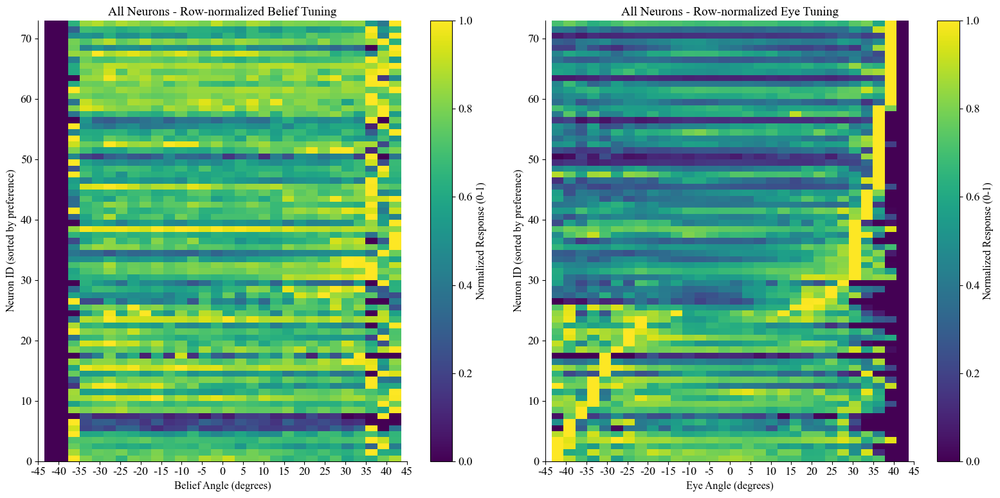

Created individual plots for Session 220

--- Full Neural Encoding Analysis with Heatmaps ---
Neural data shape: (420226, 76)
Belief data shape: (420226,)
Eye data shape: (420226,)
Analyzing 76 neurons

Neuron categorization summary:
  Not significant: 46 neurons (60.5%)
  Indep. belief dominant: 11 neurons (14.5%)
  Indep. eye dominant: 11 neurons (14.5%)
  Both indep. significant: 8 neurons (10.5%)

Independent Belief: Selected 10 neurons
  Neuron indices: [66 67 69 45 49  2 51 41  0 46]...


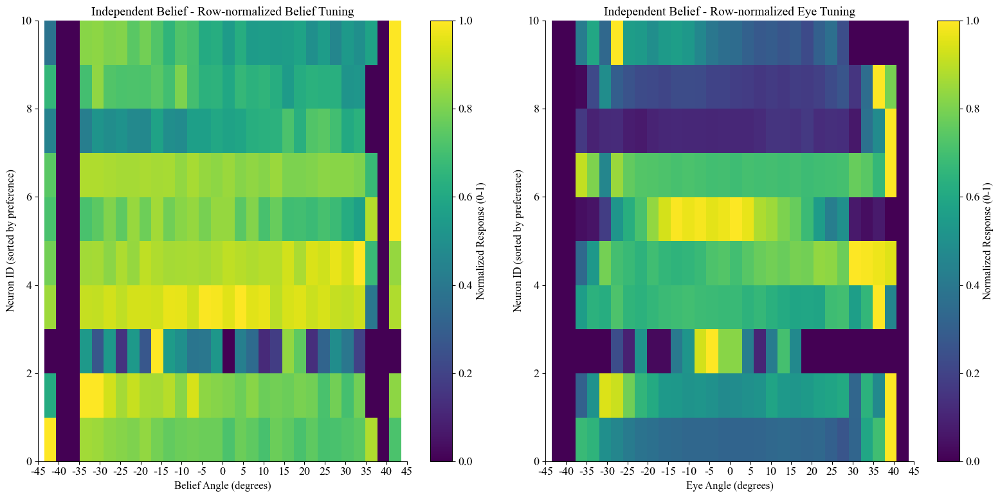


Independent Belief Example Neurons Statistics:
  Neuron 66:
    Independent belief coef: -32.257
    Independent eye coef: 2.590
    Total belief coef: -42.721
    Total eye coef: -8.675

  Neuron 67:
    Independent belief coef: -15.939
    Independent eye coef: 1.348
    Total belief coef: -20.989
    Total eye coef: -4.187

  Neuron 69:
    Independent belief coef: -13.625
    Independent eye coef: 0.262
    Total belief coef: -19.517
    Total eye coef: -4.885

  Neuron 45:
    Independent belief coef: 11.971
    Independent eye coef: 1.217
    Total belief coef: 19.706
    Total eye coef: 6.414

  Neuron 49:
    Independent belief coef: -10.940
    Independent eye coef: 1.940
    Total belief coef: -12.610
    Total eye coef: -1.385


Independent Eye: Selected 10 neurons
  Neuron indices: [17 19 43 72  5  7 40 18 33 37]...


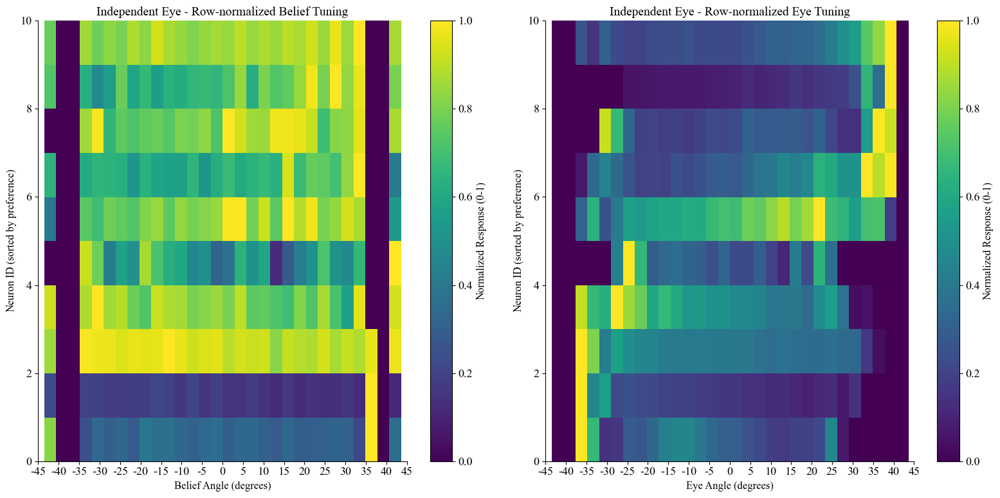


Independent Eye Example Neurons Statistics:
  Neuron 17:
    Independent belief coef: 3.487
    Independent eye coef: 12.274
    Total belief coef: 26.819
    Total eye coef: 19.345

  Neuron 19:
    Independent belief coef: -1.389
    Independent eye coef: 10.309
    Total belief coef: 16.197
    Total eye coef: 14.581

  Neuron 43:
    Independent belief coef: -4.931
    Independent eye coef: 9.472
    Total belief coef: 9.522
    Total eye coef: 11.984

  Neuron 72:
    Independent belief coef: 3.280
    Independent eye coef: -7.928
    Total belief coef: -9.211
    Total eye coef: -10.357

  Neuron 5:
    Independent belief coef: 4.383
    Independent eye coef: -7.825
    Total belief coef: -7.411
    Total eye coef: -9.779

No neurons found for Both Independent

All Neurons: Selected 76 neurons
  Neuron indices: [0 1 2 3 4 5 6 7 8 9]...


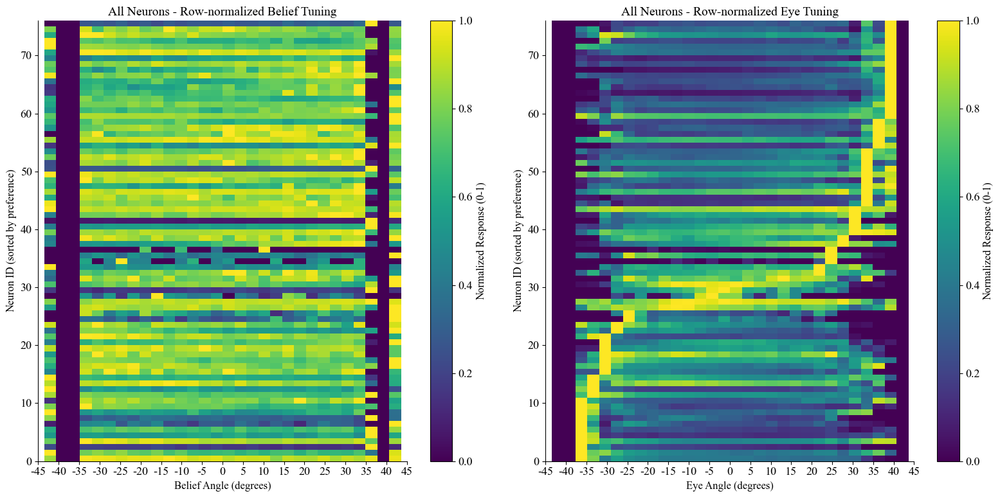

Created individual plots for Session 208

--- Full Neural Encoding Analysis with Heatmaps ---
Neural data shape: (343240, 87)
Belief data shape: (343240,)
Eye data shape: (343240,)
Analyzing 87 neurons

Neuron categorization summary:
  Not significant: 53 neurons (60.9%)
  Indep. belief dominant: 12 neurons (13.8%)
  Indep. eye dominant: 12 neurons (13.8%)
  Both indep. significant: 10 neurons (11.5%)

Independent Belief: Selected 10 neurons
  Neuron indices: [ 7 79 48 22 84 83 17 46 71 49]...


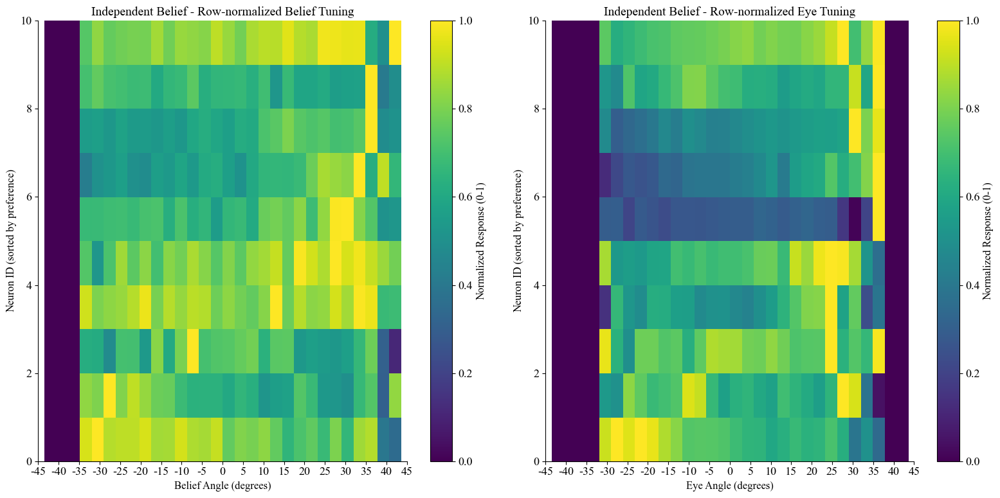


Independent Belief Example Neurons Statistics:
  Neuron 7:
    Independent belief coef: 19.312
    Independent eye coef: -0.951
    Total belief coef: 27.762
    Total eye coef: 6.724

  Neuron 79:
    Independent belief coef: -17.766
    Independent eye coef: 0.920
    Total belief coef: -25.426
    Total eye coef: -6.103

  Neuron 48:
    Independent belief coef: 14.174
    Independent eye coef: -2.975
    Total belief coef: 15.966
    Total eye coef: 1.430

  Neuron 22:
    Independent belief coef: 13.742
    Independent eye coef: 3.839
    Total belief coef: 28.458
    Total eye coef: 11.703

  Neuron 84:
    Independent belief coef: -8.324
    Independent eye coef: -3.405
    Total belief coef: -19.342
    Total eye coef: -8.748


Independent Eye: Selected 10 neurons
  Neuron indices: [10  8 74 11 81 68 31  9 76 53]...


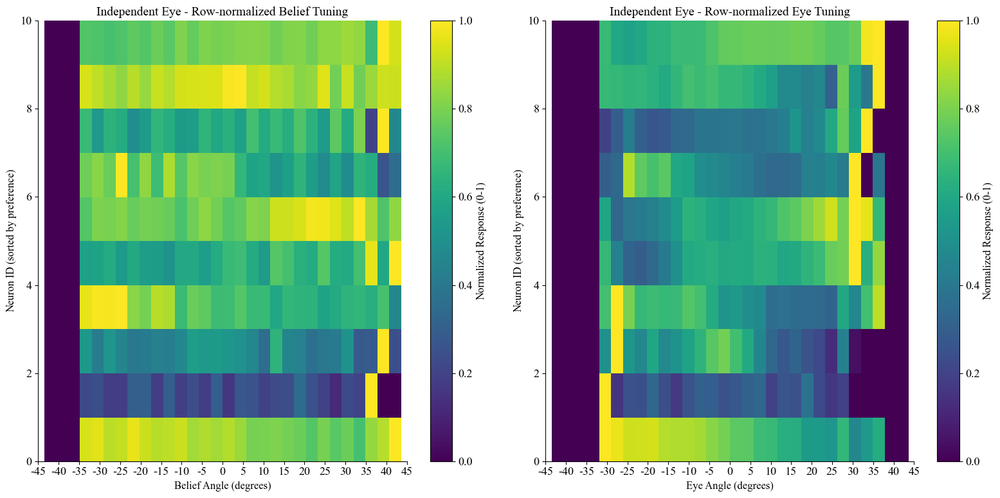


Independent Eye Example Neurons Statistics:
  Neuron 10:
    Independent belief coef: -0.066
    Independent eye coef: -16.668
    Total belief coef: -32.249
    Total eye coef: -25.586

  Neuron 8:
    Independent belief coef: 1.418
    Independent eye coef: -11.548
    Total belief coef: -20.070
    Total eye coef: -17.102

  Neuron 74:
    Independent belief coef: 6.451
    Independent eye coef: -9.038
    Total belief coef: -7.511
    Total eye coef: -11.108

  Neuron 11:
    Independent belief coef: -2.896
    Independent eye coef: -8.466
    Total belief coef: -20.786
    Total eye coef: -14.224

  Neuron 81:
    Independent belief coef: 2.440
    Independent eye coef: 7.969
    Total belief coef: 19.100
    Total eye coef: 13.247

No neurons found for Both Independent

All Neurons: Selected 87 neurons
  Neuron indices: [0 1 2 3 4 5 6 7 8 9]...


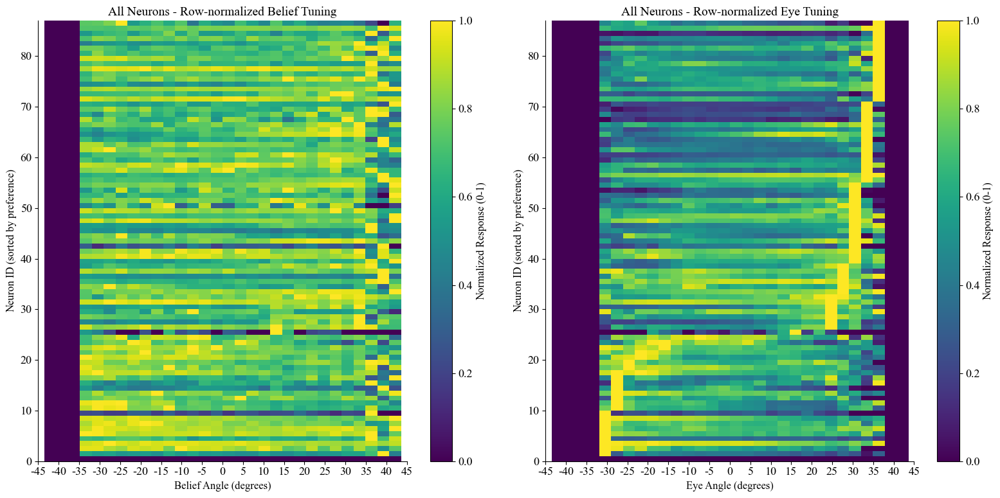

Created individual plots for Session 183

--- Full Neural Encoding Analysis with Heatmaps ---
Neural data shape: (96616, 87)
Belief data shape: (96616,)
Eye data shape: (96616,)
Analyzing 87 neurons

Neuron categorization summary:
  Not significant: 53 neurons (60.9%)
  Indep. eye dominant: 12 neurons (13.8%)
  Indep. belief dominant: 12 neurons (13.8%)
  Both indep. significant: 10 neurons (11.5%)

Independent Belief: Selected 10 neurons
  Neuron indices: [68 78 71  3 51  2 50  8 75 29]...


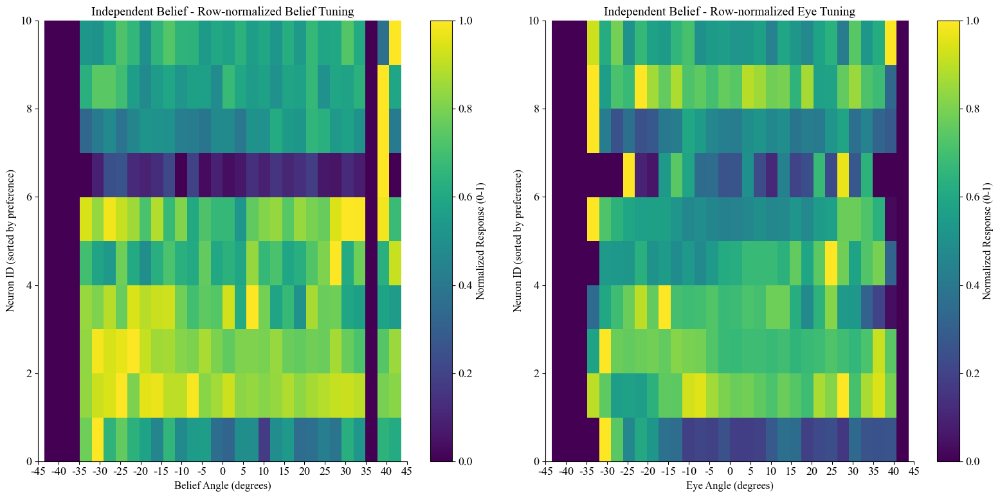


Independent Belief Example Neurons Statistics:
  Neuron 68:
    Independent belief coef: -16.498
    Independent eye coef: 3.907
    Total belief coef: -19.011
    Total eye coef: -2.587

  Neuron 78:
    Independent belief coef: -16.253
    Independent eye coef: -0.984
    Total belief coef: -25.752
    Total eye coef: -9.781

  Neuron 71:
    Independent belief coef: 15.608
    Independent eye coef: -5.174
    Total belief coef: 15.838
    Total eye coef: 0.237

  Neuron 3:
    Independent belief coef: -14.729
    Independent eye coef: 5.707
    Total belief coef: -13.748
    Total eye coef: 1.010

  Neuron 51:
    Independent belief coef: -13.298
    Independent eye coef: -2.212
    Total belief coef: -23.114
    Total eye coef: -10.108


Independent Eye: Selected 10 neurons
  Neuron indices: [74 82 43 12 84 24  0 72 61 40]...


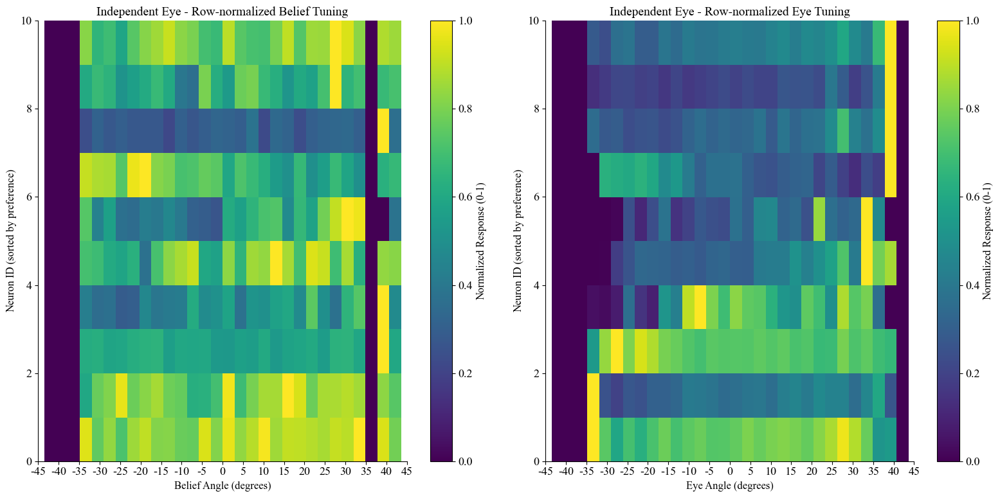


Independent Eye Example Neurons Statistics:
  Neuron 74:
    Independent belief coef: -0.401
    Independent eye coef: 22.448
    Total belief coef: 32.021
    Total eye coef: 33.386

  Neuron 82:
    Independent belief coef: 7.714
    Independent eye coef: 14.225
    Total belief coef: 32.215
    Total eye coef: 25.229

  Neuron 43:
    Independent belief coef: -1.717
    Independent eye coef: -13.671
    Total belief coef: -22.436
    Total eye coef: -21.335

  Neuron 12:
    Independent belief coef: -1.698
    Independent eye coef: 11.901
    Total belief coef: 14.754
    Total eye coef: 16.941

  Neuron 84:
    Independent belief coef: 7.891
    Independent eye coef: -10.507
    Total belief coef: -3.460
    Total eye coef: -11.688

No neurons found for Both Independent

All Neurons: Selected 87 neurons
  Neuron indices: [0 1 2 3 4 5 6 7 8 9]...


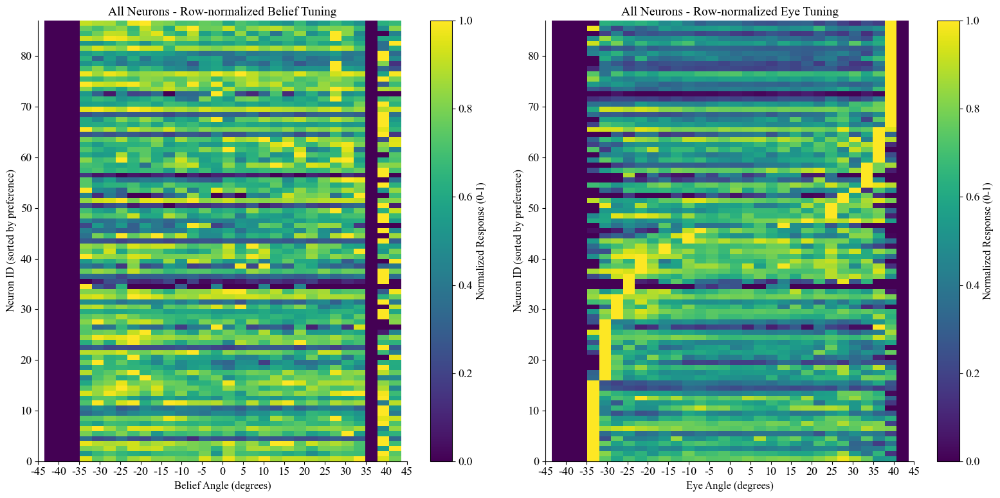

Created individual plots for Session 187

--- Full Neural Encoding Analysis with Heatmaps ---
Neural data shape: (282087, 81)
Belief data shape: (282087,)
Eye data shape: (282087,)
Analyzing 81 neurons

Neuron categorization summary:
  Not significant: 50 neurons (61.7%)
  Both indep. significant: 11 neurons (13.6%)
  Indep. eye dominant: 10 neurons (12.3%)
  Indep. belief dominant: 10 neurons (12.3%)

Independent Belief: Selected 10 neurons
  Neuron indices: [65 37 79 26 19 62 15 74 71 51]...


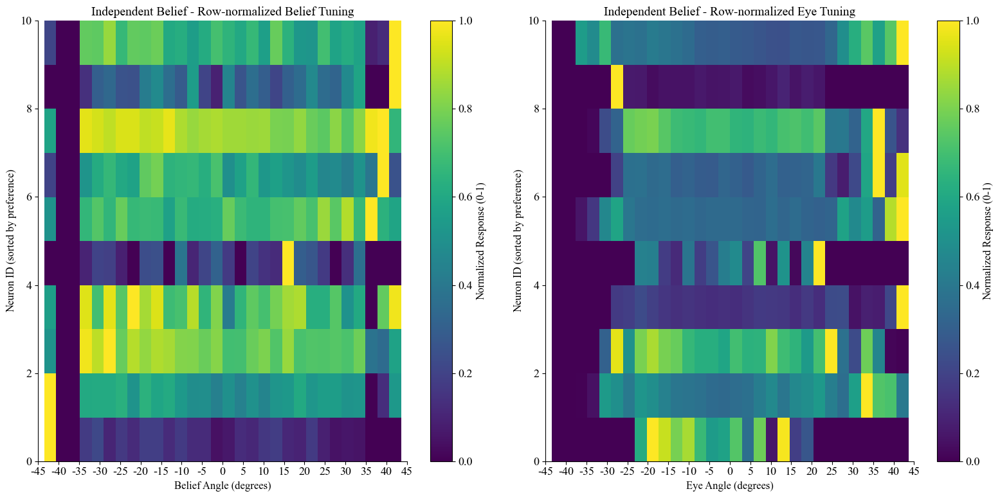


Independent Belief Example Neurons Statistics:
  Neuron 65:
    Independent belief coef: 52.956
    Independent eye coef: -0.223
    Total belief coef: 72.713
    Total eye coef: 15.151

  Neuron 37:
    Independent belief coef: -29.670
    Independent eye coef: -4.221
    Total belief coef: -48.564
    Total eye coef: -14.490

  Neuron 79:
    Independent belief coef: 28.213
    Independent eye coef: -3.949
    Total belief coef: 31.842
    Total eye coef: 2.784

  Neuron 26:
    Independent belief coef: -12.878
    Independent eye coef: 2.056
    Total belief coef: -14.078
    Total eye coef: -0.920

  Neuron 19:
    Independent belief coef: -12.473
    Independent eye coef: 2.024
    Total belief coef: -13.578
    Total eye coef: -0.847


Independent Eye: Selected 10 neurons
  Neuron indices: [20 34  6  2  9 75 56  5 42 58]...


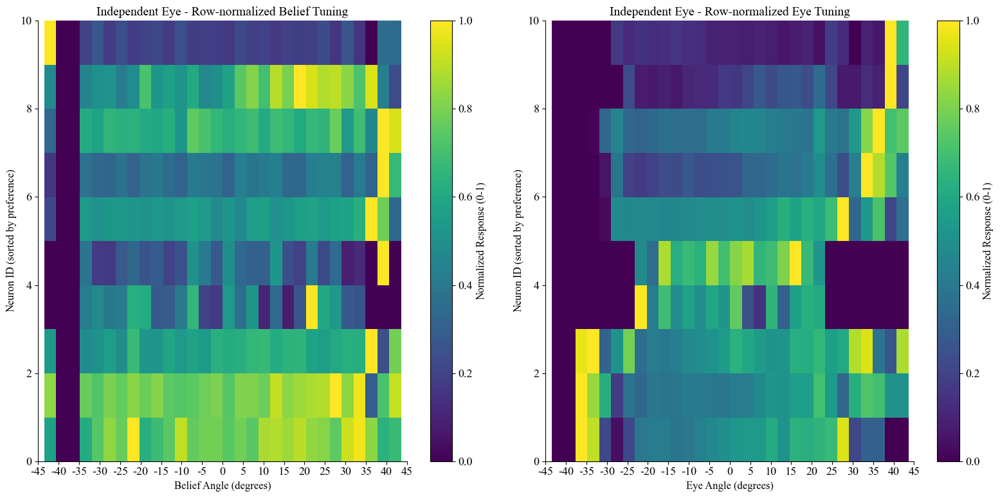


Independent Eye Example Neurons Statistics:
  Neuron 20:
    Independent belief coef: 7.935
    Independent eye coef: 13.360
    Total belief coef: 35.005
    Total eye coef: 20.760

  Neuron 34:
    Independent belief coef: -6.726
    Independent eye coef: 9.595
    Total belief coef: 7.987
    Total eye coef: 11.284

  Neuron 6:
    Independent belief coef: -6.326
    Independent eye coef: 9.252
    Total belief coef: 7.922
    Total eye coef: 10.927

  Neuron 2:
    Independent belief coef: -6.487
    Independent eye coef: 7.556
    Total belief coef: 4.646
    Total eye coef: 8.538

  Neuron 9:
    Independent belief coef: 4.406
    Independent eye coef: -6.647
    Total belief coef: -5.884
    Total eye coef: -7.892

No neurons found for Both Independent

All Neurons: Selected 81 neurons
  Neuron indices: [0 1 2 3 4 5 6 7 8 9]...


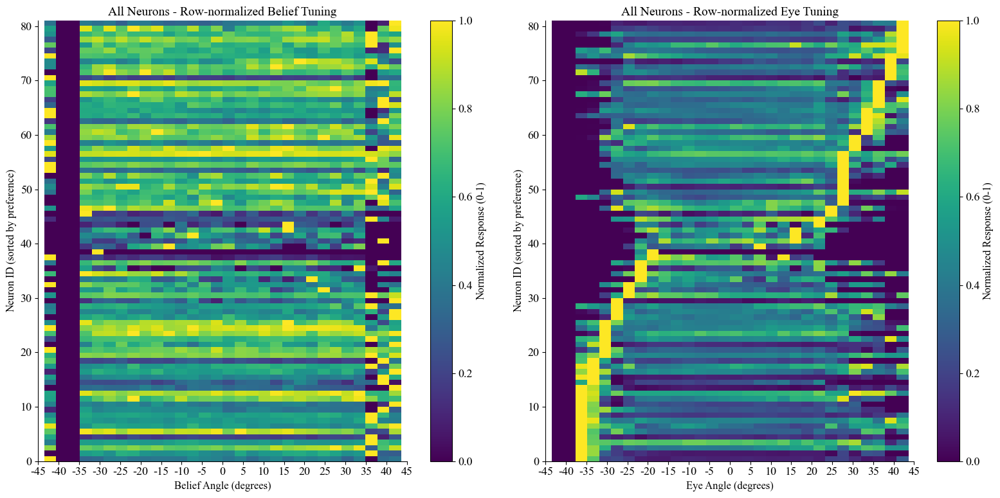

Created individual plots for Session 218

--- Full Neural Encoding Analysis with Heatmaps ---
Neural data shape: (294034, 79)
Belief data shape: (294034,)
Eye data shape: (294034,)
Analyzing 79 neurons

Neuron categorization summary:
  Not significant: 51 neurons (64.6%)
  Both indep. significant: 12 neurons (15.2%)
  Indep. eye dominant: 8 neurons (10.1%)
  Indep. belief dominant: 8 neurons (10.1%)

Independent Belief: Selected 8 neurons
  Neuron indices: [21 51 73  6 32 17 69 44]...


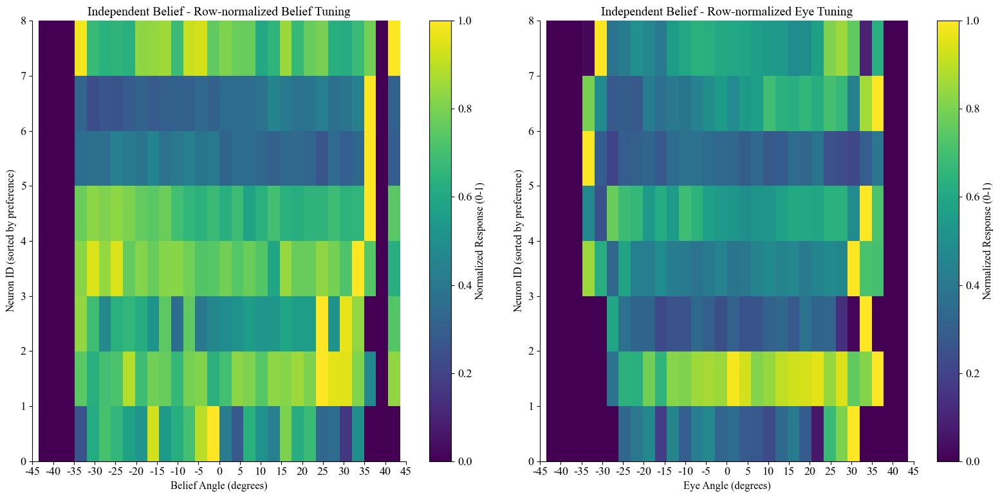


Independent Belief Example Neurons Statistics:
  Neuron 21:
    Independent belief coef: -22.851
    Independent eye coef: 0.593
    Total belief coef: -36.340
    Total eye coef: -10.220

  Neuron 51:
    Independent belief coef: -11.670
    Independent eye coef: 3.132
    Total belief coef: -12.409
    Total eye coef: -0.560

  Neuron 73:
    Independent belief coef: 10.224
    Independent eye coef: -0.417
    Total belief coef: 15.931
    Total eye coef: 4.323

  Neuron 6:
    Independent belief coef: -9.987
    Independent eye coef: 0.953
    Total belief coef: -14.373
    Total eye coef: -3.323

  Neuron 32:
    Independent belief coef: 9.965
    Independent eye coef: 4.465
    Total belief coef: 26.115
    Total eye coef: 12.235


Independent Eye: Selected 8 neurons
  Neuron indices: [65 39  8  1 77 34 25 58]...


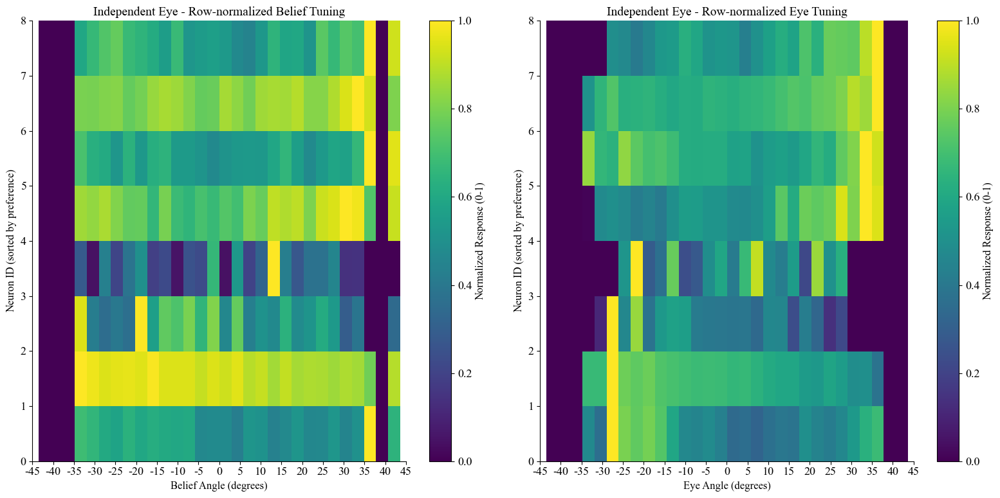


Independent Eye Example Neurons Statistics:
  Neuron 65:
    Independent belief coef: 4.496
    Independent eye coef: -9.048
    Total belief coef: -12.263
    Total eye coef: -12.697

  Neuron 39:
    Independent belief coef: 3.276
    Independent eye coef: -8.633
    Total belief coef: -13.370
    Total eye coef: -12.611

  Neuron 8:
    Independent belief coef: 4.152
    Independent eye coef: -8.612
    Total belief coef: -11.881
    Total eye coef: -12.146

  Neuron 1:
    Independent belief coef: 3.819
    Independent eye coef: 7.926
    Total belief coef: 23.518
    Total eye coef: 14.924

  Neuron 77:
    Independent belief coef: 3.766
    Independent eye coef: 6.464
    Total belief coef: 20.252
    Total eye coef: 12.490

No neurons found for Both Independent

All Neurons: Selected 79 neurons
  Neuron indices: [0 1 2 3 4 5 6 7 8 9]...


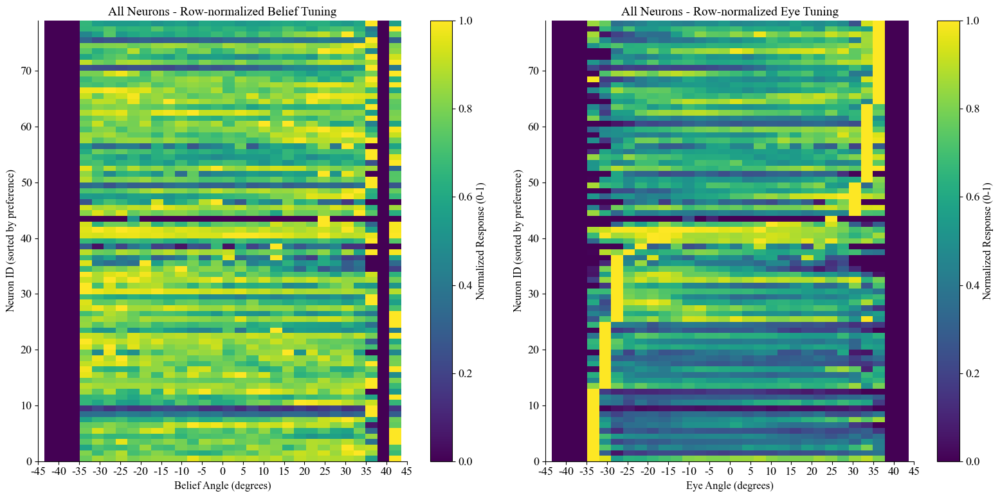

Created individual plots for Session 185

--- Full Neural Encoding Analysis with Heatmaps ---
Neural data shape: (364850, 73)
Belief data shape: (364850,)
Eye data shape: (364850,)
Analyzing 73 neurons

Neuron categorization summary:
  Not significant: 44 neurons (60.3%)
  Indep. eye dominant: 10 neurons (13.7%)
  Indep. belief dominant: 10 neurons (13.7%)
  Both indep. significant: 9 neurons (12.3%)

Independent Belief: Selected 10 neurons
  Neuron indices: [54 44 37 34 68 41 57 33 67 35]...


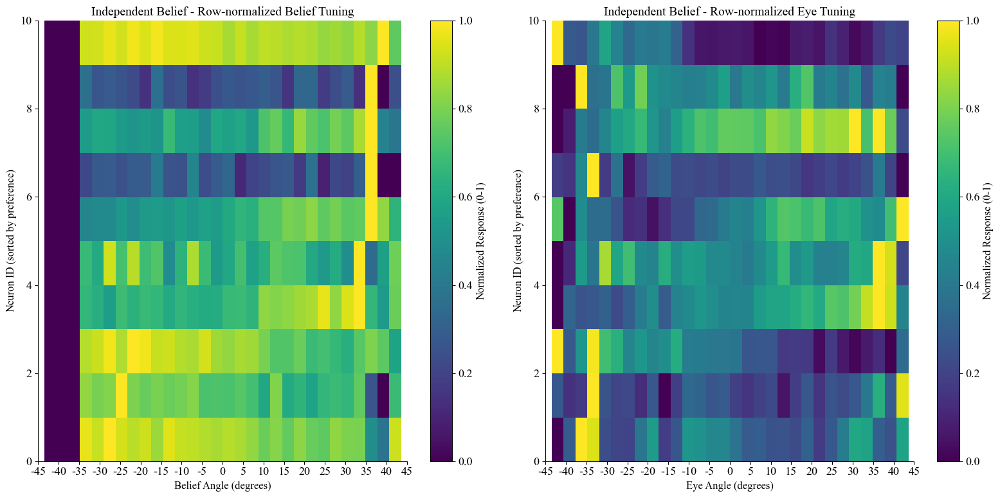


Independent Belief Example Neurons Statistics:
  Neuron 54:
    Independent belief coef: 27.230
    Independent eye coef: 1.857
    Total belief coef: 42.776
    Total eye coef: 17.083

  Neuron 44:
    Independent belief coef: -16.853
    Independent eye coef: 6.229
    Total belief coef: -16.543
    Total eye coef: 0.340

  Neuron 37:
    Independent belief coef: 15.917
    Independent eye coef: 1.515
    Total belief coef: 25.583
    Total eye coef: 10.621

  Neuron 34:
    Independent belief coef: -15.074
    Independent eye coef: 0.949
    Total belief coef: -21.018
    Total eye coef: -6.533

  Neuron 68:
    Independent belief coef: 11.919
    Independent eye coef: 4.938
    Total belief coef: 24.277
    Total eye coef: 13.579


Independent Eye: Selected 10 neurons
  Neuron indices: [28 61 32 25 56 22 30 60 19  4]...


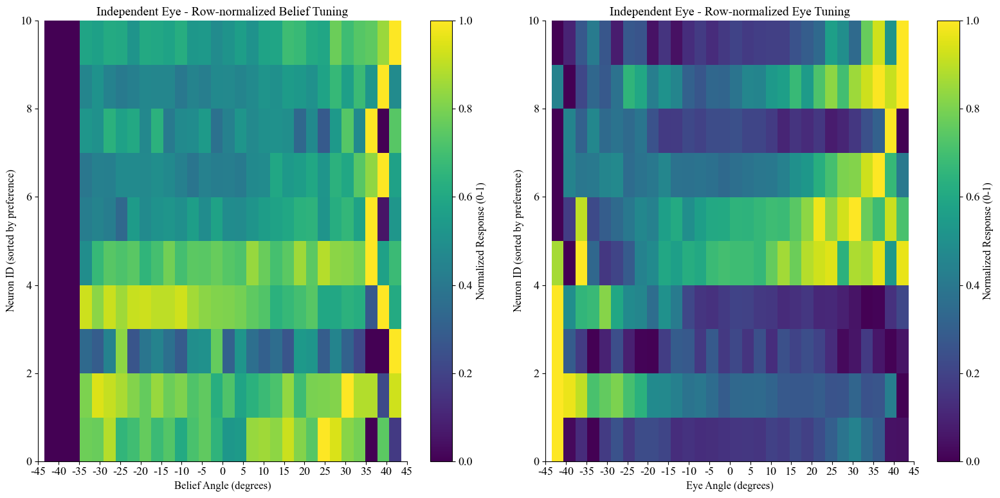


Independent Eye Example Neurons Statistics:
  Neuron 28:
    Independent belief coef: -2.957
    Independent eye coef: 12.582
    Total belief coef: 12.562
    Total eye coef: 17.054

  Neuron 61:
    Independent belief coef: 4.554
    Independent eye coef: -12.496
    Total belief coef: -10.084
    Total eye coef: -16.086

  Neuron 32:
    Independent belief coef: 5.495
    Independent eye coef: 11.738
    Total belief coef: 23.926
    Total eye coef: 20.254

  Neuron 25:
    Independent belief coef: -0.347
    Independent eye coef: -11.098
    Total belief coef: -15.451
    Total eye coef: -16.597

  Neuron 56:
    Independent belief coef: 2.569
    Independent eye coef: -9.753
    Total belief coef: -9.328
    Total eye coef: -13.073

No neurons found for Both Independent

All Neurons: Selected 73 neurons
  Neuron indices: [0 1 2 3 4 5 6 7 8 9]...


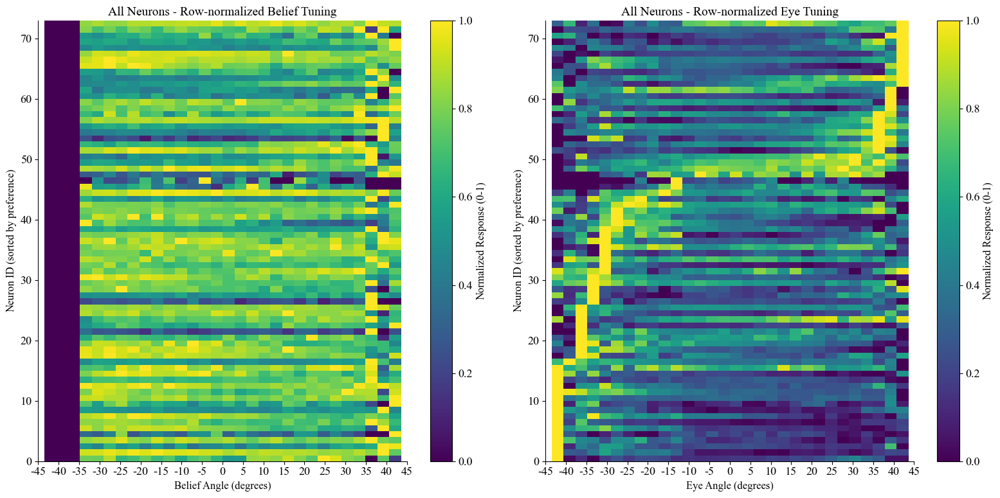

Created individual plots for Session 190

--- Full Neural Encoding Analysis with Heatmaps ---
Neural data shape: (383380, 72)
Belief data shape: (383380,)
Eye data shape: (383380,)
Analyzing 72 neurons

Neuron categorization summary:
  Not significant: 44 neurons (61.1%)
  Indep. eye dominant: 10 neurons (13.9%)
  Indep. belief dominant: 10 neurons (13.9%)
  Both indep. significant: 8 neurons (11.1%)

Independent Belief: Selected 10 neurons
  Neuron indices: [57 70 16 69  5 19 18 39 63 54]...


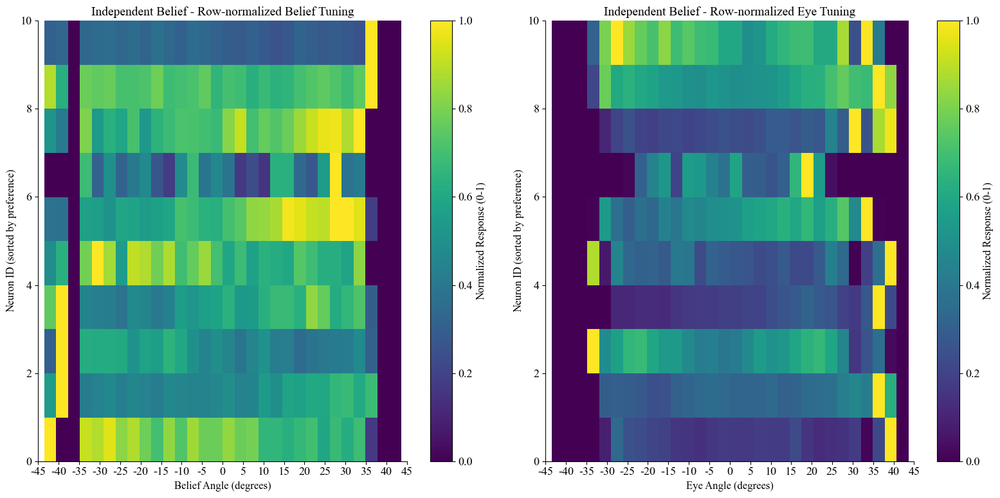


Independent Belief Example Neurons Statistics:
  Neuron 57:
    Independent belief coef: 27.545
    Independent eye coef: 1.560
    Total belief coef: 41.527
    Total eye coef: 11.737

  Neuron 70:
    Independent belief coef: 25.968
    Independent eye coef: -0.815
    Total belief coef: 35.305
    Total eye coef: 7.837

  Neuron 16:
    Independent belief coef: -16.490
    Independent eye coef: 0.841
    Total belief coef: -21.876
    Total eye coef: -4.521

  Neuron 69:
    Independent belief coef: 16.298
    Independent eye coef: -0.574
    Total belief coef: 22.054
    Total eye coef: 4.831

  Neuron 5:
    Independent belief coef: -15.509
    Independent eye coef: 4.319
    Total belief coef: -14.637
    Total eye coef: 0.731


Independent Eye: Selected 10 neurons
  Neuron indices: [45 59 49  4 14 40 22 43 62  6]...


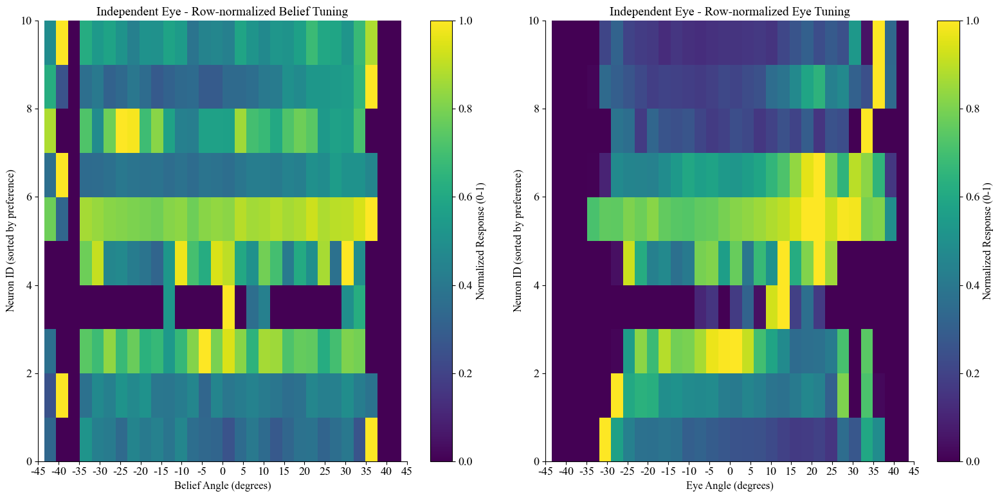


Independent Eye Example Neurons Statistics:
  Neuron 45:
    Independent belief coef: 6.896
    Independent eye coef: 58.994
    Total belief coef: 109.001
    Total eye coef: 85.707

  Neuron 59:
    Independent belief coef: -0.450
    Independent eye coef: 8.412
    Total belief coef: 13.517
    Total eye coef: 11.724

  Neuron 49:
    Independent belief coef: -5.059
    Independent eye coef: -7.547
    Total belief coef: -19.842
    Total eye coef: -12.410

  Neuron 4:
    Independent belief coef: 3.332
    Independent eye coef: -7.328
    Total belief coef: -7.624
    Total eye coef: -9.197

  Neuron 14:
    Independent belief coef: 5.553
    Independent eye coef: -7.139
    Total belief coef: -4.169
    Total eye coef: -8.161

No neurons found for Both Independent

All Neurons: Selected 72 neurons
  Neuron indices: [0 1 2 3 4 5 6 7 8 9]...


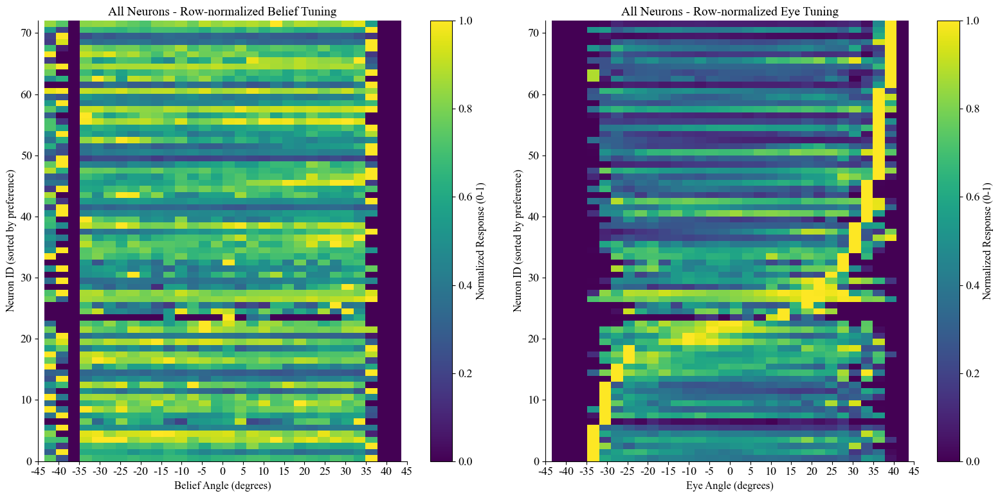

Created individual plots for Session 219

--- Full Neural Encoding Analysis with Heatmaps ---
Neural data shape: (419255, 64)
Belief data shape: (419255,)
Eye data shape: (419255,)
Analyzing 64 neurons

Neuron categorization summary:
  Not significant: 38 neurons (59.4%)
  Indep. belief dominant: 10 neurons (15.6%)
  Indep. eye dominant: 10 neurons (15.6%)
  Both indep. significant: 6 neurons (9.4%)

Independent Belief: Selected 10 neurons
  Neuron indices: [53 38 28  1 59 58 52 36 55 27]...


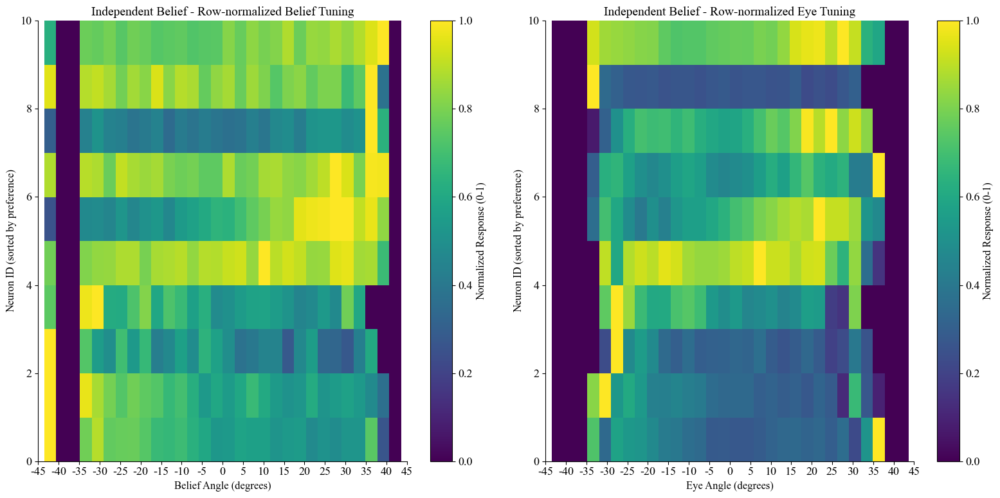


Independent Belief Example Neurons Statistics:
  Neuron 53:
    Independent belief coef: 41.651
    Independent eye coef: 2.220
    Total belief coef: 70.138
    Total eye coef: 22.116

  Neuron 38:
    Independent belief coef: -16.740
    Independent eye coef: -0.371
    Total belief coef: -27.131
    Total eye coef: -8.068

  Neuron 28:
    Independent belief coef: -12.580
    Independent eye coef: -0.798
    Total belief coef: -21.442
    Total eye coef: -6.880

  Neuron 1:
    Independent belief coef: 12.359
    Independent eye coef: 3.219
    Total belief coef: 26.005
    Total eye coef: 10.595

  Neuron 59:
    Independent belief coef: -10.541
    Independent eye coef: -1.997
    Total belief coef: -20.663
    Total eye coef: -7.858


Independent Eye: Selected 10 neurons
  Neuron indices: [18 50 32 11 33 17 15 37 21 20]...


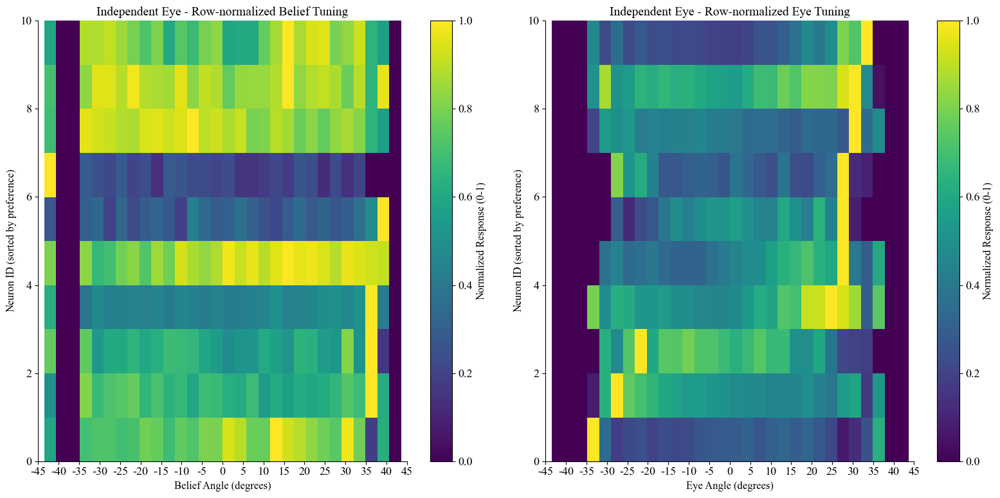


Independent Eye Example Neurons Statistics:
  Neuron 18:
    Independent belief coef: -1.848
    Independent eye coef: 9.880
    Total belief coef: 17.142
    Total eye coef: 14.743

  Neuron 50:
    Independent belief coef: -5.349
    Independent eye coef: 7.110
    Total belief coef: 6.003
    Total eye coef: 8.813

  Neuron 32:
    Independent belief coef: 1.579
    Independent eye coef: 6.020
    Total belief coef: 14.707
    Total eye coef: 10.192

  Neuron 11:
    Independent belief coef: 1.710
    Independent eye coef: -5.675
    Total belief coef: -8.824
    Total eye coef: -8.178

  Neuron 33:
    Independent belief coef: 4.307
    Independent eye coef: -4.862
    Total belief coef: -3.082
    Total eye coef: -5.737

No neurons found for Both Independent

All Neurons: Selected 64 neurons
  Neuron indices: [0 1 2 3 4 5 6 7 8 9]...


KeyboardInterrupt: 

In [107]:
def analyze_and_visualize_across_sessions(df, n_bins=30, n_examples=10):
    """
    Perform neural encoding analysis across multiple sessions and create combined heatmaps.
    Handles sessions with different numbers of neurons.
    
    Parameters:
    -----------
    df : pandas DataFrame
        DataFrame containing all sessions with neural, belief, eye data and a 'session' column
    n_bins : int
        Number of bins for degree ranges
    n_examples : int
        Number of neurons to show per category
    
    Returns:
    --------
    all_session_neuron_dfs : dict
        Dictionary with session IDs as keys and neuron categorization DataFrames as values
    """
    import matplotlib.pyplot as plt
    import numpy as np
    import pandas as pd
    from sklearn.linear_model import LinearRegression
    
    print("\n--- Multi-Session Neural Encoding Analysis ---")
    
    # Get unique sessions
    unique_sessions = df['session'].unique()
    n_sessions = len(unique_sessions)
    print(f"Found {n_sessions} unique sessions")
    
    # Dictionary to store neuron DataFrames for each session
    all_session_neuron_dfs = {}
    
    # Dictionary to store categorized neurons data for final combined plots
    belief_dominant_neurons = {'belief_tuning': [], 'eye_tuning': [], 'neuron_ids': []}
    eye_dominant_neurons = {'belief_tuning': [], 'eye_tuning': [], 'neuron_ids': []}
    both_significant_neurons = {'belief_tuning': [], 'eye_tuning': [], 'neuron_ids': []}
    
    # Process each session separately
    for ith_sess in range(len(unique_sessions)):
        sess_id = unique_sessions[ith_sess]
        sessdf = df[df.session == sess_id]
        
        print(f"\n--- Processing Session {ith_sess+1}/{n_sessions} (ID: {sess_id}) ---")
        
        # Get time-based dataframe for this session
        timedf = gettimedf(sessdf)  # Assuming gettimedf is defined elsewhere
        
        # Extract data for this session
        neural_data = np.vstack(timedf['PPC'].to_numpy())
        belief_data = timedf['belief'].to_numpy()
        eye_data = timedf['eye'].to_numpy()
        
        print(f"Session data: {neural_data.shape[0]} timepoints, {neural_data.shape[1]} neurons")
        
        # Ensure eye_data is 2D for sklearn
        if len(eye_data.shape) == 1:
            eye_data_2d = eye_data.reshape(-1, 1)
        else:
            eye_data_2d = eye_data
        
        # Get number of neurons for this session
        n_neurons = neural_data.shape[1]
        
        # Calculate coefficients for each neuron in this session
        # Calculate total belief coefficients
        model_total_belief = LinearRegression().fit(neural_data, belief_data)
        total_belief_coefs = model_total_belief.coef_
        
        # Calculate total eye coefficients
        model_total_eye = LinearRegression().fit(neural_data, eye_data_2d)
        total_eye_coefs = model_total_eye.coef_[0]  # Flatten
        
        # Calculate independent belief coefficients
        model_eye = LinearRegression().fit(eye_data_2d, neural_data)
        neural_residuals_after_eye = neural_data - model_eye.predict(eye_data_2d)
        
        model_indep_belief = LinearRegression().fit(neural_residuals_after_eye, belief_data)
        indep_belief_coefs = model_indep_belief.coef_
        
        # Calculate independent eye coefficients
        model_belief = LinearRegression().fit(belief_data.reshape(-1, 1), neural_data)
        neural_residuals_after_belief = neural_data - model_belief.predict(belief_data.reshape(-1, 1))
        
        model_indep_eye = LinearRegression().fit(neural_residuals_after_belief, eye_data_2d)
        indep_eye_coefs = model_indep_eye.coef_[0]  # Flatten
        
        # Create neuron DataFrame for this session
        session_neuron_df = pd.DataFrame({
            'neuron_idx': np.arange(n_neurons),
            'session_id': sess_id,
            'session_index': ith_sess,
            'total_belief_coef': total_belief_coefs,
            'total_eye_coef': total_eye_coefs,
            'indep_belief_coef': indep_belief_coefs,
            'indep_eye_coef': indep_eye_coefs,
            'total_belief_abs': np.abs(total_belief_coefs),
            'total_eye_abs': np.abs(total_eye_coefs),
            'indep_belief_abs': np.abs(indep_belief_coefs),
            'indep_eye_abs': np.abs(indep_eye_coefs)
        })
        
        # Define thresholds and categorize neurons for this session
        threshold_pct = 75  # Use top 25% as threshold
        threshold_indep_belief = np.percentile(session_neuron_df['indep_belief_abs'], threshold_pct)
        threshold_indep_eye = np.percentile(session_neuron_df['indep_eye_abs'], threshold_pct)
        
        # Create categorizations
        session_neuron_df['indep_category'] = 'Not significant'
        
        # Independent belief dominant
        indep_belief_dominant_mask = (session_neuron_df['indep_belief_abs'] >= threshold_indep_belief) & \
                                    (session_neuron_df['indep_eye_abs'] < threshold_indep_eye)
        session_neuron_df.loc[indep_belief_dominant_mask, 'indep_category'] = 'Indep. belief dominant'
        
        # Independent eye dominant
        indep_eye_dominant_mask = (session_neuron_df['indep_belief_abs'] < threshold_indep_belief) & \
                                  (session_neuron_df['indep_eye_abs'] >= threshold_indep_eye)
        session_neuron_df.loc[indep_eye_dominant_mask, 'indep_category'] = 'Indep. eye dominant'
        
        # Both independent
        indep_both_mask = (session_neuron_df['indep_belief_abs'] >= threshold_indep_belief) & \
                          (session_neuron_df['indep_eye_abs'] >= threshold_indep_eye)
        session_neuron_df.loc[indep_both_mask, 'indep_category'] = 'Both indep. significant'
        
        # Print summary for this session
        print(f"\nSession {sess_id} neuron categorization summary:")
        for category, count in session_neuron_df['indep_category'].value_counts().items():
            print(f"  {category}: {count} neurons ({count/n_neurons*100:.1f}%)")
        
        # Store the neuron DataFrame for this session
        all_session_neuron_dfs[sess_id] = session_neuron_df
        
        # Calculate tuning curves for each neuron category in this session
        
        # Convert to degrees (if not already)
        if np.max(np.abs(belief_data)) < 10:  # Likely in radians
            belief_degrees = np.degrees(belief_data)
        else:
            belief_degrees = belief_data
            
        if np.max(np.abs(eye_data)) < 10:  # Likely in radians
            eye_degrees = np.degrees(eye_data)
        else:
            eye_degrees = eye_data
        
        # Create degree bins
        degree_edges = np.linspace(-45, 45, n_bins + 1)
        bin_centers = (degree_edges[:-1] + degree_edges[1:]) / 2
        
        def calculate_tuning_curves_for_neurons(neuron_indices, neural_data, belief_degrees, eye_degrees):
            """Helper function to calculate tuning curves for a set of neurons"""
            belief_tuning = np.zeros((len(neuron_indices), n_bins))
            eye_tuning = np.zeros((len(neuron_indices), n_bins))
            
            for i, neuron_idx in enumerate(neuron_indices):
                neuron_responses = neural_data[:, neuron_idx]
                
                # Bin neural responses by belief angle
                belief_binned = np.digitize(belief_degrees, degree_edges) - 1
                belief_binned = np.clip(belief_binned, 0, n_bins - 1)
                
                for j in range(n_bins):
                    mask = belief_binned == j
                    if np.sum(mask) > 0:
                        belief_tuning[i, j] = np.mean(neuron_responses[mask])
                
                # Bin neural responses by eye angle
                eye_binned = np.digitize(eye_degrees, degree_edges) - 1
                eye_binned = np.clip(eye_binned, 0, n_bins - 1)
                
                for j in range(n_bins):
                    mask = eye_binned == j
                    if np.sum(mask) > 0:
                        eye_tuning[i, j] = np.mean(neuron_responses[mask])
            
            return belief_tuning, eye_tuning
        
        # Get neurons for each category
        belief_neurons = session_neuron_df[session_neuron_df['indep_category'] == 'Indep. belief dominant']
        eye_neurons = session_neuron_df[session_neuron_df['indep_category'] == 'Indep. eye dominant']
        both_neurons = session_neuron_df[session_neuron_df['indep_category'] == 'Both indep. significant']
        
        # Take top examples based on coefficient magnitude
        n_belief_to_take = min(n_examples, len(belief_neurons))
        n_eye_to_take = min(n_examples, len(eye_neurons))
        n_both_to_take = min(n_examples, len(both_neurons))
        
        if n_belief_to_take > 0:
            belief_top_neurons = belief_neurons.sort_values('indep_belief_abs', ascending=False).iloc[:n_belief_to_take]
            b_tuning, e_tuning = calculate_tuning_curves_for_neurons(
                belief_top_neurons['neuron_idx'].values, neural_data, belief_degrees, eye_degrees)
            
            # Store for combined plots
            for i, idx in enumerate(belief_top_neurons['neuron_idx'].values):
                belief_dominant_neurons['belief_tuning'].append(b_tuning[i])
                belief_dominant_neurons['eye_tuning'].append(e_tuning[i])
                belief_dominant_neurons['neuron_ids'].append(f"S{ith_sess}N{idx}")
        
        if n_eye_to_take > 0:
            eye_top_neurons = eye_neurons.sort_values('indep_eye_abs', ascending=False).iloc[:n_eye_to_take]
            b_tuning, e_tuning = calculate_tuning_curves_for_neurons(
                eye_top_neurons['neuron_idx'].values, neural_data, belief_degrees, eye_degrees)
            
            # Store for combined plots
            for i, idx in enumerate(eye_top_neurons['neuron_idx'].values):
                eye_dominant_neurons['belief_tuning'].append(b_tuning[i])
                eye_dominant_neurons['eye_tuning'].append(e_tuning[i])
                eye_dominant_neurons['neuron_ids'].append(f"S{ith_sess}N{idx}")
        
        if n_both_to_take > 0:
            # Add sum of coefficients for sorting
            both_neurons['sum_coef'] = both_neurons['indep_belief_abs'] + both_neurons['indep_eye_abs']
            both_top_neurons = both_neurons.sort_values('sum_coef', ascending=False).iloc[:n_both_to_take]
            b_tuning, e_tuning = calculate_tuning_curves_for_neurons(
                both_top_neurons['neuron_idx'].values, neural_data, belief_degrees, eye_degrees)
            
            # Store for combined plots
            for i, idx in enumerate(both_top_neurons['neuron_idx'].values):
                both_significant_neurons['belief_tuning'].append(b_tuning[i])
                both_significant_neurons['eye_tuning'].append(e_tuning[i])
                both_significant_neurons['neuron_ids'].append(f"S{ith_sess}N{idx}")
    
    # Print overall summary across all sessions
    total_neurons = sum(len(df) for df in all_session_neuron_dfs.values())
    print(f"\n--- Overall Summary Across {n_sessions} Sessions ---")
    print(f"Total neurons processed: {total_neurons}")
    
    def normalize_by_row(tuning_matrix):
        """Helper function to normalize each row independently"""
        normalized = np.zeros_like(tuning_matrix)
        
        for i in range(tuning_matrix.shape[0]):
            row = tuning_matrix[i, :]
            row_min, row_max = row.min(), row.max()
            if not np.isclose(row_min, row_max):  # Avoid division by zero
                normalized[i, :] = (row - row_min) / (row_max - row_min)
            else:
                normalized[i, :] = np.zeros_like(row)  # Set flat responses to zero
        
        return normalized
    
    # Now create combined heatmaps for each category using the stored tuning curves
    categories_to_plot = [
        {
            'name': 'Belief Dominant Neurons',
            'data': belief_dominant_neurons,
            'sort_by': 'belief',
            'filename': 'multi_session_combined_belief_dominant.png'
        },
        {
            'name': 'Eye Dominant Neurons',
            'data': eye_dominant_neurons,
            'sort_by': 'eye',
            'filename': 'multi_session_combined_eye_dominant.png'
        },
        {
            'name': 'Both Significant (Sorted by Belief)',
            'data': both_significant_neurons,
            'sort_by': 'belief',
            'filename': 'multi_session_combined_both_significant_belief.png'
        },
        {
            'name': 'Both Significant (Sorted by Eye)',
            'data': both_significant_neurons,
            'sort_by': 'eye',
            'filename': 'multi_session_combined_both_significant_eye.png'
        }
    ]
    
    # Create degree bins for plotting
    degree_edges = np.linspace(-45, 45, n_bins + 1)
    bin_centers = (degree_edges[:-1] + degree_edges[1:]) / 2
    
    for cat_info in categories_to_plot:
        data = cat_info['data']
        
        # Skip if we don't have enough neurons
        if len(data['belief_tuning']) < 2:
            print(f"Not enough neurons for {cat_info['name']}, skipping...")
            continue
        
        # Convert lists to numpy arrays for the plots
        belief_tuning = np.array(data['belief_tuning'])
        eye_tuning = np.array(data['eye_tuning'])
        neuron_ids = data['neuron_ids']
        
        # Normalize each row independently
        belief_tuning_normalized = normalize_by_row(belief_tuning)
        eye_tuning_normalized = normalize_by_row(eye_tuning)
        
        # Determine sorting order based on category
        if cat_info['sort_by'] == 'belief':
            sort_order = np.argsort(np.argmax(belief_tuning_normalized, axis=1))
        elif cat_info['sort_by'] == 'eye':
            sort_order = np.argsort(np.argmax(eye_tuning_normalized, axis=1))
        else:  # 'both'
            # For "Both" category, sort by sum of belief and eye preferences
            sort_order = np.argsort([np.argmax(belief_tuning_normalized[i]) + 
                                    np.argmax(eye_tuning_normalized[i]) for i in range(len(neuron_ids))])
        
        # Create figure with two subplots (belief and eye)
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))
        
        # Plot belief tuning heatmap (row-normalized)
        im1 = ax1.imshow(belief_tuning_normalized[sort_order, :], 
                        aspect='auto', 
                        origin='lower',
                        cmap='viridis',
                        extent=[bin_centers[0], bin_centers[-1], 0, len(neuron_ids)],
                        vmin=0, vmax=1)  # Fixed scale for normalized data
        
        # Set x-ticks to show degree values
        ax1.set_xticks(np.arange(-45, 46, 15))
        ax1.set_xlabel('Belief Angle (degrees)', fontsize=12)
        ax1.set_ylabel('Neuron ID (sorted by preference)', fontsize=12)
        ax1.set_title(f'{cat_info["name"]} - Row-normalized Belief Tuning\n(Combined Across {n_sessions} Sessions)', fontsize=14)
        
        # Add colorbar
        cbar1 = plt.colorbar(im1, ax=ax1)
        cbar1.set_label('Normalized Response (0-1)', fontsize=12)
        
        # Plot eye tuning heatmap (row-normalized) with the SAME sorting order
        im2 = ax2.imshow(eye_tuning_normalized[sort_order, :], 
                        aspect='auto', 
                        origin='lower',
                        cmap='viridis',
                        extent=[bin_centers[0], bin_centers[-1], 0, len(neuron_ids)],
                        vmin=0, vmax=1)  # Fixed scale for normalized data
        
        # Set x-ticks to show degree values
        ax2.set_xticks(np.arange(-45, 46, 15))
        ax2.set_xlabel('Eye Angle (degrees)', fontsize=12)
        ax2.set_ylabel('Neuron ID (sorted by preference)', fontsize=12)
        ax2.set_title(f'{cat_info["name"]} - Row-normalized Eye Tuning\n(Combined Across {n_sessions} Sessions)', fontsize=14)
        
        # Add colorbar
        cbar2 = plt.colorbar(im2, ax=ax2)
        cbar2.set_label('Normalized Response (0-1)', fontsize=12)
        
        # Add session IDs as y-tick labels (for a subset if there are many)
        sorted_ids = [neuron_ids[i] for i in sort_order]
        if len(sorted_ids) <= 20:
            # If few enough neurons, show all IDs
            ax1.set_yticks(np.arange(len(sorted_ids)) + 0.5)
            ax1.set_yticklabels(sorted_ids)
            ax2.set_yticks(np.arange(len(sorted_ids)) + 0.5)
            ax2.set_yticklabels(sorted_ids)
        else:
            # If many neurons, show a subset of IDs
            step = max(1, len(sorted_ids) // 10)  # Show at most 10 labels
            tick_positions = np.arange(0, len(sorted_ids), step)
            tick_labels = [sorted_ids[i] for i in tick_positions]
            ax1.set_yticks(tick_positions + 0.5)
            ax1.set_yticklabels(tick_labels)
            ax2.set_yticks(tick_positions + 0.5)
            ax2.set_yticklabels(tick_labels)
        
        plt.tight_layout()
        plt.savefig(cat_info['filename'], dpi=300, bbox_inches='tight')
        plt.show()
        
        print(f"Created combined heatmap for {cat_info['name']} with {len(neuron_ids)} neurons")
    
    # Create an all-neurons plot for each session
    for ith_sess in range(len(unique_sessions)):
        sess_id = unique_sessions[ith_sess]
        sessdf = df[df.session == sess_id]
        
        # Get time-based dataframe for this session
        timedf = gettimedf(sessdf)
        
        # Plot all neurons for this session
        _ = analyze_and_visualize_neuron_encoding(timedf, n_bins=n_bins, n_examples=n_examples)
        print(f"Created individual plots for Session {sess_id}")
    
    return all_session_neuron_dfs

# Example usage:
session_neuron_dfs = analyze_and_visualize_across_sessions(df)

In [113]:
np.array([u[0,0] for u in timedf['uncertainty'].to_numpy()]).shape

(364682,)


--- Multi-Session Neural Encoding Analysis ---
Found 26 unique sessions

--- Processing Session 1/26 (ID: 209) ---
Session data: 411813 timepoints, 55 neurons

Session 209 neuron categorization summary:
  Not significant: 31 neurons (56.4%)
  Indep. time dominant: 10 neurons (18.2%)
  Indep. uncertainty dominant: 10 neurons (18.2%)
  Both indep. significant: 4 neurons (7.3%)

--- Processing Session 2/26 (ID: 221) ---
Session data: 422050 timepoints, 70 neurons

Session 221 neuron categorization summary:
  Not significant: 40 neurons (57.1%)
  Indep. time dominant: 12 neurons (17.1%)
  Indep. uncertainty dominant: 12 neurons (17.1%)
  Both indep. significant: 6 neurons (8.6%)

--- Processing Session 3/26 (ID: 220) ---
Session data: 396483 timepoints, 73 neurons

Session 220 neuron categorization summary:
  Not significant: 40 neurons (54.8%)
  Indep. uncertainty dominant: 14 neurons (19.2%)
  Indep. time dominant: 14 neurons (19.2%)
  Both indep. significant: 5 neurons (6.8%)

--- Proc

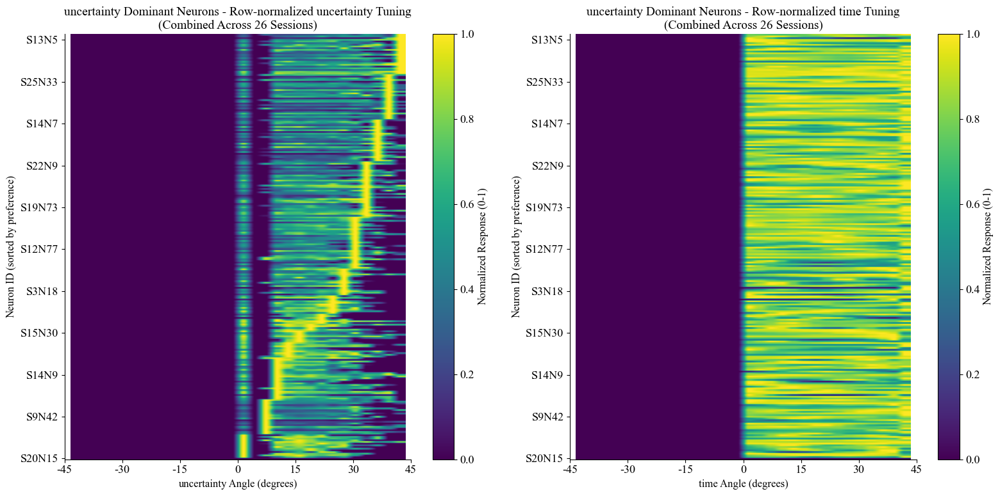

Created combined heatmap for uncertainty Dominant Neurons with 254 neurons


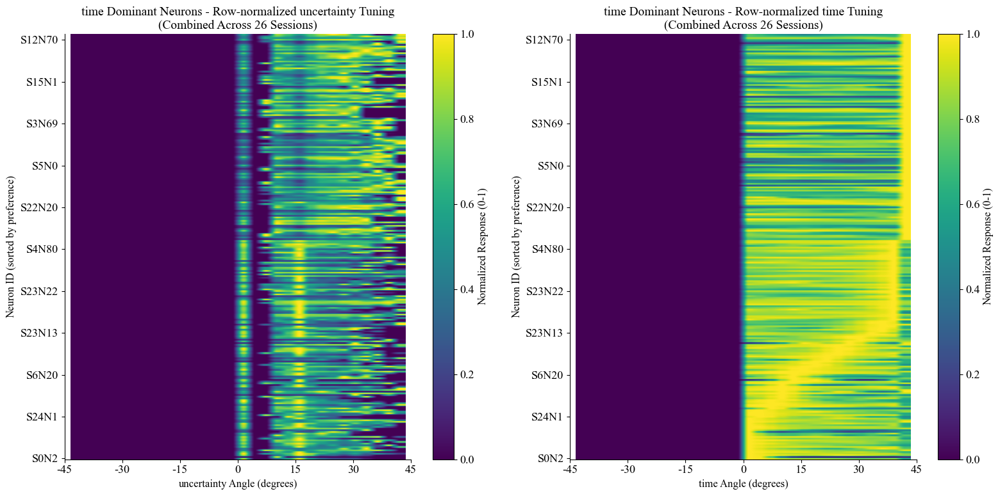

Created combined heatmap for time Dominant Neurons with 254 neurons


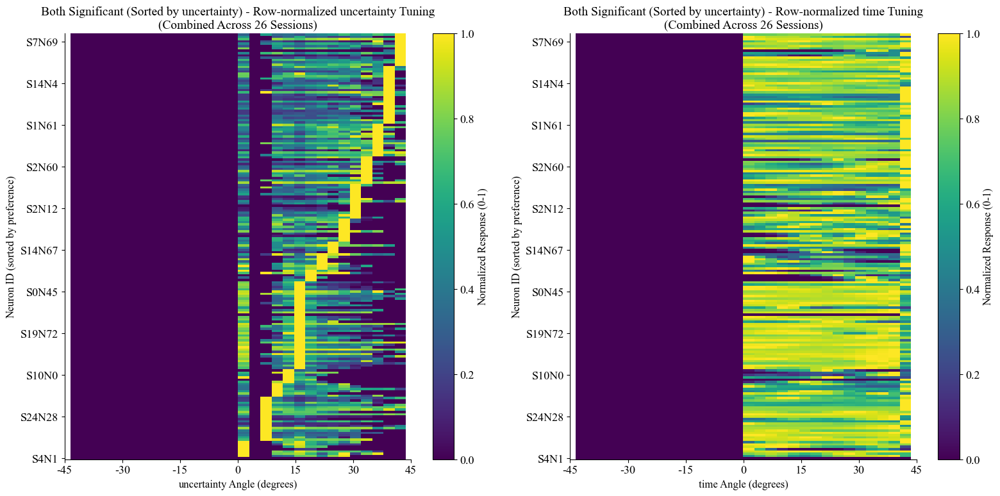

Created combined heatmap for Both Significant (Sorted by uncertainty) with 184 neurons


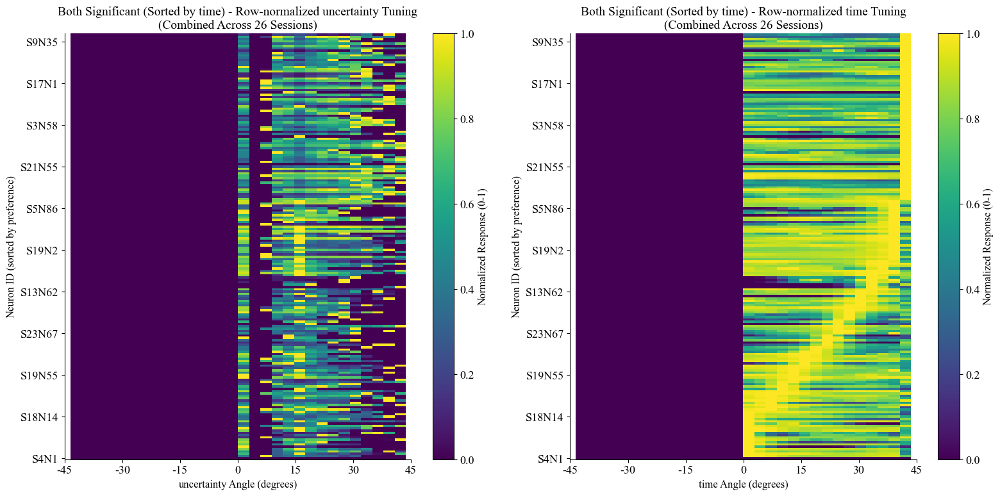

Created combined heatmap for Both Significant (Sorted by time) with 184 neurons

--- Full Neural Encoding Analysis with Heatmaps ---
Neural data shape: (411813, 55)
Belief data shape: (411813,)
Eye data shape: (411813,)
Analyzing 55 neurons

Neuron categorization summary:
  Not significant: 33 neurons (60.0%)
  Indep. belief dominant: 8 neurons (14.5%)
  Indep. eye dominant: 8 neurons (14.5%)
  Both indep. significant: 6 neurons (10.9%)

Independent Belief: Selected 8 neurons
  Neuron indices: [ 2 10  1 29 12 40 21 15]...


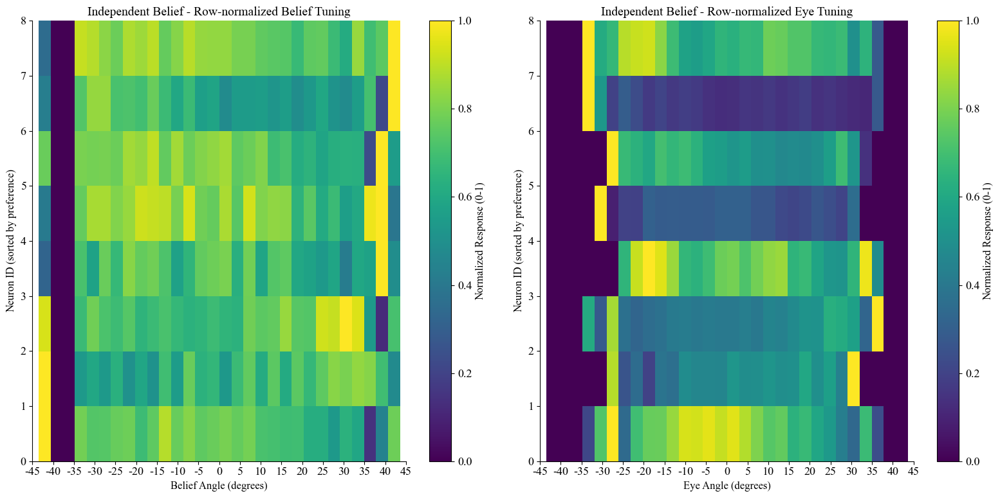


Independent Belief Example Neurons Statistics:
  Neuron 2:
    Independent belief coef: -16.599
    Independent eye coef: 1.705
    Total belief coef: -23.318
    Total eye coef: -4.727

  Neuron 10:
    Independent belief coef: -15.748
    Independent eye coef: 4.135
    Total belief coef: -16.236
    Total eye coef: -0.343

  Neuron 1:
    Independent belief coef: -14.280
    Independent eye coef: 1.108
    Total belief coef: -20.898
    Total eye coef: -4.656

  Neuron 29:
    Independent belief coef: 10.580
    Independent eye coef: 1.380
    Total belief coef: 20.629
    Total eye coef: 7.070

  Neuron 12:
    Independent belief coef: -9.495
    Independent eye coef: 1.266
    Total belief coef: -12.657
    Total eye coef: -2.225


Independent Eye: Selected 8 neurons
  Neuron indices: [24 22 48 27 23 47 42 37]...


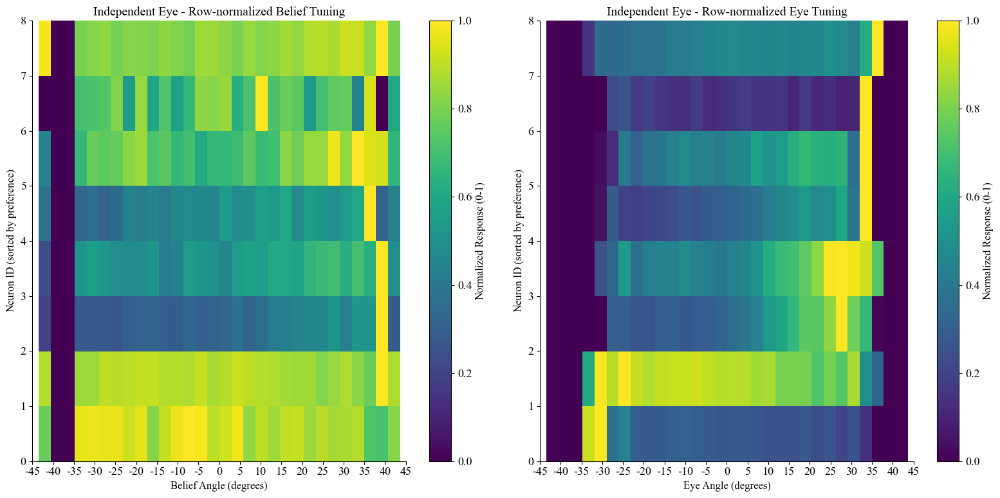


Independent Eye Example Neurons Statistics:
  Neuron 24:
    Independent belief coef: -0.603
    Independent eye coef: 11.918
    Total belief coef: 26.874
    Total eye coef: 19.331

  Neuron 22:
    Independent belief coef: 3.269
    Independent eye coef: 9.560
    Total belief coef: 27.730
    Total eye coef: 17.209

  Neuron 48:
    Independent belief coef: 0.623
    Independent eye coef: 6.470
    Total belief coef: 16.152
    Total eye coef: 10.925

  Neuron 27:
    Independent belief coef: -3.574
    Independent eye coef: 5.614
    Total belief coef: 7.249
    Total eye coef: 7.614

  Neuron 23:
    Independent belief coef: 5.457
    Independent eye coef: -5.196
    Total belief coef: -3.172
    Total eye coef: -6.071

No neurons found for Both Independent

All Neurons: Selected 55 neurons
  Neuron indices: [0 1 2 3 4 5 6 7 8 9]...


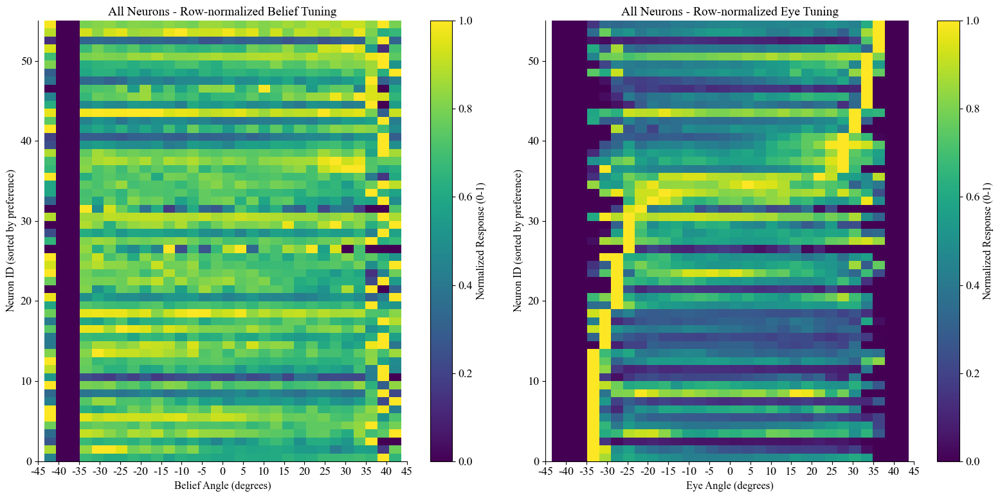

Created individual plots for Session 209

--- Full Neural Encoding Analysis with Heatmaps ---
Neural data shape: (422050, 70)
Belief data shape: (422050,)
Eye data shape: (422050,)
Analyzing 70 neurons

Neuron categorization summary:
  Not significant: 41 neurons (58.6%)
  Indep. belief dominant: 11 neurons (15.7%)
  Indep. eye dominant: 11 neurons (15.7%)
  Both indep. significant: 7 neurons (10.0%)

Independent Belief: Selected 10 neurons
  Neuron indices: [62  0 51 59 47 12 56  7 57 27]...


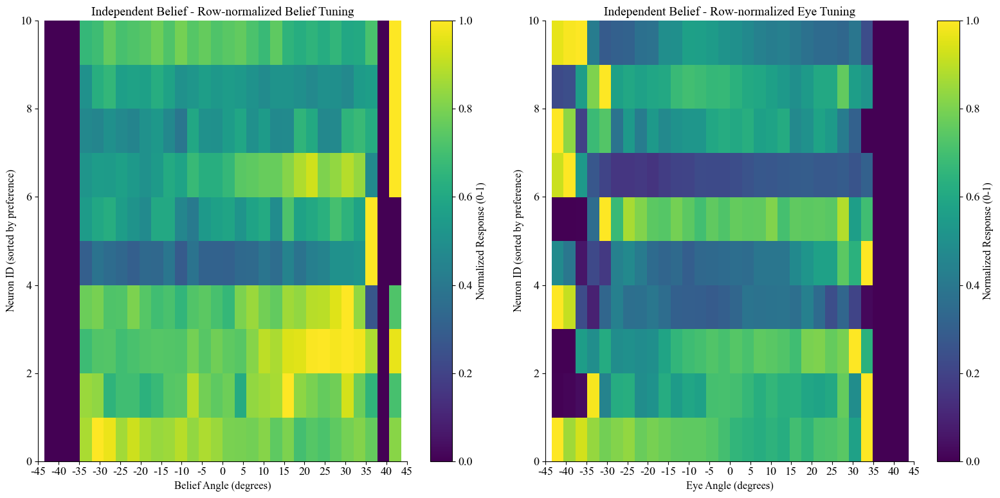


Independent Belief Example Neurons Statistics:
  Neuron 62:
    Independent belief coef: 22.960
    Independent eye coef: 3.944
    Total belief coef: 38.385
    Total eye coef: 14.191

  Neuron 0:
    Independent belief coef: 19.551
    Independent eye coef: -2.056
    Total belief coef: 24.389
    Total eye coef: 4.456

  Neuron 51:
    Independent belief coef: 17.949
    Independent eye coef: 2.904
    Total belief coef: 29.734
    Total eye coef: 10.842

  Neuron 59:
    Independent belief coef: 14.307
    Independent eye coef: -2.382
    Total belief coef: 16.509
    Total eye coef: 2.025

  Neuron 47:
    Independent belief coef: 12.537
    Independent eye coef: -3.458
    Total belief coef: 12.366
    Total eye coef: -0.157


Independent Eye: Selected 10 neurons
  Neuron indices: [20  4 21 35 43  2 63  6  1 49]...


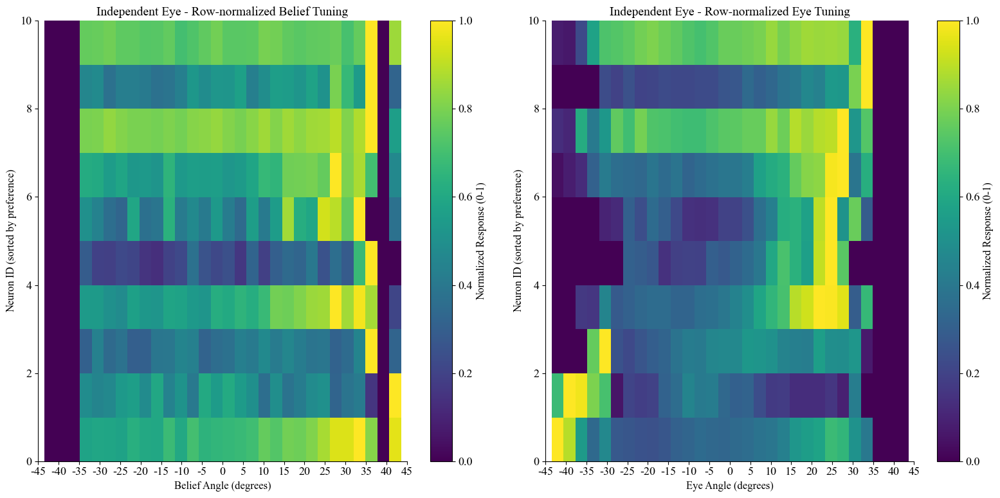


Independent Eye Example Neurons Statistics:
  Neuron 20:
    Independent belief coef: 4.048
    Independent eye coef: 13.271
    Total belief coef: 26.038
    Total eye coef: 20.228

  Neuron 4:
    Independent belief coef: 2.866
    Independent eye coef: 10.605
    Total belief coef: 20.284
    Total eye coef: 16.024

  Neuron 21:
    Independent belief coef: 3.162
    Independent eye coef: 8.860
    Total belief coef: 18.023
    Total eye coef: 13.671

  Neuron 35:
    Independent belief coef: 5.394
    Independent eye coef: 8.664
    Total belief coef: 20.868
    Total eye coef: 14.235

  Neuron 43:
    Independent belief coef: 7.985
    Independent eye coef: 8.661
    Total belief coef: 24.513
    Total eye coef: 15.206

No neurons found for Both Independent

All Neurons: Selected 70 neurons
  Neuron indices: [0 1 2 3 4 5 6 7 8 9]...


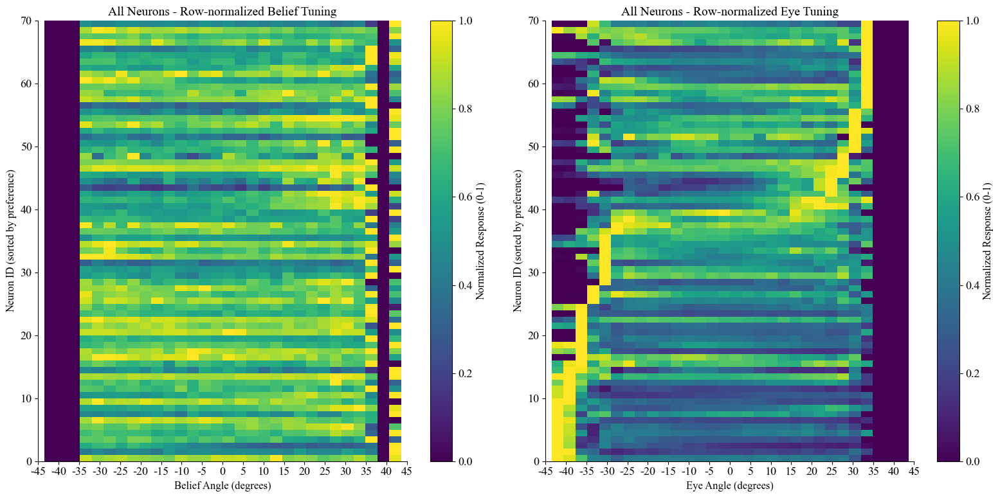

Created individual plots for Session 221

--- Full Neural Encoding Analysis with Heatmaps ---
Neural data shape: (396483, 73)
Belief data shape: (396483,)
Eye data shape: (396483,)
Analyzing 73 neurons

Neuron categorization summary:
  Not significant: 42 neurons (57.5%)
  Indep. belief dominant: 12 neurons (16.4%)
  Indep. eye dominant: 12 neurons (16.4%)
  Both indep. significant: 7 neurons (9.6%)

Independent Belief: Selected 10 neurons
  Neuron indices: [45  2 42  9 40  8 30 65 35 53]...


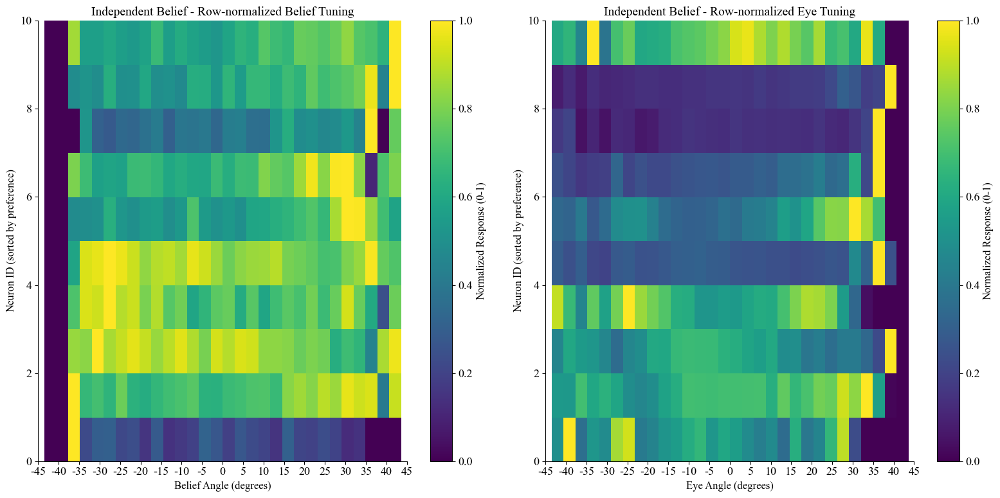


Independent Belief Example Neurons Statistics:
  Neuron 45:
    Independent belief coef: 17.920
    Independent eye coef: 0.181
    Total belief coef: 27.556
    Total eye coef: 8.521

  Neuron 2:
    Independent belief coef: 17.380
    Independent eye coef: 4.051
    Total belief coef: 33.389
    Total eye coef: 14.157

  Neuron 42:
    Independent belief coef: -17.005
    Independent eye coef: 0.991
    Total belief coef: -24.150
    Total eye coef: -6.319

  Neuron 9:
    Independent belief coef: -16.526
    Independent eye coef: 1.386
    Total belief coef: -22.742
    Total eye coef: -5.497

  Neuron 40:
    Independent belief coef: 16.299
    Independent eye coef: -1.270
    Total belief coef: 22.597
    Total eye coef: 5.570


Independent Eye: Selected 10 neurons
  Neuron indices: [21 12 72 62 69 63 49 24 71 22]...


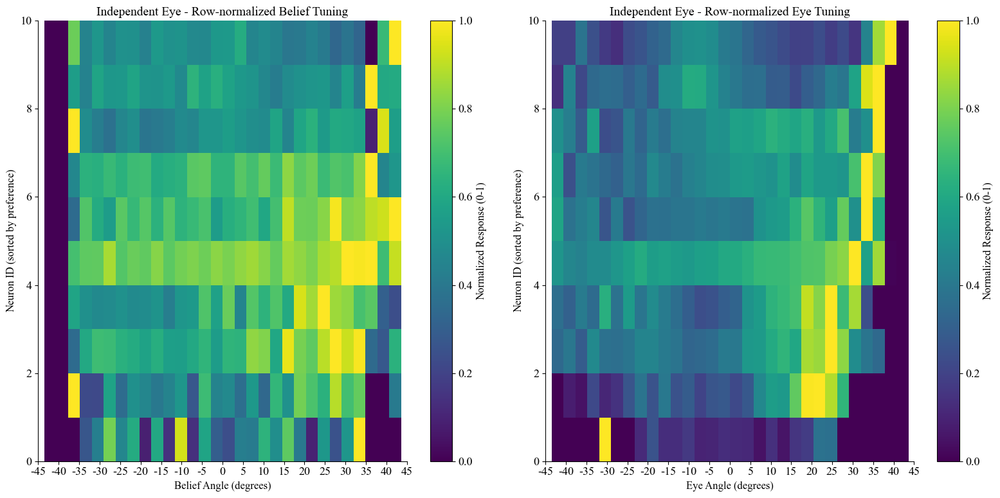


Independent Eye Example Neurons Statistics:
  Neuron 21:
    Independent belief coef: 2.190
    Independent eye coef: 20.363
    Total belief coef: 38.344
    Total eye coef: 31.973

  Neuron 12:
    Independent belief coef: -2.617
    Independent eye coef: 10.169
    Total belief coef: 13.502
    Total eye coef: 14.255

  Neuron 72:
    Independent belief coef: 1.791
    Independent eye coef: 9.886
    Total belief coef: 19.717
    Total eye coef: 15.853

  Neuron 62:
    Independent belief coef: 0.943
    Independent eye coef: 9.292
    Total belief coef: 17.408
    Total eye coef: 14.561

  Neuron 69:
    Independent belief coef: 7.141
    Independent eye coef: 7.107
    Total belief coef: 23.075
    Total eye coef: 14.091

No neurons found for Both Independent

All Neurons: Selected 73 neurons
  Neuron indices: [0 1 2 3 4 5 6 7 8 9]...


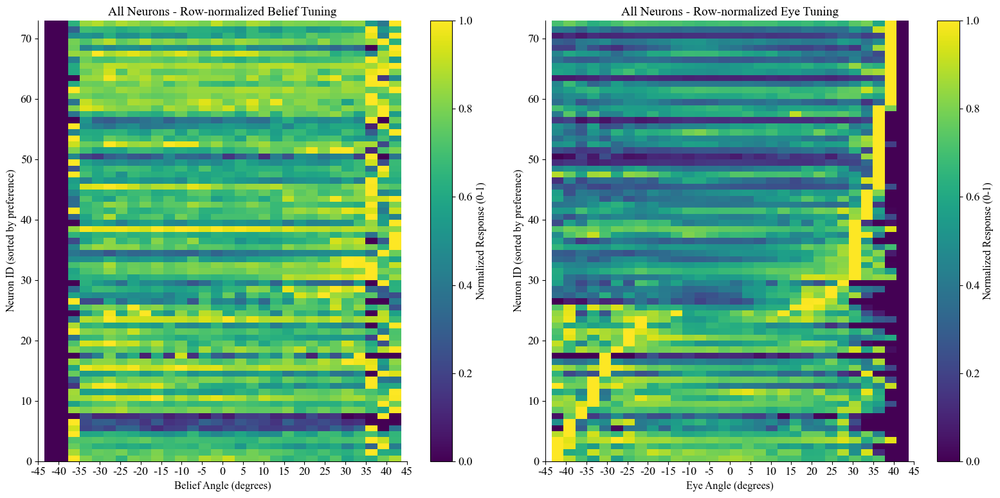

Created individual plots for Session 220

--- Full Neural Encoding Analysis with Heatmaps ---
Neural data shape: (420226, 76)
Belief data shape: (420226,)
Eye data shape: (420226,)
Analyzing 76 neurons

Neuron categorization summary:
  Not significant: 46 neurons (60.5%)
  Indep. belief dominant: 11 neurons (14.5%)
  Indep. eye dominant: 11 neurons (14.5%)
  Both indep. significant: 8 neurons (10.5%)

Independent Belief: Selected 10 neurons
  Neuron indices: [66 67 69 45 49  2 51 41  0 46]...


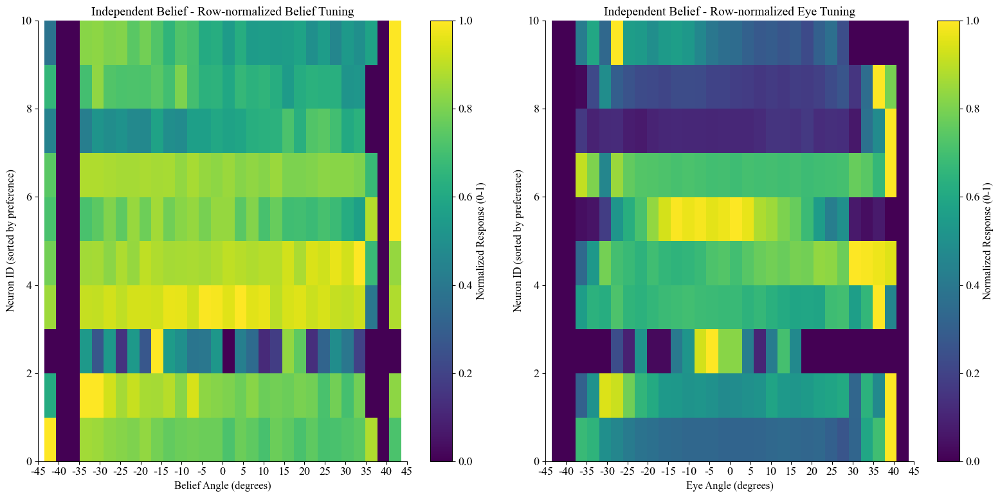


Independent Belief Example Neurons Statistics:
  Neuron 66:
    Independent belief coef: -32.257
    Independent eye coef: 2.590
    Total belief coef: -42.721
    Total eye coef: -8.675

  Neuron 67:
    Independent belief coef: -15.939
    Independent eye coef: 1.348
    Total belief coef: -20.989
    Total eye coef: -4.187

  Neuron 69:
    Independent belief coef: -13.625
    Independent eye coef: 0.262
    Total belief coef: -19.517
    Total eye coef: -4.885

  Neuron 45:
    Independent belief coef: 11.971
    Independent eye coef: 1.217
    Total belief coef: 19.706
    Total eye coef: 6.414

  Neuron 49:
    Independent belief coef: -10.940
    Independent eye coef: 1.940
    Total belief coef: -12.610
    Total eye coef: -1.385


Independent Eye: Selected 10 neurons
  Neuron indices: [17 19 43 72  5  7 40 18 33 37]...


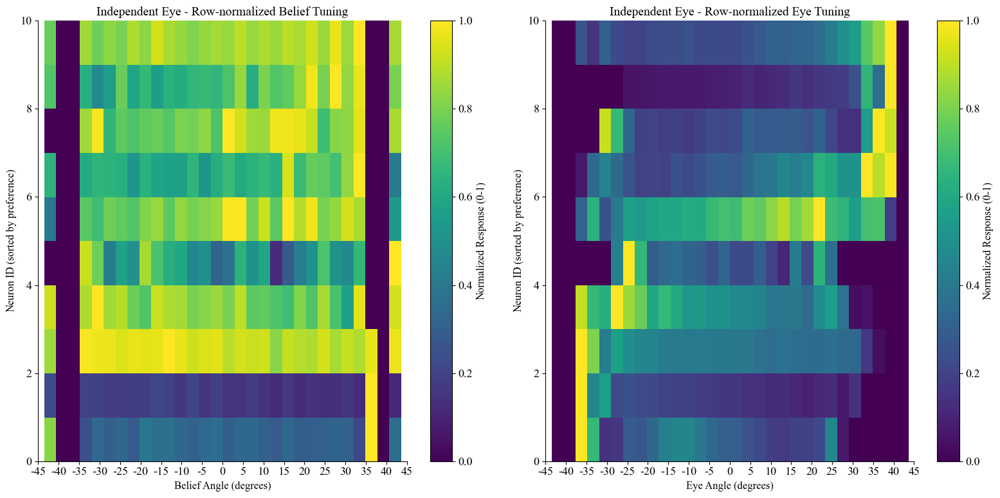


Independent Eye Example Neurons Statistics:
  Neuron 17:
    Independent belief coef: 3.487
    Independent eye coef: 12.274
    Total belief coef: 26.819
    Total eye coef: 19.345

  Neuron 19:
    Independent belief coef: -1.389
    Independent eye coef: 10.309
    Total belief coef: 16.197
    Total eye coef: 14.581

  Neuron 43:
    Independent belief coef: -4.931
    Independent eye coef: 9.472
    Total belief coef: 9.522
    Total eye coef: 11.984

  Neuron 72:
    Independent belief coef: 3.280
    Independent eye coef: -7.928
    Total belief coef: -9.211
    Total eye coef: -10.357

  Neuron 5:
    Independent belief coef: 4.383
    Independent eye coef: -7.825
    Total belief coef: -7.411
    Total eye coef: -9.779

No neurons found for Both Independent

All Neurons: Selected 76 neurons
  Neuron indices: [0 1 2 3 4 5 6 7 8 9]...


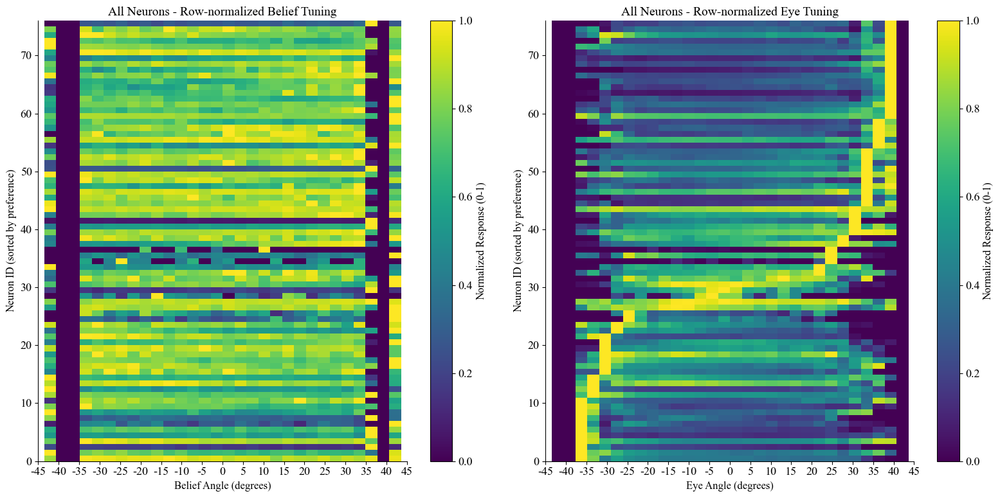

Created individual plots for Session 208

--- Full Neural Encoding Analysis with Heatmaps ---
Neural data shape: (343240, 87)
Belief data shape: (343240,)
Eye data shape: (343240,)
Analyzing 87 neurons

Neuron categorization summary:
  Not significant: 53 neurons (60.9%)
  Indep. belief dominant: 12 neurons (13.8%)
  Indep. eye dominant: 12 neurons (13.8%)
  Both indep. significant: 10 neurons (11.5%)

Independent Belief: Selected 10 neurons
  Neuron indices: [ 7 79 48 22 84 83 17 46 71 49]...


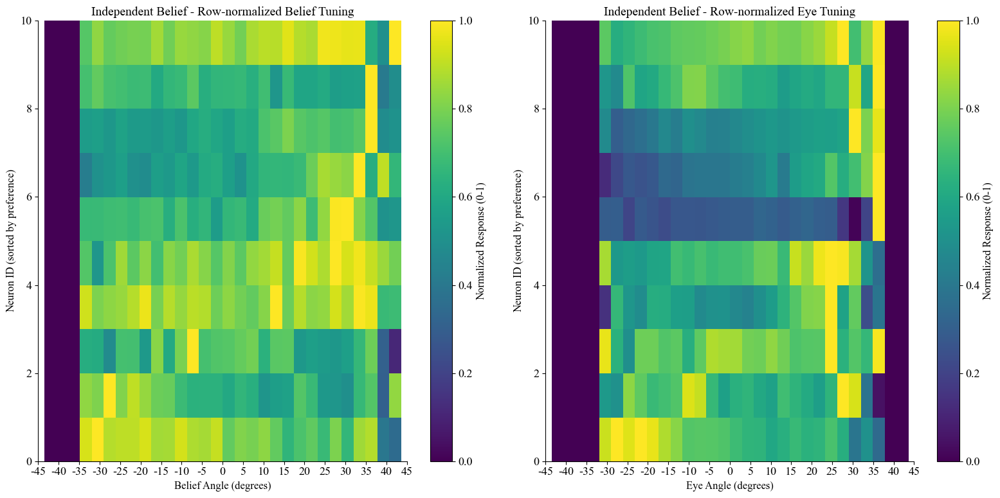


Independent Belief Example Neurons Statistics:
  Neuron 7:
    Independent belief coef: 19.312
    Independent eye coef: -0.951
    Total belief coef: 27.762
    Total eye coef: 6.724

  Neuron 79:
    Independent belief coef: -17.766
    Independent eye coef: 0.920
    Total belief coef: -25.426
    Total eye coef: -6.103

  Neuron 48:
    Independent belief coef: 14.174
    Independent eye coef: -2.975
    Total belief coef: 15.966
    Total eye coef: 1.430

  Neuron 22:
    Independent belief coef: 13.742
    Independent eye coef: 3.839
    Total belief coef: 28.458
    Total eye coef: 11.703

  Neuron 84:
    Independent belief coef: -8.324
    Independent eye coef: -3.405
    Total belief coef: -19.342
    Total eye coef: -8.748


Independent Eye: Selected 10 neurons
  Neuron indices: [10  8 74 11 81 68 31  9 76 53]...


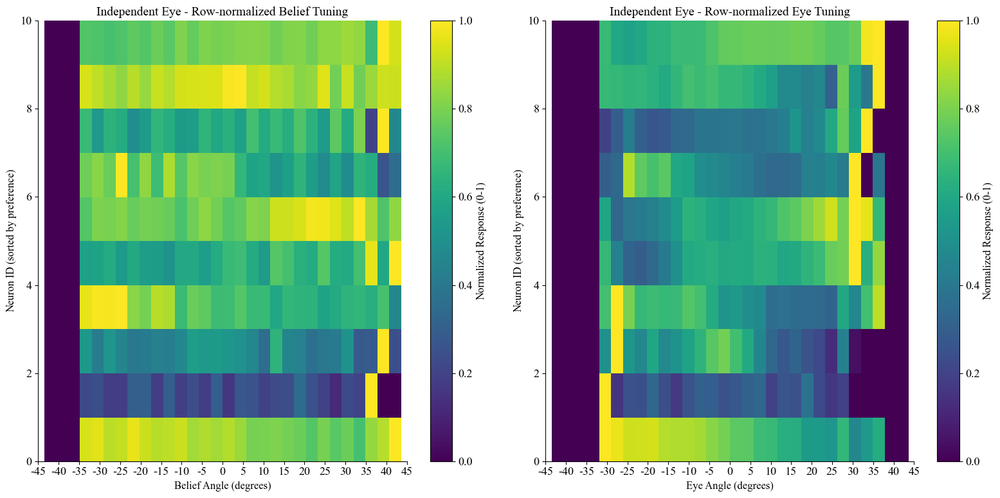


Independent Eye Example Neurons Statistics:
  Neuron 10:
    Independent belief coef: -0.066
    Independent eye coef: -16.668
    Total belief coef: -32.249
    Total eye coef: -25.586

  Neuron 8:
    Independent belief coef: 1.418
    Independent eye coef: -11.548
    Total belief coef: -20.070
    Total eye coef: -17.102

  Neuron 74:
    Independent belief coef: 6.451
    Independent eye coef: -9.038
    Total belief coef: -7.511
    Total eye coef: -11.108

  Neuron 11:
    Independent belief coef: -2.896
    Independent eye coef: -8.466
    Total belief coef: -20.786
    Total eye coef: -14.224

  Neuron 81:
    Independent belief coef: 2.440
    Independent eye coef: 7.969
    Total belief coef: 19.100
    Total eye coef: 13.247

No neurons found for Both Independent

All Neurons: Selected 87 neurons
  Neuron indices: [0 1 2 3 4 5 6 7 8 9]...


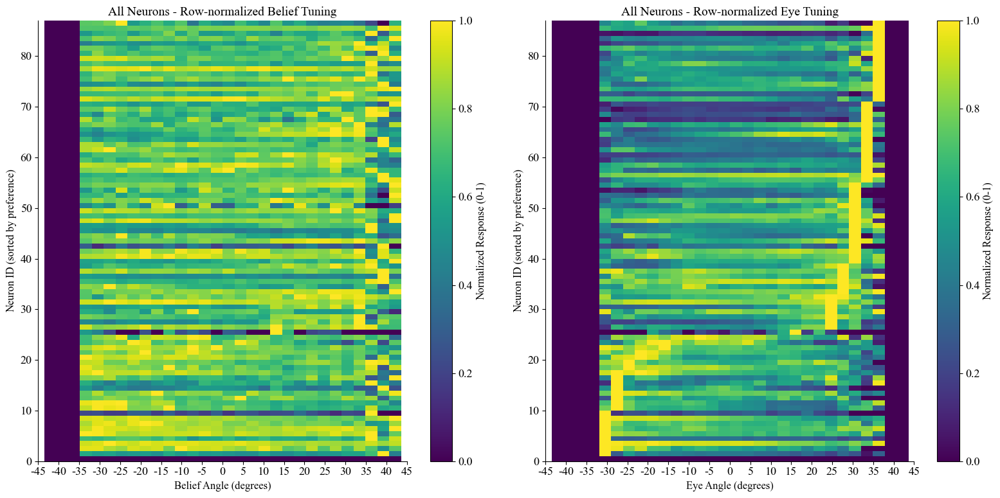

Created individual plots for Session 183

--- Full Neural Encoding Analysis with Heatmaps ---
Neural data shape: (96616, 87)
Belief data shape: (96616,)
Eye data shape: (96616,)
Analyzing 87 neurons

Neuron categorization summary:
  Not significant: 53 neurons (60.9%)
  Indep. eye dominant: 12 neurons (13.8%)
  Indep. belief dominant: 12 neurons (13.8%)
  Both indep. significant: 10 neurons (11.5%)

Independent Belief: Selected 10 neurons
  Neuron indices: [68 78 71  3 51  2 50  8 75 29]...


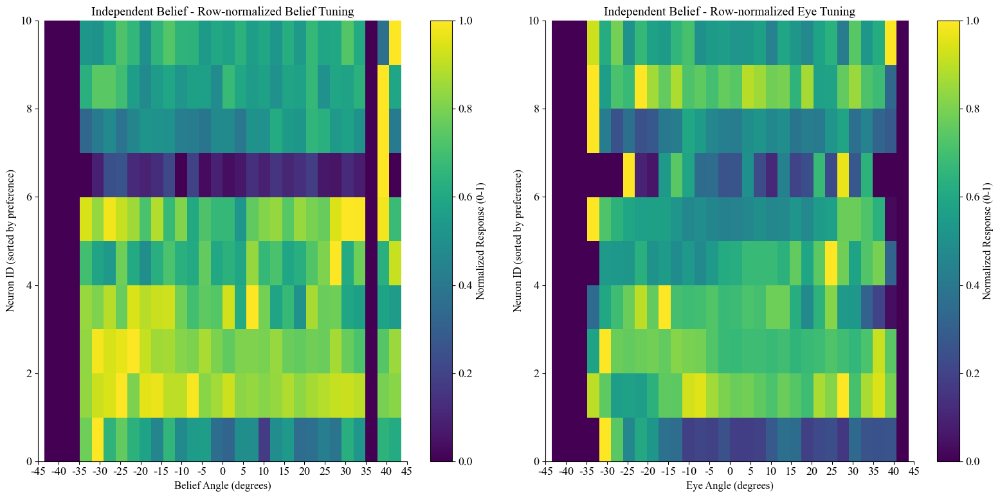


Independent Belief Example Neurons Statistics:
  Neuron 68:
    Independent belief coef: -16.498
    Independent eye coef: 3.907
    Total belief coef: -19.011
    Total eye coef: -2.587

  Neuron 78:
    Independent belief coef: -16.253
    Independent eye coef: -0.984
    Total belief coef: -25.752
    Total eye coef: -9.781

  Neuron 71:
    Independent belief coef: 15.608
    Independent eye coef: -5.174
    Total belief coef: 15.838
    Total eye coef: 0.237

  Neuron 3:
    Independent belief coef: -14.729
    Independent eye coef: 5.707
    Total belief coef: -13.748
    Total eye coef: 1.010

  Neuron 51:
    Independent belief coef: -13.298
    Independent eye coef: -2.212
    Total belief coef: -23.114
    Total eye coef: -10.108


Independent Eye: Selected 10 neurons
  Neuron indices: [74 82 43 12 84 24  0 72 61 40]...


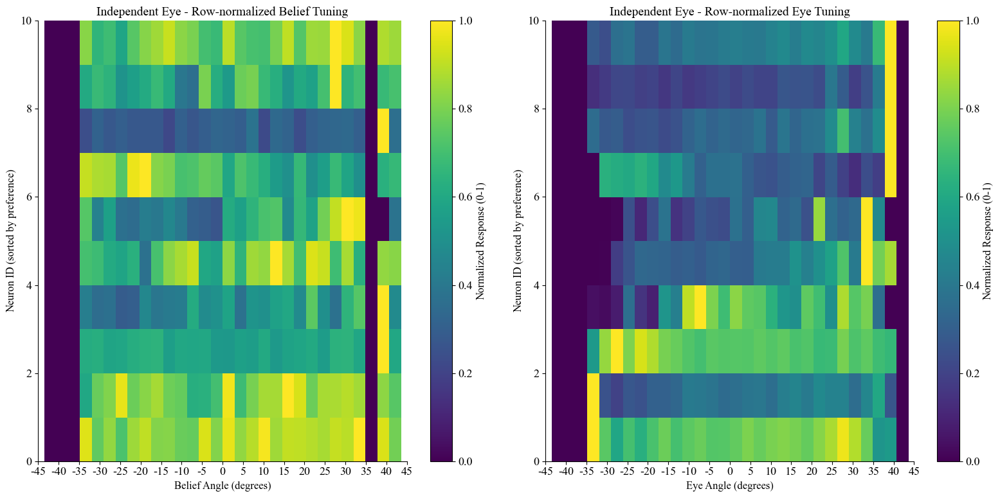


Independent Eye Example Neurons Statistics:
  Neuron 74:
    Independent belief coef: -0.401
    Independent eye coef: 22.448
    Total belief coef: 32.021
    Total eye coef: 33.386

  Neuron 82:
    Independent belief coef: 7.714
    Independent eye coef: 14.225
    Total belief coef: 32.215
    Total eye coef: 25.229

  Neuron 43:
    Independent belief coef: -1.717
    Independent eye coef: -13.671
    Total belief coef: -22.436
    Total eye coef: -21.335

  Neuron 12:
    Independent belief coef: -1.698
    Independent eye coef: 11.901
    Total belief coef: 14.754
    Total eye coef: 16.941

  Neuron 84:
    Independent belief coef: 7.891
    Independent eye coef: -10.507
    Total belief coef: -3.460
    Total eye coef: -11.688

No neurons found for Both Independent

All Neurons: Selected 87 neurons
  Neuron indices: [0 1 2 3 4 5 6 7 8 9]...


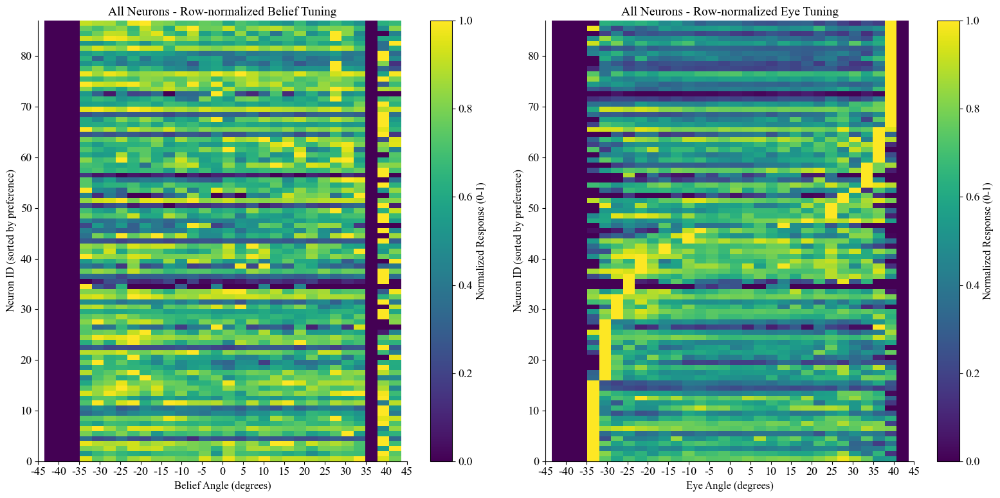

Created individual plots for Session 187

--- Full Neural Encoding Analysis with Heatmaps ---
Neural data shape: (282087, 81)
Belief data shape: (282087,)
Eye data shape: (282087,)
Analyzing 81 neurons

Neuron categorization summary:
  Not significant: 50 neurons (61.7%)
  Both indep. significant: 11 neurons (13.6%)
  Indep. eye dominant: 10 neurons (12.3%)
  Indep. belief dominant: 10 neurons (12.3%)

Independent Belief: Selected 10 neurons
  Neuron indices: [65 37 79 26 19 62 15 74 71 51]...


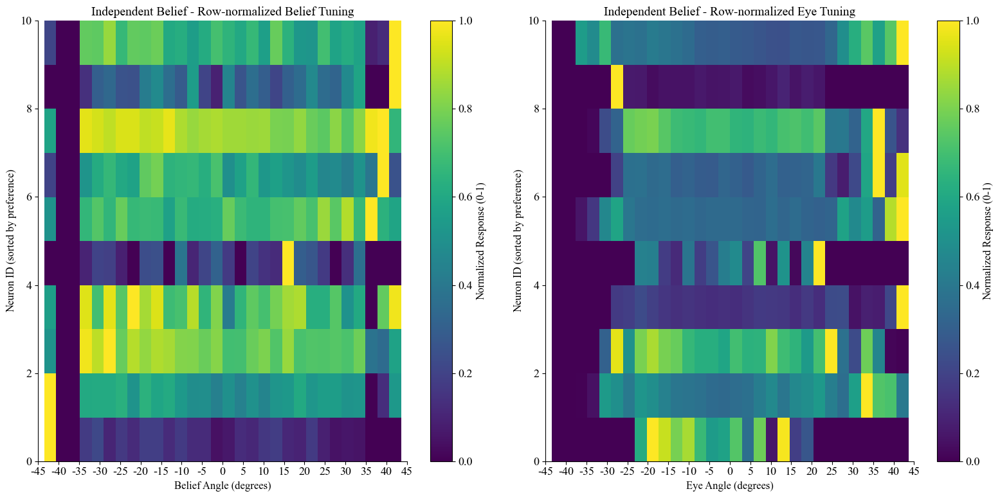


Independent Belief Example Neurons Statistics:
  Neuron 65:
    Independent belief coef: 52.956
    Independent eye coef: -0.223
    Total belief coef: 72.713
    Total eye coef: 15.151

  Neuron 37:
    Independent belief coef: -29.670
    Independent eye coef: -4.221
    Total belief coef: -48.564
    Total eye coef: -14.490

  Neuron 79:
    Independent belief coef: 28.213
    Independent eye coef: -3.949
    Total belief coef: 31.842
    Total eye coef: 2.784

  Neuron 26:
    Independent belief coef: -12.878
    Independent eye coef: 2.056
    Total belief coef: -14.078
    Total eye coef: -0.920

  Neuron 19:
    Independent belief coef: -12.473
    Independent eye coef: 2.024
    Total belief coef: -13.578
    Total eye coef: -0.847


Independent Eye: Selected 10 neurons
  Neuron indices: [20 34  6  2  9 75 56  5 42 58]...


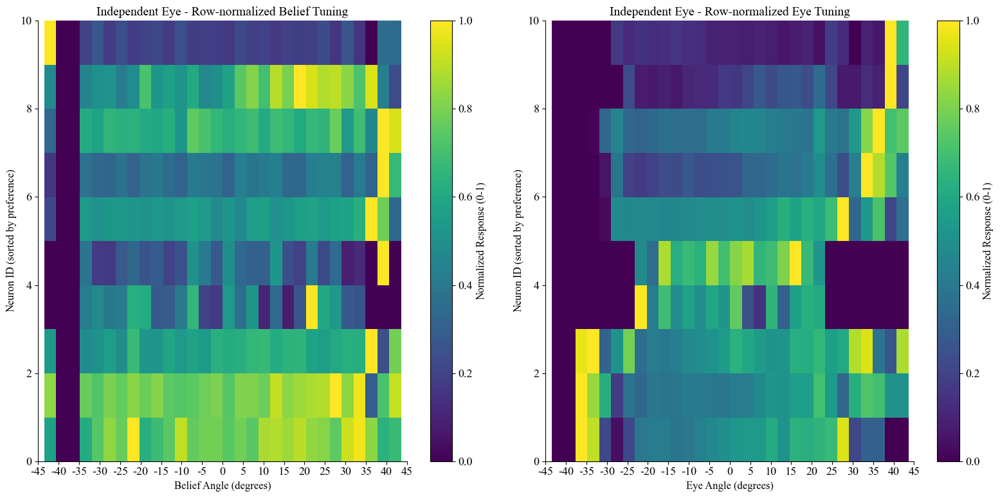


Independent Eye Example Neurons Statistics:
  Neuron 20:
    Independent belief coef: 7.935
    Independent eye coef: 13.360
    Total belief coef: 35.005
    Total eye coef: 20.760

  Neuron 34:
    Independent belief coef: -6.726
    Independent eye coef: 9.595
    Total belief coef: 7.987
    Total eye coef: 11.284

  Neuron 6:
    Independent belief coef: -6.326
    Independent eye coef: 9.252
    Total belief coef: 7.922
    Total eye coef: 10.927

  Neuron 2:
    Independent belief coef: -6.487
    Independent eye coef: 7.556
    Total belief coef: 4.646
    Total eye coef: 8.538

  Neuron 9:
    Independent belief coef: 4.406
    Independent eye coef: -6.647
    Total belief coef: -5.884
    Total eye coef: -7.892

No neurons found for Both Independent

All Neurons: Selected 81 neurons
  Neuron indices: [0 1 2 3 4 5 6 7 8 9]...


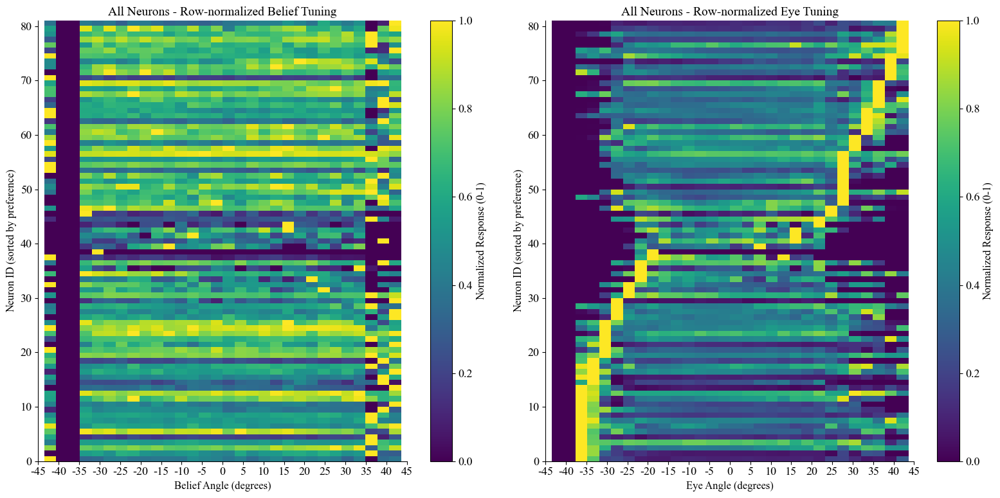

Created individual plots for Session 218

--- Full Neural Encoding Analysis with Heatmaps ---
Neural data shape: (294034, 79)
Belief data shape: (294034,)
Eye data shape: (294034,)
Analyzing 79 neurons

Neuron categorization summary:
  Not significant: 51 neurons (64.6%)
  Both indep. significant: 12 neurons (15.2%)
  Indep. eye dominant: 8 neurons (10.1%)
  Indep. belief dominant: 8 neurons (10.1%)

Independent Belief: Selected 8 neurons
  Neuron indices: [21 51 73  6 32 17 69 44]...


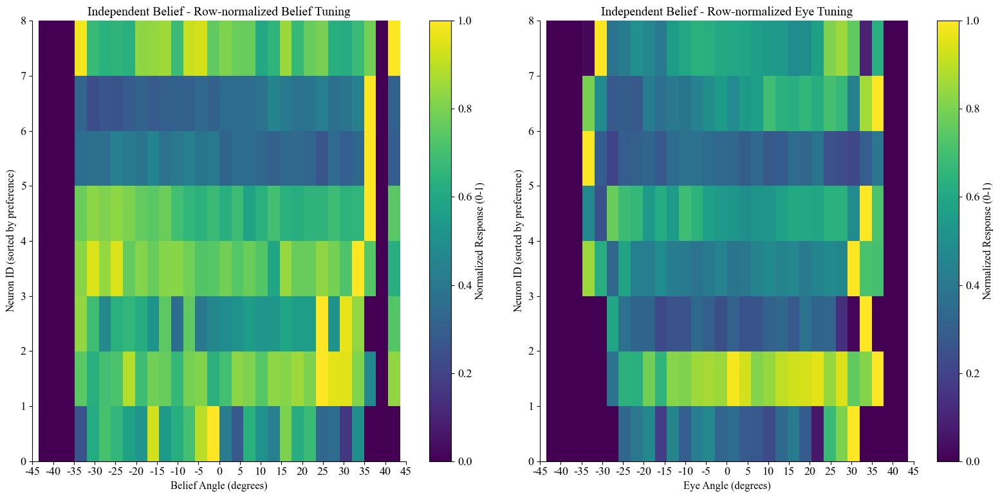


Independent Belief Example Neurons Statistics:
  Neuron 21:
    Independent belief coef: -22.851
    Independent eye coef: 0.593
    Total belief coef: -36.340
    Total eye coef: -10.220

  Neuron 51:
    Independent belief coef: -11.670
    Independent eye coef: 3.132
    Total belief coef: -12.409
    Total eye coef: -0.560

  Neuron 73:
    Independent belief coef: 10.224
    Independent eye coef: -0.417
    Total belief coef: 15.931
    Total eye coef: 4.323

  Neuron 6:
    Independent belief coef: -9.987
    Independent eye coef: 0.953
    Total belief coef: -14.373
    Total eye coef: -3.323

  Neuron 32:
    Independent belief coef: 9.965
    Independent eye coef: 4.465
    Total belief coef: 26.115
    Total eye coef: 12.235


Independent Eye: Selected 8 neurons
  Neuron indices: [65 39  8  1 77 34 25 58]...


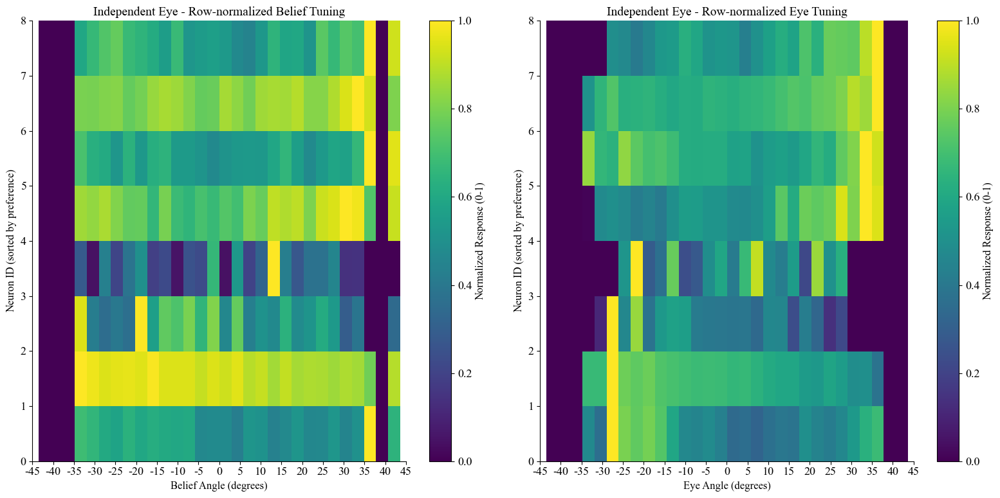


Independent Eye Example Neurons Statistics:
  Neuron 65:
    Independent belief coef: 4.496
    Independent eye coef: -9.048
    Total belief coef: -12.263
    Total eye coef: -12.697

  Neuron 39:
    Independent belief coef: 3.276
    Independent eye coef: -8.633
    Total belief coef: -13.370
    Total eye coef: -12.611

  Neuron 8:
    Independent belief coef: 4.152
    Independent eye coef: -8.612
    Total belief coef: -11.881
    Total eye coef: -12.146

  Neuron 1:
    Independent belief coef: 3.819
    Independent eye coef: 7.926
    Total belief coef: 23.518
    Total eye coef: 14.924

  Neuron 77:
    Independent belief coef: 3.766
    Independent eye coef: 6.464
    Total belief coef: 20.252
    Total eye coef: 12.490

No neurons found for Both Independent

All Neurons: Selected 79 neurons
  Neuron indices: [0 1 2 3 4 5 6 7 8 9]...


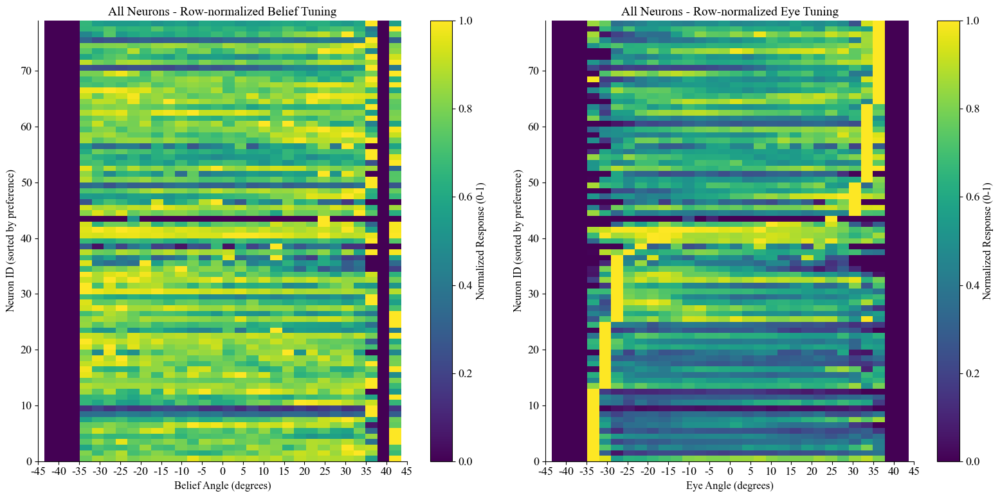

Created individual plots for Session 185

--- Full Neural Encoding Analysis with Heatmaps ---
Neural data shape: (364850, 73)
Belief data shape: (364850,)
Eye data shape: (364850,)
Analyzing 73 neurons

Neuron categorization summary:
  Not significant: 44 neurons (60.3%)
  Indep. eye dominant: 10 neurons (13.7%)
  Indep. belief dominant: 10 neurons (13.7%)
  Both indep. significant: 9 neurons (12.3%)

Independent Belief: Selected 10 neurons
  Neuron indices: [54 44 37 34 68 41 57 33 67 35]...


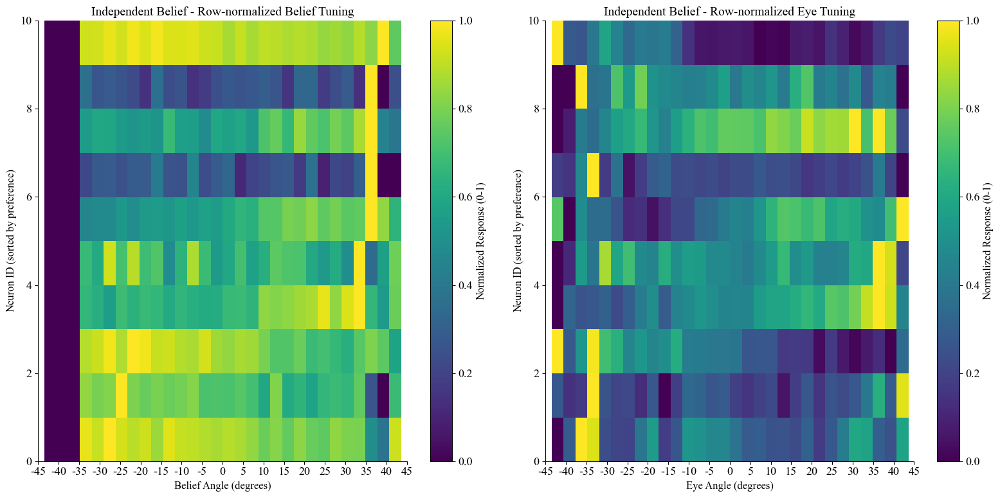


Independent Belief Example Neurons Statistics:
  Neuron 54:
    Independent belief coef: 27.230
    Independent eye coef: 1.857
    Total belief coef: 42.776
    Total eye coef: 17.083

  Neuron 44:
    Independent belief coef: -16.853
    Independent eye coef: 6.229
    Total belief coef: -16.543
    Total eye coef: 0.340

  Neuron 37:
    Independent belief coef: 15.917
    Independent eye coef: 1.515
    Total belief coef: 25.583
    Total eye coef: 10.621

  Neuron 34:
    Independent belief coef: -15.074
    Independent eye coef: 0.949
    Total belief coef: -21.018
    Total eye coef: -6.533

  Neuron 68:
    Independent belief coef: 11.919
    Independent eye coef: 4.938
    Total belief coef: 24.277
    Total eye coef: 13.579


Independent Eye: Selected 10 neurons
  Neuron indices: [28 61 32 25 56 22 30 60 19  4]...


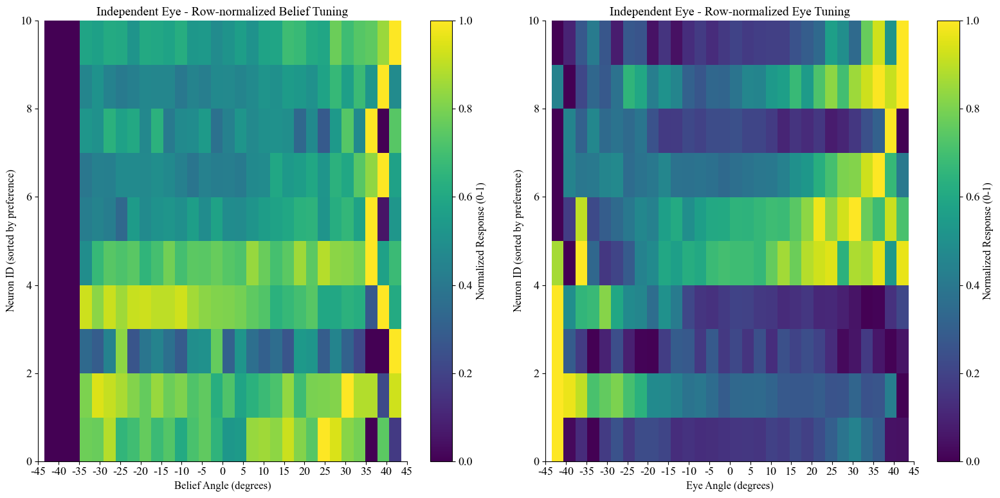


Independent Eye Example Neurons Statistics:
  Neuron 28:
    Independent belief coef: -2.957
    Independent eye coef: 12.582
    Total belief coef: 12.562
    Total eye coef: 17.054

  Neuron 61:
    Independent belief coef: 4.554
    Independent eye coef: -12.496
    Total belief coef: -10.084
    Total eye coef: -16.086

  Neuron 32:
    Independent belief coef: 5.495
    Independent eye coef: 11.738
    Total belief coef: 23.926
    Total eye coef: 20.254

  Neuron 25:
    Independent belief coef: -0.347
    Independent eye coef: -11.098
    Total belief coef: -15.451
    Total eye coef: -16.597

  Neuron 56:
    Independent belief coef: 2.569
    Independent eye coef: -9.753
    Total belief coef: -9.328
    Total eye coef: -13.073

No neurons found for Both Independent

All Neurons: Selected 73 neurons
  Neuron indices: [0 1 2 3 4 5 6 7 8 9]...


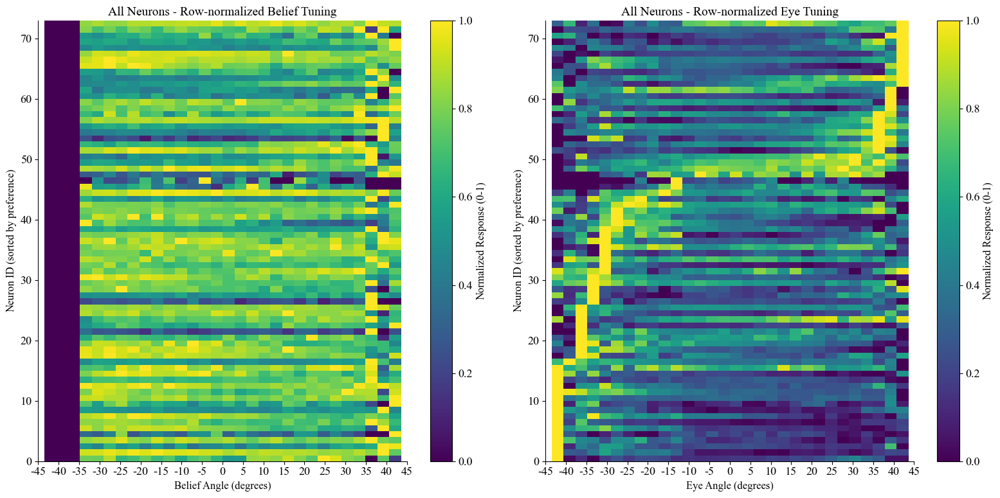

Created individual plots for Session 190

--- Full Neural Encoding Analysis with Heatmaps ---
Neural data shape: (383380, 72)
Belief data shape: (383380,)
Eye data shape: (383380,)
Analyzing 72 neurons

Neuron categorization summary:
  Not significant: 44 neurons (61.1%)
  Indep. eye dominant: 10 neurons (13.9%)
  Indep. belief dominant: 10 neurons (13.9%)
  Both indep. significant: 8 neurons (11.1%)

Independent Belief: Selected 10 neurons
  Neuron indices: [57 70 16 69  5 19 18 39 63 54]...


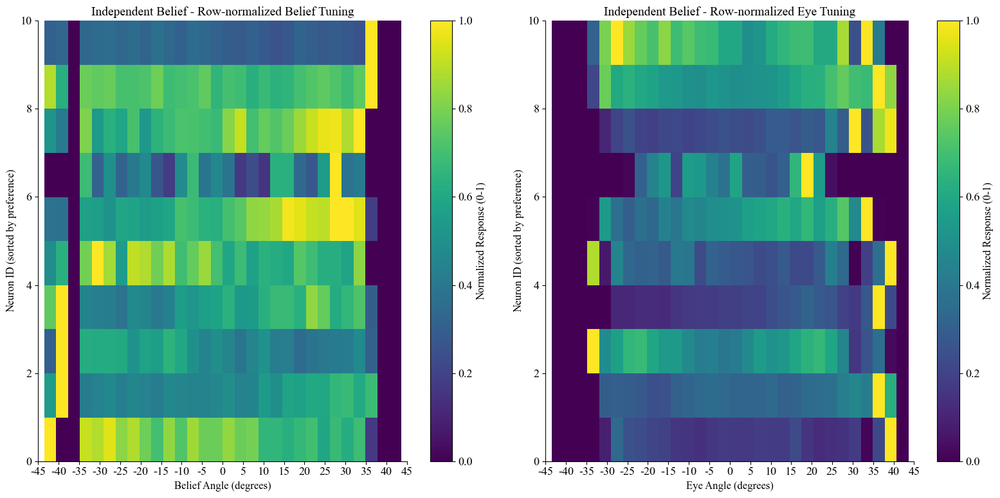


Independent Belief Example Neurons Statistics:
  Neuron 57:
    Independent belief coef: 27.545
    Independent eye coef: 1.560
    Total belief coef: 41.527
    Total eye coef: 11.737

  Neuron 70:
    Independent belief coef: 25.968
    Independent eye coef: -0.815
    Total belief coef: 35.305
    Total eye coef: 7.837

  Neuron 16:
    Independent belief coef: -16.490
    Independent eye coef: 0.841
    Total belief coef: -21.876
    Total eye coef: -4.521

  Neuron 69:
    Independent belief coef: 16.298
    Independent eye coef: -0.574
    Total belief coef: 22.054
    Total eye coef: 4.831

  Neuron 5:
    Independent belief coef: -15.509
    Independent eye coef: 4.319
    Total belief coef: -14.637
    Total eye coef: 0.731


Independent Eye: Selected 10 neurons
  Neuron indices: [45 59 49  4 14 40 22 43 62  6]...


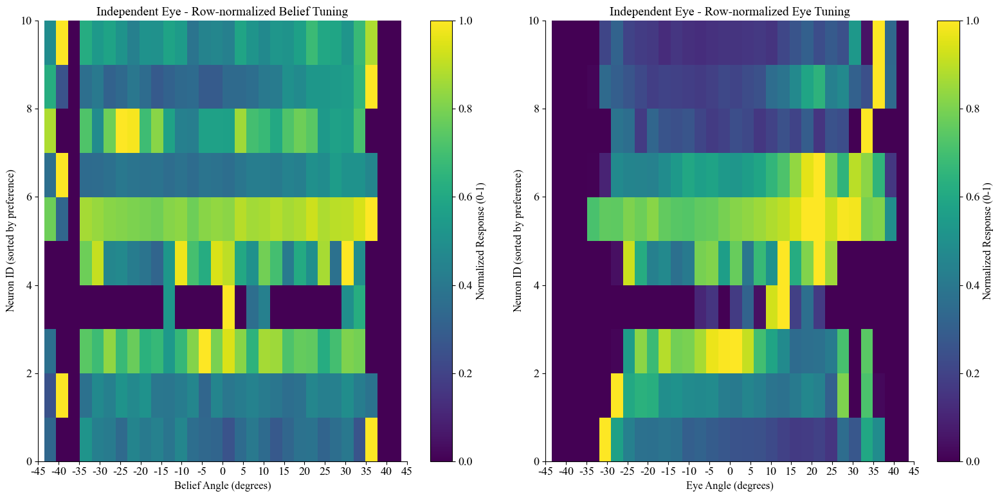


Independent Eye Example Neurons Statistics:
  Neuron 45:
    Independent belief coef: 6.896
    Independent eye coef: 58.994
    Total belief coef: 109.001
    Total eye coef: 85.707

  Neuron 59:
    Independent belief coef: -0.450
    Independent eye coef: 8.412
    Total belief coef: 13.517
    Total eye coef: 11.724

  Neuron 49:
    Independent belief coef: -5.059
    Independent eye coef: -7.547
    Total belief coef: -19.842
    Total eye coef: -12.410

  Neuron 4:
    Independent belief coef: 3.332
    Independent eye coef: -7.328
    Total belief coef: -7.624
    Total eye coef: -9.197

  Neuron 14:
    Independent belief coef: 5.553
    Independent eye coef: -7.139
    Total belief coef: -4.169
    Total eye coef: -8.161

No neurons found for Both Independent

All Neurons: Selected 72 neurons
  Neuron indices: [0 1 2 3 4 5 6 7 8 9]...


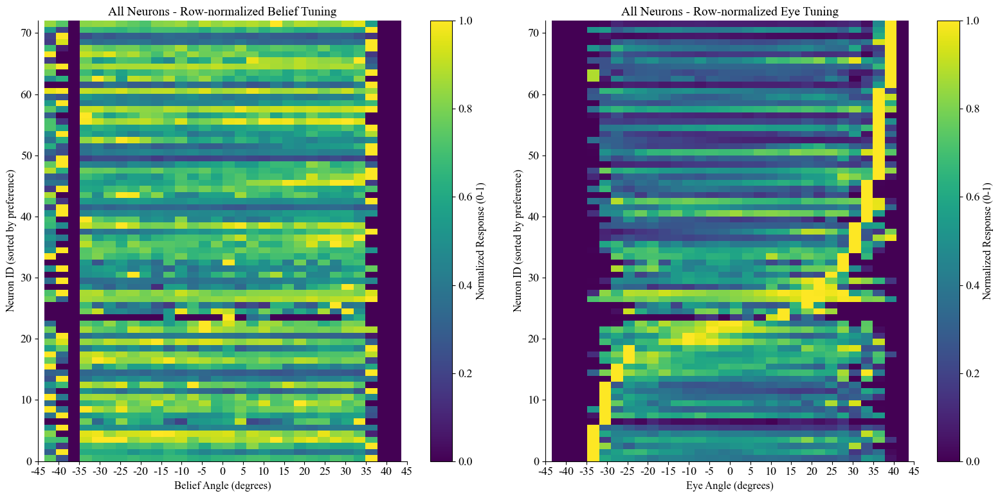

Created individual plots for Session 219

--- Full Neural Encoding Analysis with Heatmaps ---
Neural data shape: (419255, 64)
Belief data shape: (419255,)
Eye data shape: (419255,)
Analyzing 64 neurons

Neuron categorization summary:
  Not significant: 38 neurons (59.4%)
  Indep. belief dominant: 10 neurons (15.6%)
  Indep. eye dominant: 10 neurons (15.6%)
  Both indep. significant: 6 neurons (9.4%)

Independent Belief: Selected 10 neurons
  Neuron indices: [53 38 28  1 59 58 52 36 55 27]...


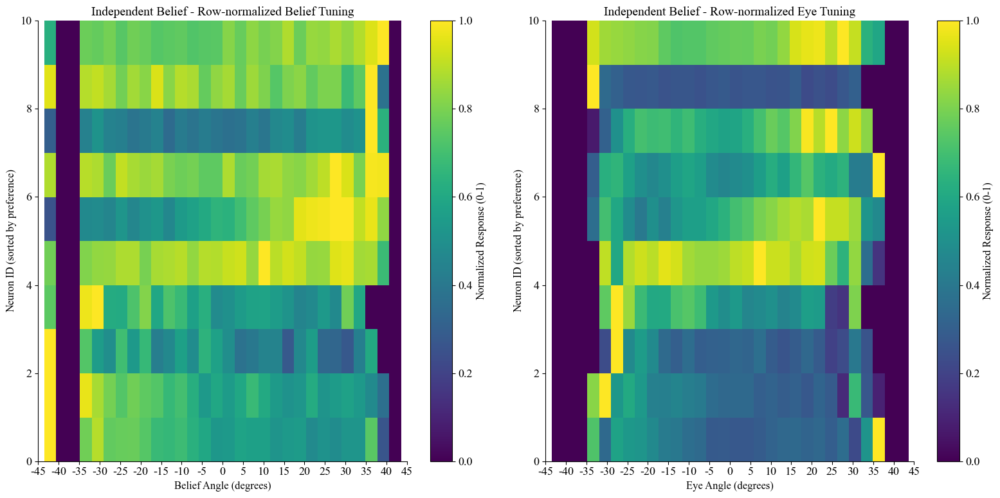


Independent Belief Example Neurons Statistics:
  Neuron 53:
    Independent belief coef: 41.651
    Independent eye coef: 2.220
    Total belief coef: 70.138
    Total eye coef: 22.116

  Neuron 38:
    Independent belief coef: -16.740
    Independent eye coef: -0.371
    Total belief coef: -27.131
    Total eye coef: -8.068

  Neuron 28:
    Independent belief coef: -12.580
    Independent eye coef: -0.798
    Total belief coef: -21.442
    Total eye coef: -6.880

  Neuron 1:
    Independent belief coef: 12.359
    Independent eye coef: 3.219
    Total belief coef: 26.005
    Total eye coef: 10.595

  Neuron 59:
    Independent belief coef: -10.541
    Independent eye coef: -1.997
    Total belief coef: -20.663
    Total eye coef: -7.858


Independent Eye: Selected 10 neurons
  Neuron indices: [18 50 32 11 33 17 15 37 21 20]...


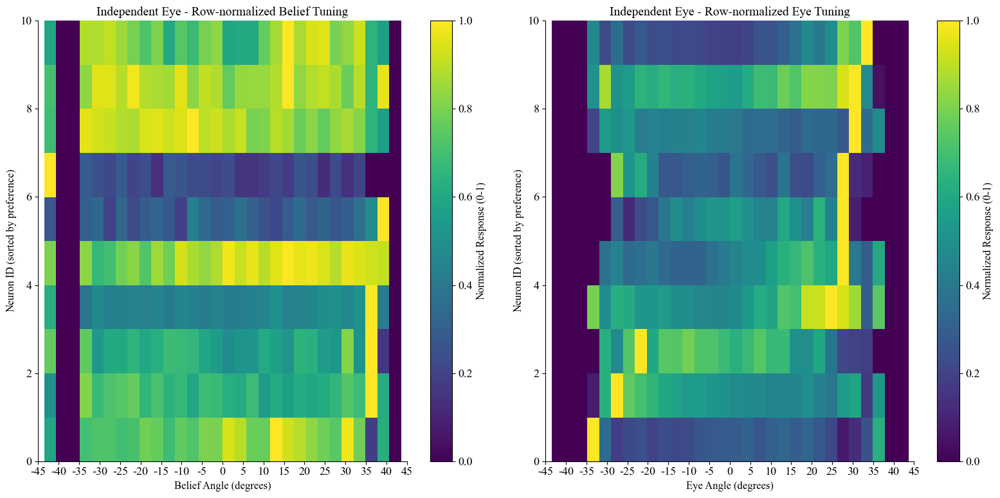


Independent Eye Example Neurons Statistics:
  Neuron 18:
    Independent belief coef: -1.848
    Independent eye coef: 9.880
    Total belief coef: 17.142
    Total eye coef: 14.743

  Neuron 50:
    Independent belief coef: -5.349
    Independent eye coef: 7.110
    Total belief coef: 6.003
    Total eye coef: 8.813

  Neuron 32:
    Independent belief coef: 1.579
    Independent eye coef: 6.020
    Total belief coef: 14.707
    Total eye coef: 10.192

  Neuron 11:
    Independent belief coef: 1.710
    Independent eye coef: -5.675
    Total belief coef: -8.824
    Total eye coef: -8.178

  Neuron 33:
    Independent belief coef: 4.307
    Independent eye coef: -4.862
    Total belief coef: -3.082
    Total eye coef: -5.737

No neurons found for Both Independent

All Neurons: Selected 64 neurons
  Neuron indices: [0 1 2 3 4 5 6 7 8 9]...


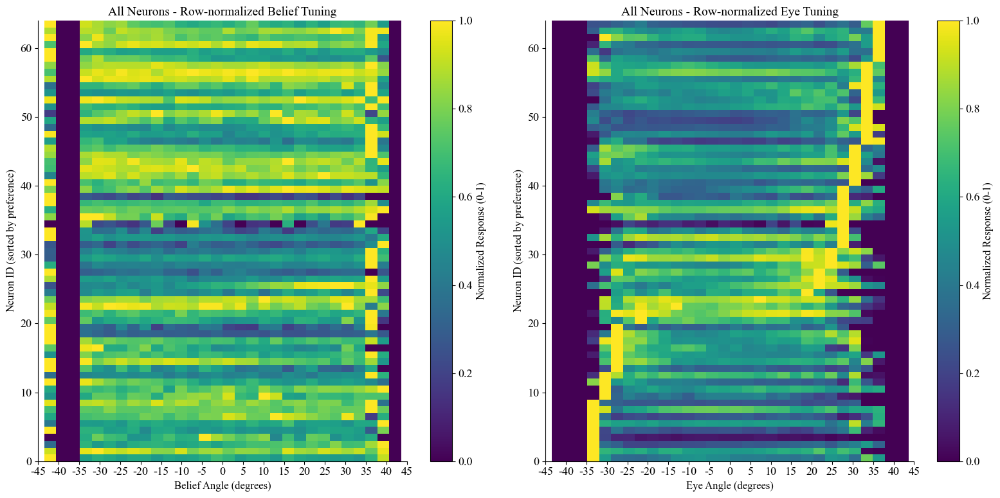

Created individual plots for Session 200

--- Full Neural Encoding Analysis with Heatmaps ---
Neural data shape: (364682, 80)
Belief data shape: (364682,)
Eye data shape: (364682,)
Analyzing 80 neurons

Neuron categorization summary:
  Not significant: 48 neurons (60.0%)
  Indep. eye dominant: 12 neurons (15.0%)
  Indep. belief dominant: 12 neurons (15.0%)
  Both indep. significant: 8 neurons (10.0%)

Independent Belief: Selected 10 neurons
  Neuron indices: [48 36 77 70 51 20 45 46 79 34]...


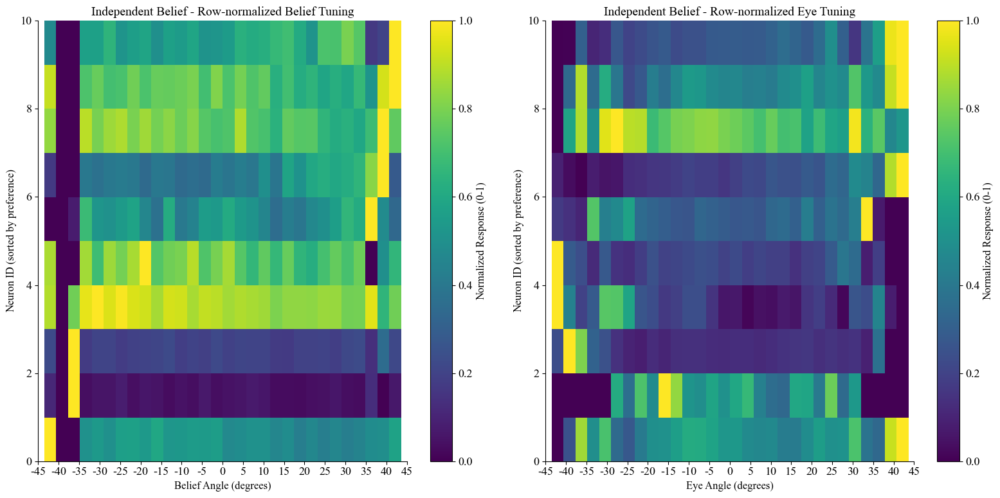


Independent Belief Example Neurons Statistics:
  Neuron 48:
    Independent belief coef: 16.787
    Independent eye coef: 1.714
    Total belief coef: 27.924
    Total eye coef: 9.944

  Neuron 36:
    Independent belief coef: -15.628
    Independent eye coef: -1.673
    Total belief coef: -26.126
    Total eye coef: -9.374

  Neuron 77:
    Independent belief coef: -15.570
    Independent eye coef: 2.699
    Total belief coef: -18.731
    Total eye coef: -2.822

  Neuron 70:
    Independent belief coef: -9.828
    Independent eye coef: 1.265
    Total belief coef: -12.555
    Total eye coef: -2.436

  Neuron 51:
    Independent belief coef: -9.655
    Independent eye coef: 2.569
    Total belief coef: -10.118
    Total eye coef: -0.413


Independent Eye: Selected 10 neurons
  Neuron indices: [ 1 63 43 25 75  3 24 35 30 22]...


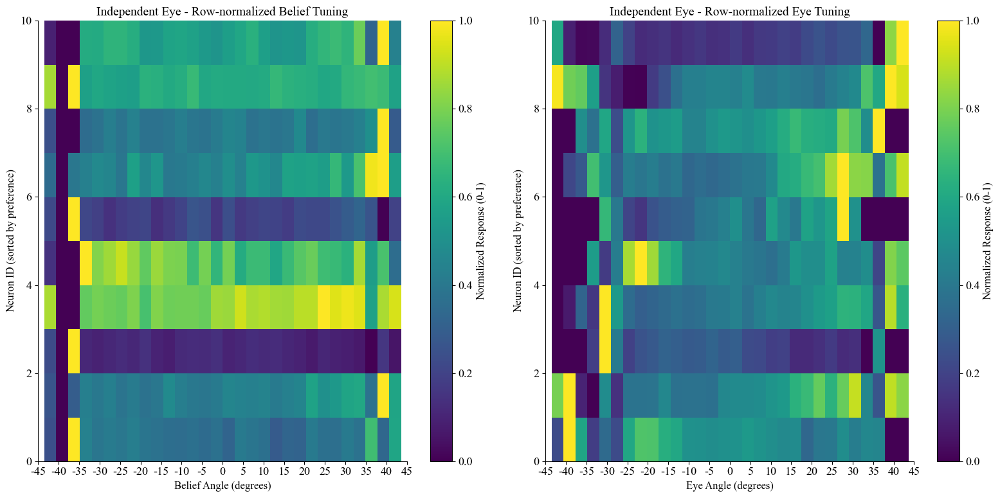


Independent Eye Example Neurons Statistics:
  Neuron 1:
    Independent belief coef: 2.566
    Independent eye coef: -12.963
    Total belief coef: -17.795
    Total eye coef: -18.174

  Neuron 63:
    Independent belief coef: -3.164
    Independent eye coef: 10.370
    Total belief coef: 12.614
    Total eye coef: 14.088

  Neuron 43:
    Independent belief coef: 2.527
    Independent eye coef: 9.064
    Total belief coef: 18.927
    Total eye coef: 14.643

  Neuron 25:
    Independent belief coef: 1.140
    Independent eye coef: -8.177
    Total belief coef: -11.969
    Total eye coef: -11.705

  Neuron 75:
    Independent belief coef: 2.528
    Independent eye coef: -6.647
    Total belief coef: -7.339
    Total eye coef: -8.810

No neurons found for Both Independent

All Neurons: Selected 80 neurons
  Neuron indices: [0 1 2 3 4 5 6 7 8 9]...


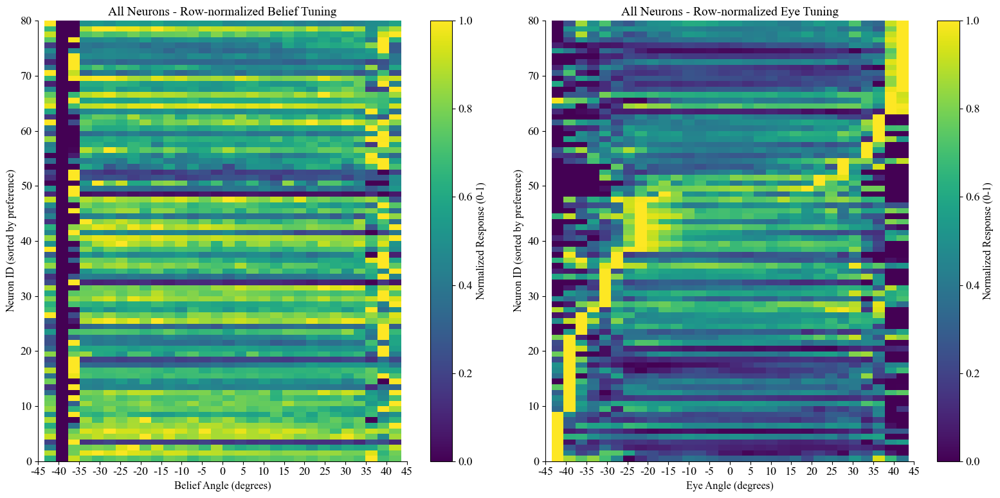

Created individual plots for Session 189

--- Full Neural Encoding Analysis with Heatmaps ---
Neural data shape: (332032, 88)
Belief data shape: (332032,)
Eye data shape: (332032,)
Analyzing 88 neurons

Neuron categorization summary:
  Not significant: 53 neurons (60.2%)
  Indep. belief dominant: 13 neurons (14.8%)
  Indep. eye dominant: 13 neurons (14.8%)
  Both indep. significant: 9 neurons (10.2%)

Independent Belief: Selected 10 neurons
  Neuron indices: [72 86 70 87 81 26 46 10 63 75]...


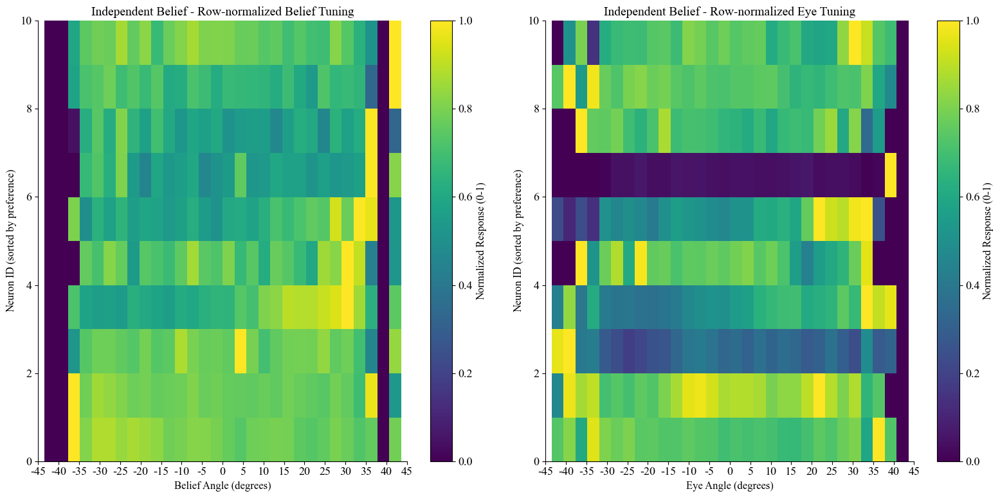


Independent Belief Example Neurons Statistics:
  Neuron 72:
    Independent belief coef: 21.961
    Independent eye coef: 4.358
    Total belief coef: 43.487
    Total eye coef: 18.985

  Neuron 86:
    Independent belief coef: -14.089
    Independent eye coef: 3.854
    Total belief coef: -15.711
    Total eye coef: -1.430

  Neuron 70:
    Independent belief coef: -12.007
    Independent eye coef: 3.059
    Total belief coef: -13.804
    Total eye coef: -1.585

  Neuron 87:
    Independent belief coef: -11.907
    Independent eye coef: 1.154
    Total belief coef: -17.133
    Total eye coef: -4.609

  Neuron 81:
    Independent belief coef: 8.484
    Independent eye coef: -4.401
    Total belief coef: 5.647
    Total eye coef: -2.502


Independent Eye: Selected 10 neurons
  Neuron indices: [84 23 52 65 62 74 41 59 53 22]...


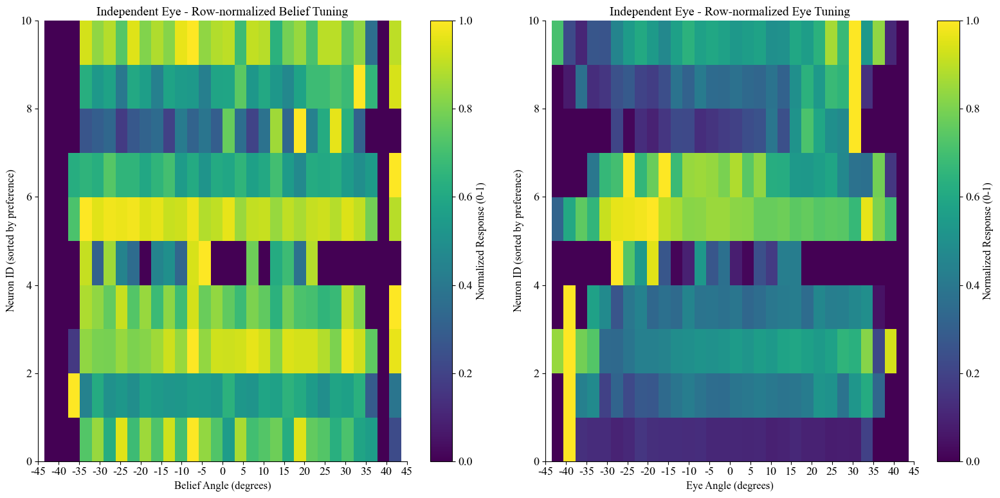


Independent Eye Example Neurons Statistics:
  Neuron 84:
    Independent belief coef: 4.695
    Independent eye coef: -30.922
    Total belief coef: -49.087
    Total eye coef: -47.434

  Neuron 23:
    Independent belief coef: 4.043
    Independent eye coef: 28.139
    Total belief coef: 58.124
    Total eye coef: 47.697

  Neuron 52:
    Independent belief coef: 5.836
    Independent eye coef: -10.008
    Total belief coef: -8.910
    Total eye coef: -13.005

  Neuron 65:
    Independent belief coef: -3.510
    Independent eye coef: 9.898
    Total belief coef: 12.468
    Total eye coef: 14.092

  Neuron 62:
    Independent belief coef: 2.371
    Independent eye coef: -9.616
    Total belief coef: -13.793
    Total eye coef: -14.256

No neurons found for Both Independent

All Neurons: Selected 88 neurons
  Neuron indices: [0 1 2 3 4 5 6 7 8 9]...


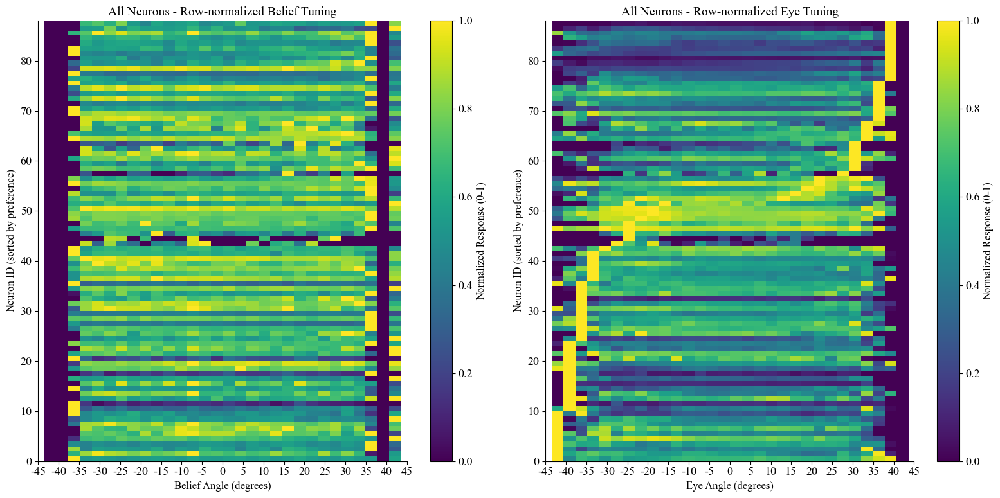

Created individual plots for Session 188

--- Full Neural Encoding Analysis with Heatmaps ---
Neural data shape: (426519, 64)
Belief data shape: (426519,)
Eye data shape: (426519,)
Analyzing 64 neurons

Neuron categorization summary:
  Not significant: 40 neurons (62.5%)
  Both indep. significant: 8 neurons (12.5%)
  Indep. belief dominant: 8 neurons (12.5%)
  Indep. eye dominant: 8 neurons (12.5%)

Independent Belief: Selected 8 neurons
  Neuron indices: [45 37  4 62 54  2 27 36]...


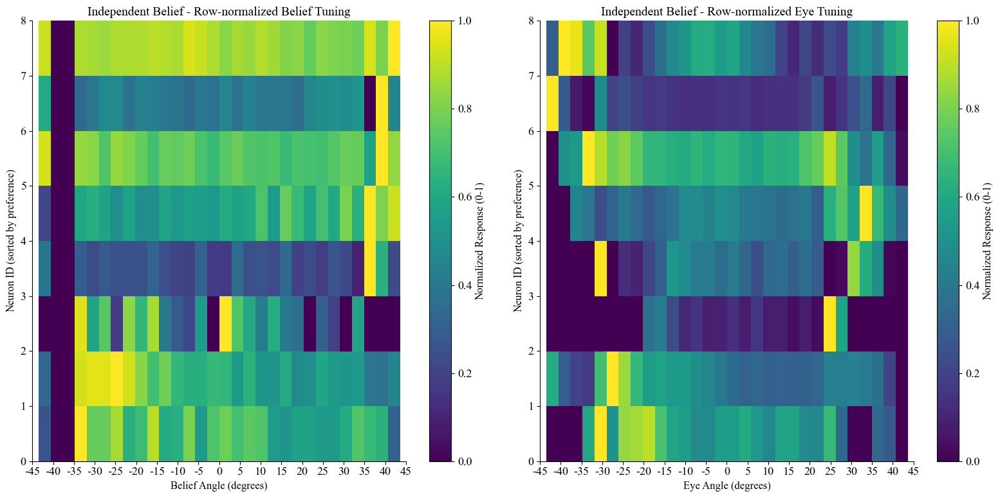


Independent Belief Example Neurons Statistics:
  Neuron 45:
    Independent belief coef: -38.504
    Independent eye coef: -5.008
    Total belief coef: -62.023
    Total eye coef: -20.053

  Neuron 37:
    Independent belief coef: -17.658
    Independent eye coef: -4.752
    Total belief coef: -32.468
    Total eye coef: -12.628

  Neuron 4:
    Independent belief coef: -12.733
    Independent eye coef: -0.507
    Total belief coef: -18.626
    Total eye coef: -5.025

  Neuron 62:
    Independent belief coef: -12.709
    Independent eye coef: -1.146
    Total belief coef: -19.641
    Total eye coef: -5.910

  Neuron 54:
    Independent belief coef: 10.931
    Independent eye coef: -4.006
    Total belief coef: 8.712
    Total eye coef: -1.893


Independent Eye: Selected 8 neurons
  Neuron indices: [11 57 60 55 63 35 21 16]...


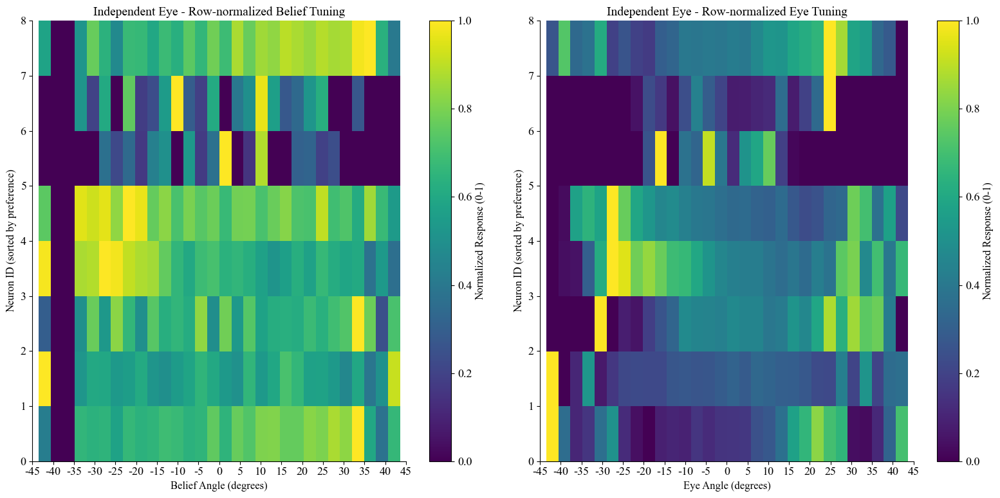


Independent Eye Example Neurons Statistics:
  Neuron 11:
    Independent belief coef: -3.584
    Independent eye coef: -11.410
    Total belief coef: -23.711
    Total eye coef: -17.161

  Neuron 57:
    Independent belief coef: -7.040
    Independent eye coef: -6.722
    Total belief coef: -20.857
    Total eye coef: -11.781

  Neuron 60:
    Independent belief coef: 4.121
    Independent eye coef: 6.686
    Total belief coef: 16.718
    Total eye coef: 10.741

  Neuron 55:
    Independent belief coef: -8.165
    Independent eye coef: 6.449
    Total belief coef: -0.841
    Total eye coef: 6.245

  Neuron 63:
    Independent belief coef: -7.191
    Independent eye coef: 5.621
    Total belief coef: -0.835
    Total eye coef: 5.419

No neurons found for Both Independent

All Neurons: Selected 64 neurons
  Neuron indices: [0 1 2 3 4 5 6 7 8 9]...


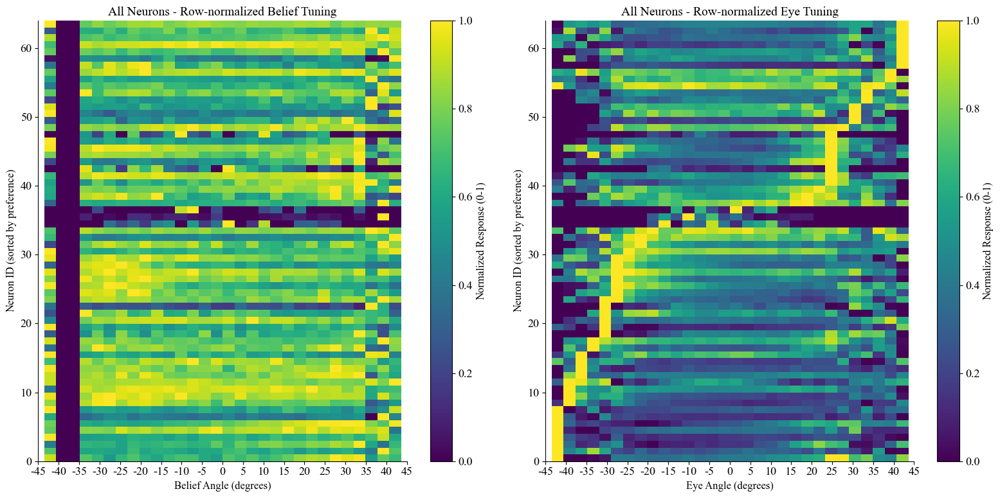

Created individual plots for Session 215

--- Full Neural Encoding Analysis with Heatmaps ---
Neural data shape: (405329, 79)
Belief data shape: (405329,)
Eye data shape: (405329,)
Analyzing 79 neurons

Neuron categorization summary:
  Not significant: 48 neurons (60.8%)
  Indep. belief dominant: 11 neurons (13.9%)
  Indep. eye dominant: 11 neurons (13.9%)
  Both indep. significant: 9 neurons (11.4%)

Independent Belief: Selected 10 neurons
  Neuron indices: [ 1 77 42 40 69 54 74 64 17 25]...


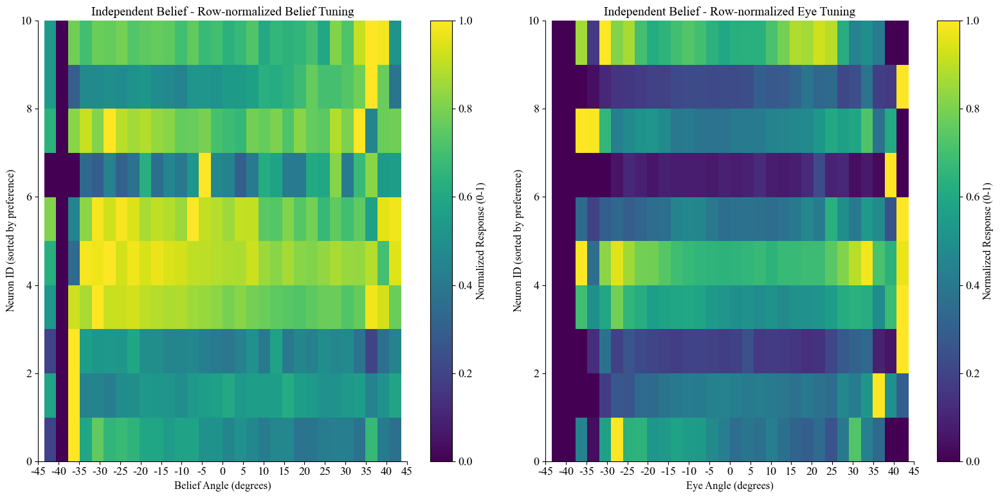


Independent Belief Example Neurons Statistics:
  Neuron 1:
    Independent belief coef: -17.495
    Independent eye coef: -2.102
    Total belief coef: -28.041
    Total eye coef: -9.580

  Neuron 77:
    Independent belief coef: 14.242
    Independent eye coef: 3.842
    Total belief coef: 26.150
    Total eye coef: 10.816

  Neuron 42:
    Independent belief coef: 14.050
    Independent eye coef: 2.026
    Total belief coef: 23.048
    Total eye coef: 8.172

  Neuron 40:
    Independent belief coef: -13.728
    Independent eye coef: 3.211
    Total belief coef: -14.428
    Total eye coef: -0.636

  Neuron 69:
    Independent belief coef: -12.031
    Independent eye coef: 0.524
    Total belief coef: -16.215
    Total eye coef: -3.800


Independent Eye: Selected 10 neurons
  Neuron indices: [43 72  9 78 39 75 59 44  3 10]...


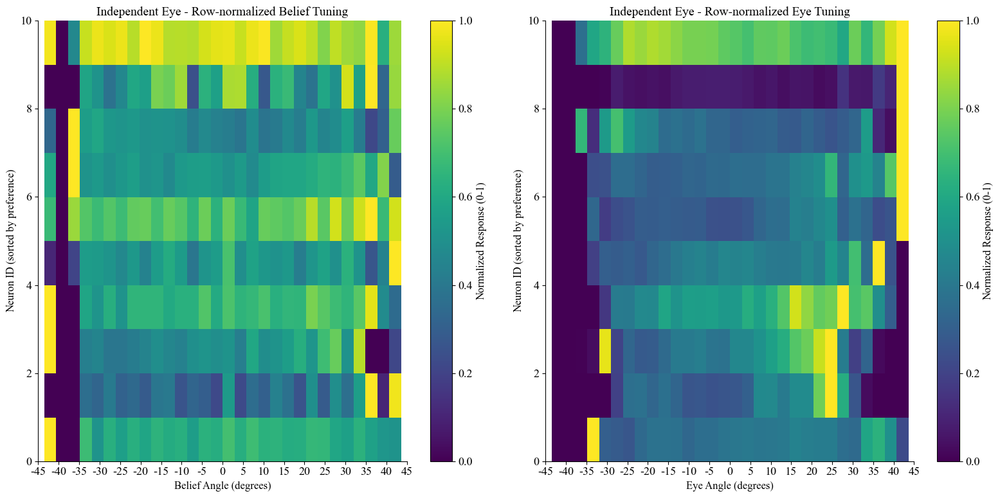


Independent Eye Example Neurons Statistics:
  Neuron 43:
    Independent belief coef: 0.535
    Independent eye coef: 13.354
    Total belief coef: 21.570
    Total eye coef: 19.106

  Neuron 72:
    Independent belief coef: 7.502
    Independent eye coef: 8.790
    Total belief coef: 24.320
    Total eye coef: 15.275

  Neuron 9:
    Independent belief coef: -3.302
    Independent eye coef: 6.906
    Total belief coef: 6.088
    Total eye coef: 8.529

  Neuron 78:
    Independent belief coef: 2.171
    Independent eye coef: 6.761
    Total belief coef: 13.611
    Total eye coef: 10.390

  Neuron 39:
    Independent belief coef: -0.036
    Independent eye coef: 6.352
    Total belief coef: 9.848
    Total eye coef: 8.978

No neurons found for Both Independent

All Neurons: Selected 79 neurons
  Neuron indices: [0 1 2 3 4 5 6 7 8 9]...


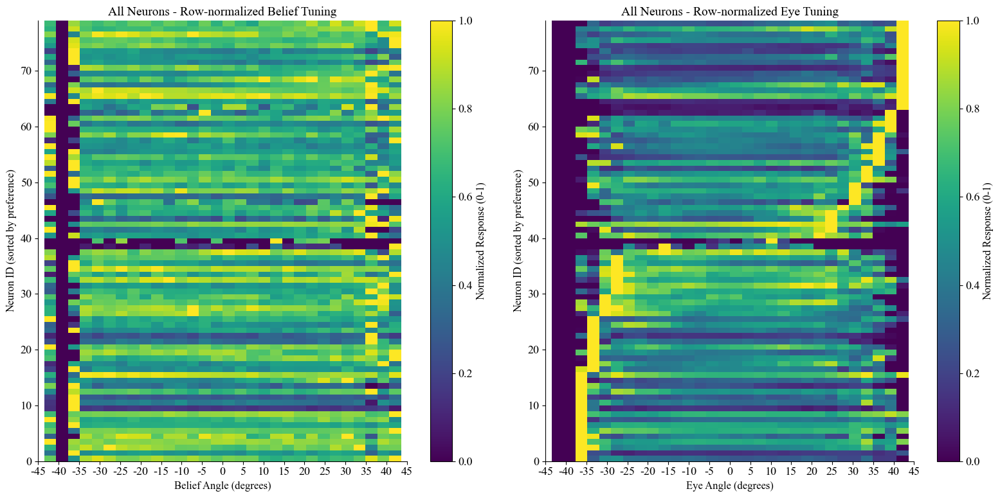

Created individual plots for Session 203

--- Full Neural Encoding Analysis with Heatmaps ---
Neural data shape: (318906, 68)
Belief data shape: (318906,)
Eye data shape: (318906,)
Analyzing 68 neurons

Neuron categorization summary:
  Not significant: 39 neurons (57.4%)
  Indep. belief dominant: 12 neurons (17.6%)
  Indep. eye dominant: 12 neurons (17.6%)
  Both indep. significant: 5 neurons (7.4%)

Independent Belief: Selected 10 neurons
  Neuron indices: [ 1  2  9 59 56 45 36 51 31 30]...


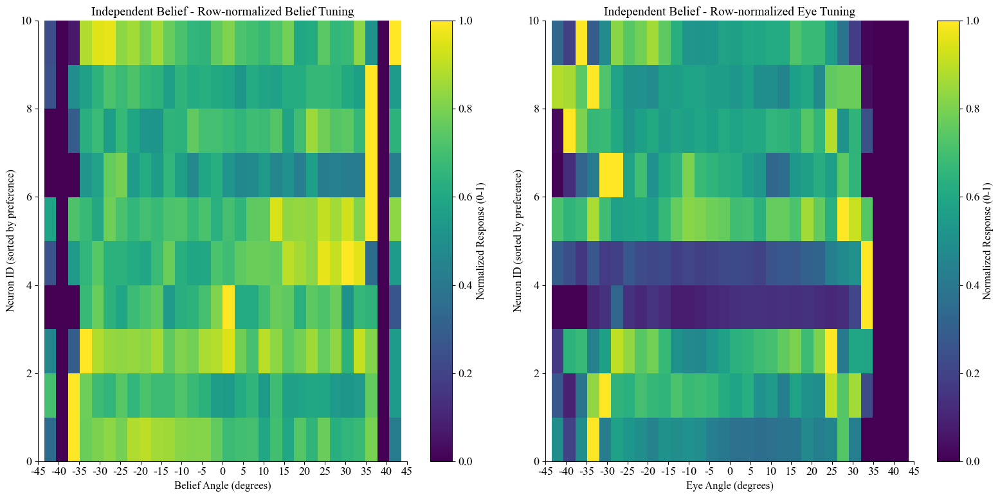


Independent Belief Example Neurons Statistics:
  Neuron 1:
    Independent belief coef: 24.071
    Independent eye coef: -2.792
    Total belief coef: 30.366
    Total eye coef: 4.941

  Neuron 2:
    Independent belief coef: 18.104
    Independent eye coef: -1.239
    Total belief coef: 24.420
    Total eye coef: 4.983

  Neuron 9:
    Independent belief coef: -15.021
    Independent eye coef: 0.470
    Total belief coef: -21.314
    Total eye coef: -4.961

  Neuron 59:
    Independent belief coef: -13.116
    Independent eye coef: -0.362
    Total belief coef: -20.059
    Total eye coef: -5.473

  Neuron 56:
    Independent belief coef: -10.953
    Independent eye coef: -1.709
    Total belief coef: -19.387
    Total eye coef: -6.649


Independent Eye: Selected 10 neurons
  Neuron indices: [15 54  4 44 20 32 10  6 61 57]...


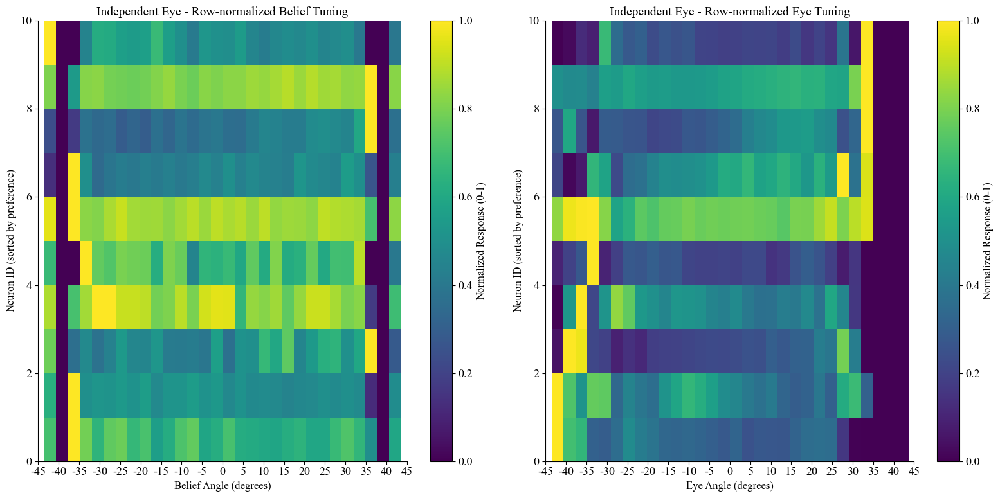


Independent Eye Example Neurons Statistics:
  Neuron 15:
    Independent belief coef: 2.079
    Independent eye coef: 8.910
    Total belief coef: 19.773
    Total eye coef: 13.948

  Neuron 54:
    Independent belief coef: -1.151
    Independent eye coef: 7.676
    Total belief coef: 12.687
    Total eye coef: 10.908

  Neuron 4:
    Independent belief coef: 4.607
    Independent eye coef: 7.101
    Total belief coef: 20.118
    Total eye coef: 12.227

  Neuron 44:
    Independent belief coef: 2.986
    Independent eye coef: 6.888
    Total belief coef: 17.323
    Total eye coef: 11.302

  Neuron 20:
    Independent belief coef: 2.693
    Independent eye coef: -6.234
    Total belief coef: -7.706
    Total eye coef: -8.197

No neurons found for Both Independent

All Neurons: Selected 68 neurons
  Neuron indices: [0 1 2 3 4 5 6 7 8 9]...


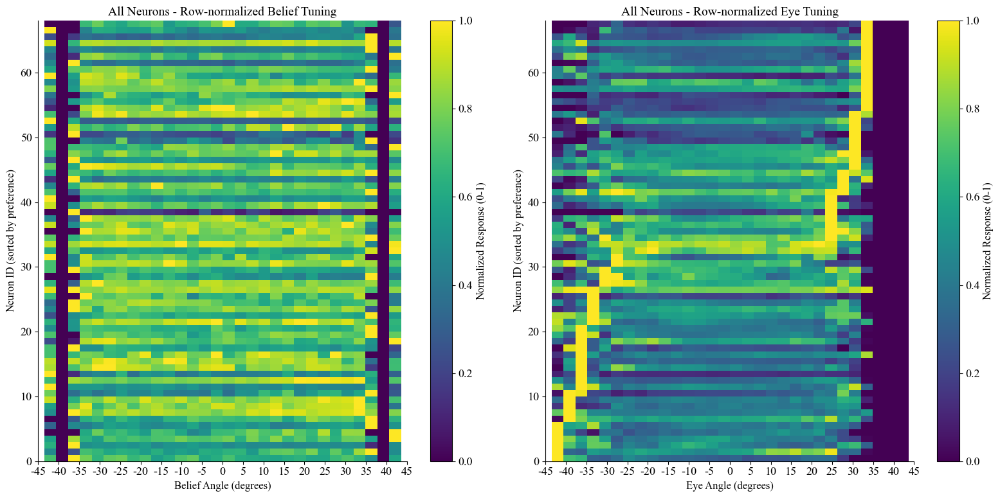

Created individual plots for Session 217

--- Full Neural Encoding Analysis with Heatmaps ---
Neural data shape: (361876, 68)
Belief data shape: (361876,)
Eye data shape: (361876,)
Analyzing 68 neurons

Neuron categorization summary:
  Not significant: 42 neurons (61.8%)
  Indep. eye dominant: 9 neurons (13.2%)
  Indep. belief dominant: 9 neurons (13.2%)
  Both indep. significant: 8 neurons (11.8%)

Independent Belief: Selected 9 neurons
  Neuron indices: [17 48 57  3 13 11  8 56 67]...


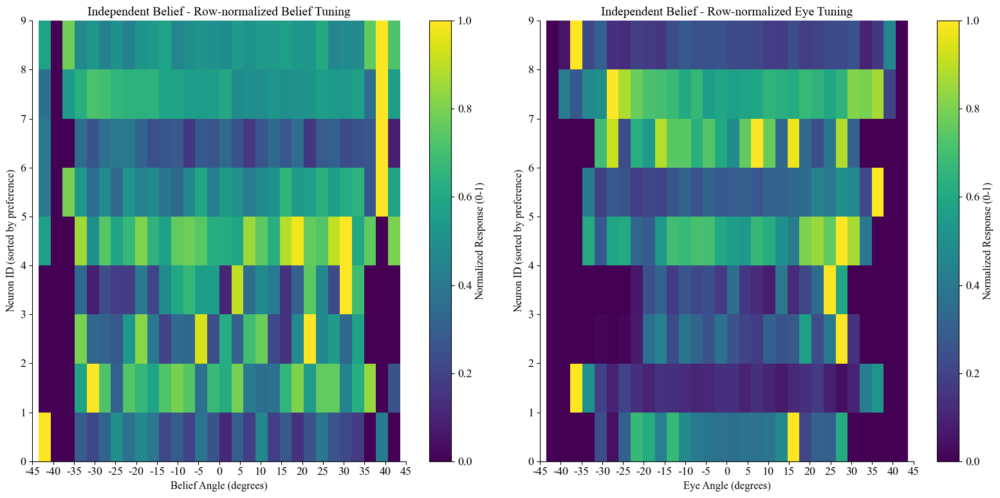


Independent Belief Example Neurons Statistics:
  Neuron 17:
    Independent belief coef: 39.133
    Independent eye coef: -1.887
    Total belief coef: 49.996
    Total eye coef: 10.158

  Neuron 48:
    Independent belief coef: 17.561
    Independent eye coef: 2.377
    Total belief coef: 27.080
    Total eye coef: 8.901

  Neuron 57:
    Independent belief coef: -16.023
    Independent eye coef: 1.986
    Total belief coef: -18.723
    Total eye coef: -2.525

  Neuron 3:
    Independent belief coef: -14.665
    Independent eye coef: 0.296
    Total belief coef: -19.327
    Total eye coef: -4.361

  Neuron 13:
    Independent belief coef: 14.118
    Independent eye coef: -2.036
    Total belief coef: 16.084
    Total eye coef: 1.839


Independent Eye: Selected 9 neurons
  Neuron indices: [ 7 16 19 32 63 14 65 49  2]...


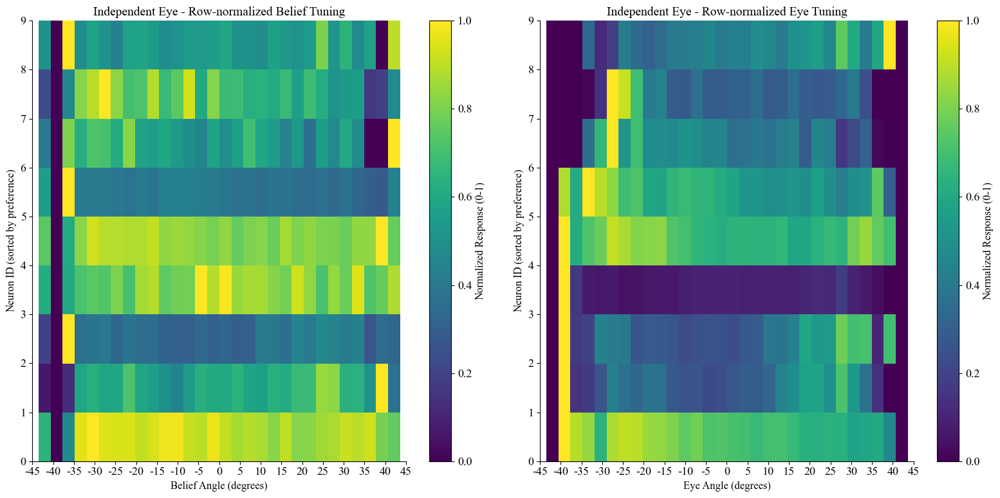


Independent Eye Example Neurons Statistics:
  Neuron 7:
    Independent belief coef: -1.142
    Independent eye coef: -7.774
    Total belief coef: -12.737
    Total eye coef: -10.843

  Neuron 16:
    Independent belief coef: -2.405
    Independent eye coef: 7.467
    Total belief coef: 7.518
    Total eye coef: 9.278

  Neuron 19:
    Independent belief coef: -3.664
    Independent eye coef: 6.027
    Total belief coef: 3.747
    Total eye coef: 6.929

  Neuron 32:
    Independent belief coef: -0.010
    Independent eye coef: -5.567
    Total belief coef: -8.032
    Total eye coef: -7.502

  Neuron 63:
    Independent belief coef: -2.303
    Independent eye coef: 5.146
    Total belief coef: 4.310
    Total eye coef: 6.184

No neurons found for Both Independent

All Neurons: Selected 68 neurons
  Neuron indices: [0 1 2 3 4 5 6 7 8 9]...


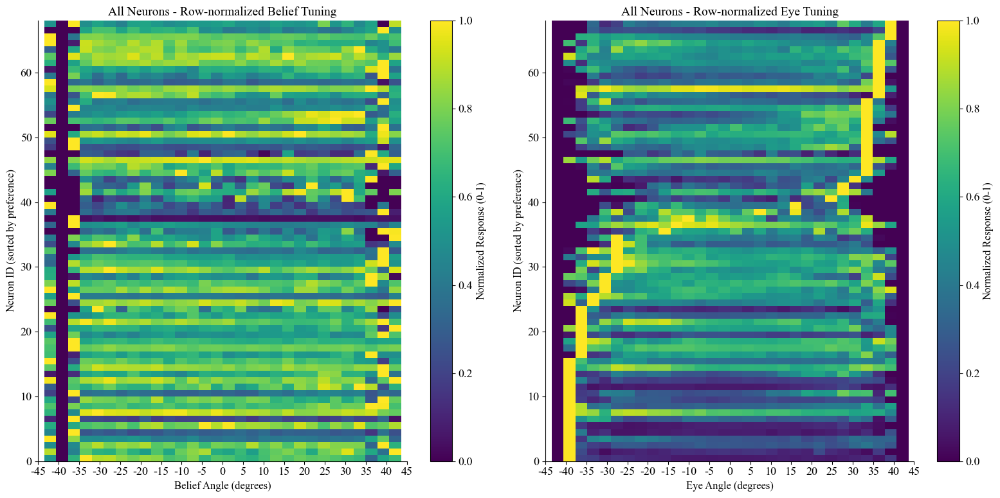

Created individual plots for Session 175

--- Full Neural Encoding Analysis with Heatmaps ---
Neural data shape: (387890, 80)
Belief data shape: (387890,)
Eye data shape: (387890,)
Analyzing 80 neurons

Neuron categorization summary:
  Not significant: 49 neurons (61.3%)
  Indep. eye dominant: 11 neurons (13.8%)
  Indep. belief dominant: 11 neurons (13.8%)
  Both indep. significant: 9 neurons (11.2%)

Independent Belief: Selected 10 neurons
  Neuron indices: [38 79 60 63 36 64 21 23 40  9]...


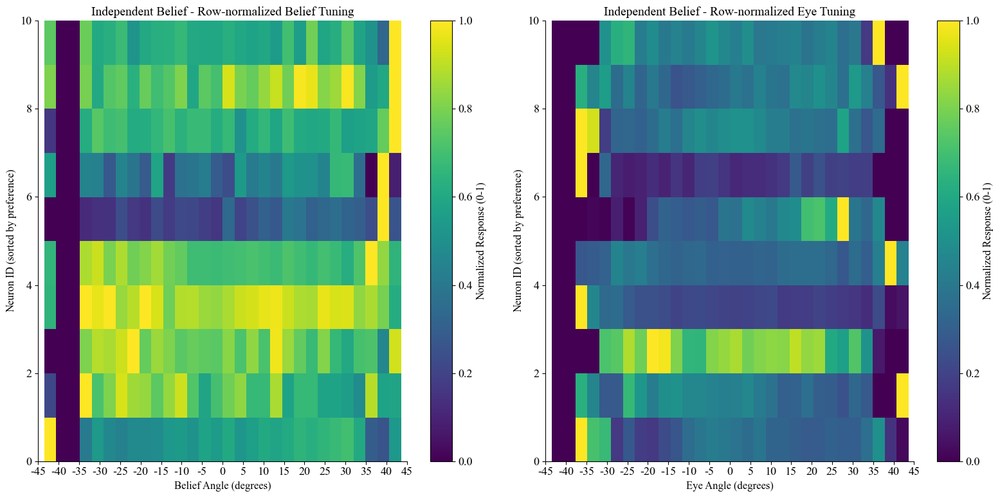


Independent Belief Example Neurons Statistics:
  Neuron 38:
    Independent belief coef: 27.671
    Independent eye coef: 3.571
    Total belief coef: 47.410
    Total eye coef: 17.260

  Neuron 79:
    Independent belief coef: -18.826
    Independent eye coef: 2.405
    Total belief coef: -23.999
    Total eye coef: -4.524

  Neuron 60:
    Independent belief coef: 15.532
    Independent eye coef: -2.215
    Total belief coef: 19.407
    Total eye coef: 3.388

  Neuron 63:
    Independent belief coef: 12.423
    Independent eye coef: 0.507
    Total belief coef: 19.414
    Total eye coef: 6.113

  Neuron 36:
    Independent belief coef: -11.325
    Independent eye coef: 1.896
    Total belief coef: -13.671
    Total eye coef: -2.052


Independent Eye: Selected 10 neurons
  Neuron indices: [ 2 52 74 16 25 13 55 10 76 68]...


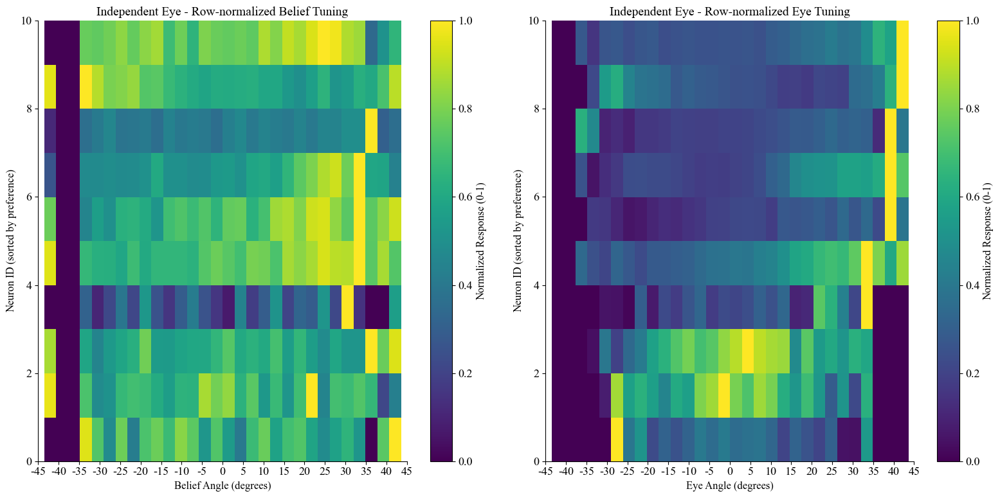


Independent Eye Example Neurons Statistics:
  Neuron 2:
    Independent belief coef: 4.842
    Independent eye coef: 15.457
    Total belief coef: 33.618
    Total eye coef: 25.161

  Neuron 52:
    Independent belief coef: 3.845
    Independent eye coef: 9.355
    Total belief coef: 21.713
    Total eye coef: 15.625

  Neuron 74:
    Independent belief coef: 4.342
    Independent eye coef: -8.762
    Total belief coef: -8.478
    Total eye coef: -11.210

  Neuron 16:
    Independent belief coef: 2.914
    Independent eye coef: 8.159
    Total belief coef: 18.281
    Total eye coef: 13.437

  Neuron 25:
    Independent belief coef: -1.102
    Independent eye coef: 7.690
    Total belief coef: 11.485
    Total eye coef: 11.006

No neurons found for Both Independent

All Neurons: Selected 80 neurons
  Neuron indices: [0 1 2 3 4 5 6 7 8 9]...


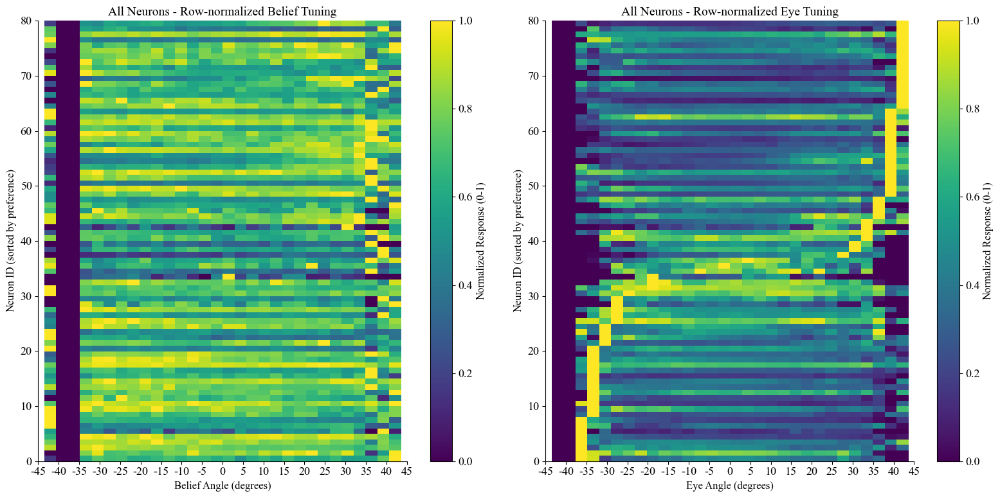

Created individual plots for Session 174

--- Full Neural Encoding Analysis with Heatmaps ---
Neural data shape: (322903, 58)
Belief data shape: (322903,)
Eye data shape: (322903,)
Analyzing 58 neurons


KeyboardInterrupt: 

In [114]:
def analyze_and_visualize_across_sessions(df, n_bins=30, n_examples=10):
    """
    Perform neural encoding analysis across multiple sessions and create combined heatmaps.
    Handles sessions with different numbers of neurons.
    
    Parameters:
    -----------
    df : pandas DataFrame
        DataFrame containing all sessions with neural, uncertainty, time data and a 'session' column
    n_bins : int
        Number of bins for degree ranges
    n_examples : int
        Number of neurons to show per category
    
    Returns:
    --------
    all_session_neuron_dfs : dict
        Dictionary with session IDs as keys and neuron categorization DataFrames as values
    """
    import matplotlib.pyplot as plt
    import numpy as np
    import pandas as pd
    from sklearn.linear_model import LinearRegression
    
    print("\n--- Multi-Session Neural Encoding Analysis ---")
    
    # Get unique sessions
    unique_sessions = df['session'].unique()
    n_sessions = len(unique_sessions)
    print(f"Found {n_sessions} unique sessions")
    
    # Dictionary to store neuron DataFrames for each session
    all_session_neuron_dfs = {}
    
    # Dictionary to store categorized neurons data for final combined plots
    uncertainty_dominant_neurons = {'uncertainty_tuning': [], 'time_tuning': [], 'neuron_ids': []}
    time_dominant_neurons = {'uncertainty_tuning': [], 'time_tuning': [], 'neuron_ids': []}
    both_significant_neurons = {'uncertainty_tuning': [], 'time_tuning': [], 'neuron_ids': []}
    
    # Process each session separately
    for ith_sess in range(len(unique_sessions)):
        sess_id = unique_sessions[ith_sess]
        sessdf = df[df.session == sess_id]
        
        print(f"\n--- Processing Session {ith_sess+1}/{n_sessions} (ID: {sess_id}) ---")
        
        # Get time-based dataframe for this session
        timedf = gettimedf(sessdf)  # Assuming gettimedf is defined elsewhere
        
        # Extract data for this session
        neural_data = np.vstack(timedf['PPC'].to_numpy())
        uncertainty_data = np.array([u[0,0] for u in timedf['uncertainty'].to_numpy()])
        time_data = timedf['timer'].to_numpy()
        
        print(f"Session data: {neural_data.shape[0]} timepoints, {neural_data.shape[1]} neurons")
        
        # Ensure time_data is 2D for sklearn
        if len(time_data.shape) == 1:
            time_data_2d = time_data.reshape(-1, 1)
        else:
            time_data_2d = time_data
        
        # Get number of neurons for this session
        n_neurons = neural_data.shape[1]
        
        # Calculate coefficients for each neuron in this session
        # Calculate total uncertainty coefficients
        model_total_uncertainty = LinearRegression().fit(neural_data, uncertainty_data)
        total_uncertainty_coefs = model_total_uncertainty.coef_
        
        # Calculate total time coefficients
        model_total_time = LinearRegression().fit(neural_data, time_data_2d)
        total_time_coefs = model_total_time.coef_[0]  # Flatten
        
        # Calculate independent uncertainty coefficients
        model_time = LinearRegression().fit(time_data_2d, neural_data)
        neural_residuals_after_time = neural_data - model_time.predict(time_data_2d)
        
        model_indep_uncertainty = LinearRegression().fit(neural_residuals_after_time, uncertainty_data)
        indep_uncertainty_coefs = model_indep_uncertainty.coef_
        
        # Calculate independent time coefficients
        model_uncertainty = LinearRegression().fit(uncertainty_data.reshape(-1, 1), neural_data)
        neural_residuals_after_uncertainty = neural_data - model_uncertainty.predict(uncertainty_data.reshape(-1, 1))
        
        model_indep_time = LinearRegression().fit(neural_residuals_after_uncertainty, time_data_2d)
        indep_time_coefs = model_indep_time.coef_[0]  # Flatten
        
        # Create neuron DataFrame for this session
        session_neuron_df = pd.DataFrame({
            'neuron_idx': np.arange(n_neurons),
            'session_id': sess_id,
            'session_index': ith_sess,
            'total_uncertainty_coef': total_uncertainty_coefs,
            'total_time_coef': total_time_coefs,
            'indep_uncertainty_coef': indep_uncertainty_coefs,
            'indep_time_coef': indep_time_coefs,
            'total_uncertainty_abs': np.abs(total_uncertainty_coefs),
            'total_time_abs': np.abs(total_time_coefs),
            'indep_uncertainty_abs': np.abs(indep_uncertainty_coefs),
            'indep_time_abs': np.abs(indep_time_coefs)
        })
        
        # Define thresholds and categorize neurons for this session
        threshold_pct = 75  # Use top 25% as threshold
        threshold_indep_uncertainty = np.percentile(session_neuron_df['indep_uncertainty_abs'], threshold_pct)
        threshold_indep_time = np.percentile(session_neuron_df['indep_time_abs'], threshold_pct)
        
        # Create categorizations
        session_neuron_df['indep_category'] = 'Not significant'
        
        # Independent uncertainty dominant
        indep_uncertainty_dominant_mask = (session_neuron_df['indep_uncertainty_abs'] >= threshold_indep_uncertainty) & \
                                    (session_neuron_df['indep_time_abs'] < threshold_indep_time)
        session_neuron_df.loc[indep_uncertainty_dominant_mask, 'indep_category'] = 'Indep. uncertainty dominant'
        
        # Independent time dominant
        indep_time_dominant_mask = (session_neuron_df['indep_uncertainty_abs'] < threshold_indep_uncertainty) & \
                                  (session_neuron_df['indep_time_abs'] >= threshold_indep_time)
        session_neuron_df.loc[indep_time_dominant_mask, 'indep_category'] = 'Indep. time dominant'
        
        # Both independent
        indep_both_mask = (session_neuron_df['indep_uncertainty_abs'] >= threshold_indep_uncertainty) & \
                          (session_neuron_df['indep_time_abs'] >= threshold_indep_time)
        session_neuron_df.loc[indep_both_mask, 'indep_category'] = 'Both indep. significant'
        
        # Print summary for this session
        print(f"\nSession {sess_id} neuron categorization summary:")
        for category, count in session_neuron_df['indep_category'].value_counts().items():
            print(f"  {category}: {count} neurons ({count/n_neurons*100:.1f}%)")
        
        # Store the neuron DataFrame for this session
        all_session_neuron_dfs[sess_id] = session_neuron_df
        
        # Calculate tuning curves for each neuron category in this session
        
        # Convert to degrees (if not already)
        if np.max(np.abs(uncertainty_data)) < 10:  # Likely in radians
            uncertainty_degrees = np.degrees(uncertainty_data)
        else:
            uncertainty_degrees = uncertainty_data
            
        if np.max(np.abs(time_data)) < 10:  # Likely in radians
            time_degrees = np.degrees(time_data)
        else:
            time_degrees = time_data
        
        # Create degree bins
        degree_edges = np.linspace(-45, 45, n_bins + 1)
        bin_centers = (degree_edges[:-1] + degree_edges[1:]) / 2
        
        def calculate_tuning_curves_for_neurons(neuron_indices, neural_data, uncertainty_degrees, time_degrees):
            """Helper function to calculate tuning curves for a set of neurons"""
            uncertainty_tuning = np.zeros((len(neuron_indices), n_bins))
            time_tuning = np.zeros((len(neuron_indices), n_bins))
            
            for i, neuron_idx in enumerate(neuron_indices):
                neuron_responses = neural_data[:, neuron_idx]
                
                # Bin neural responses by uncertainty angle
                uncertainty_binned = np.digitize(uncertainty_degrees, degree_edges) - 1
                uncertainty_binned = np.clip(uncertainty_binned, 0, n_bins - 1)
                
                for j in range(n_bins):
                    mask = uncertainty_binned == j
                    if np.sum(mask) > 0:
                        uncertainty_tuning[i, j] = np.mean(neuron_responses[mask])
                
                # Bin neural responses by time angle
                time_binned = np.digitize(time_degrees, degree_edges) - 1
                time_binned = np.clip(time_binned, 0, n_bins - 1)
                
                for j in range(n_bins):
                    mask = time_binned == j
                    if np.sum(mask) > 0:
                        time_tuning[i, j] = np.mean(neuron_responses[mask])
            
            return uncertainty_tuning, time_tuning
        
        # Get neurons for each category
        uncertainty_neurons = session_neuron_df[session_neuron_df['indep_category'] == 'Indep. uncertainty dominant']
        time_neurons = session_neuron_df[session_neuron_df['indep_category'] == 'Indep. time dominant']
        both_neurons = session_neuron_df[session_neuron_df['indep_category'] == 'Both indep. significant']
        
        # Take top examples based on coefficient magnitude
        n_uncertainty_to_take = min(n_examples, len(uncertainty_neurons))
        n_time_to_take = min(n_examples, len(time_neurons))
        n_both_to_take = min(n_examples, len(both_neurons))
        
        if n_uncertainty_to_take > 0:
            uncertainty_top_neurons = uncertainty_neurons.sort_values('indep_uncertainty_abs', ascending=False).iloc[:n_uncertainty_to_take]
            b_tuning, e_tuning = calculate_tuning_curves_for_neurons(
                uncertainty_top_neurons['neuron_idx'].values, neural_data, uncertainty_degrees, time_degrees)
            
            # Store for combined plots
            for i, idx in enumerate(uncertainty_top_neurons['neuron_idx'].values):
                uncertainty_dominant_neurons['uncertainty_tuning'].append(b_tuning[i])
                uncertainty_dominant_neurons['time_tuning'].append(e_tuning[i])
                uncertainty_dominant_neurons['neuron_ids'].append(f"S{ith_sess}N{idx}")
        
        if n_time_to_take > 0:
            time_top_neurons = time_neurons.sort_values('indep_time_abs', ascending=False).iloc[:n_time_to_take]
            b_tuning, e_tuning = calculate_tuning_curves_for_neurons(
                time_top_neurons['neuron_idx'].values, neural_data, uncertainty_degrees, time_degrees)
            
            # Store for combined plots
            for i, idx in enumerate(time_top_neurons['neuron_idx'].values):
                time_dominant_neurons['uncertainty_tuning'].append(b_tuning[i])
                time_dominant_neurons['time_tuning'].append(e_tuning[i])
                time_dominant_neurons['neuron_ids'].append(f"S{ith_sess}N{idx}")
        
        if n_both_to_take > 0:
            # Add sum of coefficients for sorting
            both_neurons['sum_coef'] = both_neurons['indep_uncertainty_abs'] + both_neurons['indep_time_abs']
            both_top_neurons = both_neurons.sort_values('sum_coef', ascending=False).iloc[:n_both_to_take]
            b_tuning, e_tuning = calculate_tuning_curves_for_neurons(
                both_top_neurons['neuron_idx'].values, neural_data, uncertainty_degrees, time_degrees)
            
            # Store for combined plots
            for i, idx in enumerate(both_top_neurons['neuron_idx'].values):
                both_significant_neurons['uncertainty_tuning'].append(b_tuning[i])
                both_significant_neurons['time_tuning'].append(e_tuning[i])
                both_significant_neurons['neuron_ids'].append(f"S{ith_sess}N{idx}")
    
    # Print overall summary across all sessions
    total_neurons = sum(len(df) for df in all_session_neuron_dfs.values())
    print(f"\n--- Overall Summary Across {n_sessions} Sessions ---")
    print(f"Total neurons processed: {total_neurons}")
    
    def normalize_by_row(tuning_matrix):
        """Helper function to normalize each row independently"""
        normalized = np.zeros_like(tuning_matrix)
        
        for i in range(tuning_matrix.shape[0]):
            row = tuning_matrix[i, :]
            row_min, row_max = row.min(), row.max()
            if not np.isclose(row_min, row_max):  # Avoid division by zero
                normalized[i, :] = (row - row_min) / (row_max - row_min)
            else:
                normalized[i, :] = np.zeros_like(row)  # Set flat responses to zero
        
        return normalized
    
    # Now create combined heatmaps for each category using the stored tuning curves
    categories_to_plot = [
        {
            'name': 'uncertainty Dominant Neurons',
            'data': uncertainty_dominant_neurons,
            'sort_by': 'uncertainty',
            'filename': 'multi_session_combined_uncertainty_dominant.png'
        },
        {
            'name': 'time Dominant Neurons',
            'data': time_dominant_neurons,
            'sort_by': 'time',
            'filename': 'multi_session_combined_time_dominant.png'
        },
        {
            'name': 'Both Significant (Sorted by uncertainty)',
            'data': both_significant_neurons,
            'sort_by': 'uncertainty',
            'filename': 'multi_session_combined_both_significant_uncertainty.png'
        },
        {
            'name': 'Both Significant (Sorted by time)',
            'data': both_significant_neurons,
            'sort_by': 'time',
            'filename': 'multi_session_combined_both_significant_time.png'
        }
    ]
    
    # Create degree bins for plotting
    degree_edges = np.linspace(-45, 45, n_bins + 1)
    bin_centers = (degree_edges[:-1] + degree_edges[1:]) / 2
    
    for cat_info in categories_to_plot:
        data = cat_info['data']
        
        # Skip if we don't have enough neurons
        if len(data['uncertainty_tuning']) < 2:
            print(f"Not enough neurons for {cat_info['name']}, skipping...")
            continue
        
        # Convert lists to numpy arrays for the plots
        uncertainty_tuning = np.array(data['uncertainty_tuning'])
        time_tuning = np.array(data['time_tuning'])
        neuron_ids = data['neuron_ids']
        
        # Normalize each row independently
        uncertainty_tuning_normalized = normalize_by_row(uncertainty_tuning)
        time_tuning_normalized = normalize_by_row(time_tuning)
        
        # Determine sorting order based on category
        if cat_info['sort_by'] == 'uncertainty':
            sort_order = np.argsort(np.argmax(uncertainty_tuning_normalized, axis=1))
        elif cat_info['sort_by'] == 'time':
            sort_order = np.argsort(np.argmax(time_tuning_normalized, axis=1))
        else:  # 'both'
            # For "Both" category, sort by sum of uncertainty and time preferences
            sort_order = np.argsort([np.argmax(uncertainty_tuning_normalized[i]) + 
                                    np.argmax(time_tuning_normalized[i]) for i in range(len(neuron_ids))])
        
        # Create figure with two subplots (uncertainty and time)
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))
        
        # Plot uncertainty tuning heatmap (row-normalized)
        im1 = ax1.imshow(uncertainty_tuning_normalized[sort_order, :], 
                        aspect='auto', 
                        origin='lower',
                        cmap='viridis',
                        extent=[bin_centers[0], bin_centers[-1], 0, len(neuron_ids)],
                        vmin=0, vmax=1)  # Fixed scale for normalized data
        
        # Set x-ticks to show degree values
        ax1.set_xticks(np.arange(-45, 46, 15))
        ax1.set_xlabel('uncertainty Angle (degrees)', fontsize=12)
        ax1.set_ylabel('Neuron ID (sorted by preference)', fontsize=12)
        ax1.set_title(f'{cat_info["name"]} - Row-normalized uncertainty Tuning\n(Combined Across {n_sessions} Sessions)', fontsize=14)
        
        # Add colorbar
        cbar1 = plt.colorbar(im1, ax=ax1)
        cbar1.set_label('Normalized Response (0-1)', fontsize=12)
        
        # Plot time tuning heatmap (row-normalized) with the SAME sorting order
        im2 = ax2.imshow(time_tuning_normalized[sort_order, :], 
                        aspect='auto', 
                        origin='lower',
                        cmap='viridis',
                        extent=[bin_centers[0], bin_centers[-1], 0, len(neuron_ids)],
                        vmin=0, vmax=1)  # Fixed scale for normalized data
        
        # Set x-ticks to show degree values
        ax2.set_xticks(np.arange(-45, 46, 15))
        ax2.set_xlabel('time Angle (degrees)', fontsize=12)
        ax2.set_ylabel('Neuron ID (sorted by preference)', fontsize=12)
        ax2.set_title(f'{cat_info["name"]} - Row-normalized time Tuning\n(Combined Across {n_sessions} Sessions)', fontsize=14)
        
        # Add colorbar
        cbar2 = plt.colorbar(im2, ax=ax2)
        cbar2.set_label('Normalized Response (0-1)', fontsize=12)
        
        # Add session IDs as y-tick labels (for a subset if there are many)
        sorted_ids = [neuron_ids[i] for i in sort_order]
        if len(sorted_ids) <= 20:
            # If few enough neurons, show all IDs
            ax1.set_yticks(np.arange(len(sorted_ids)) + 0.5)
            ax1.set_yticklabels(sorted_ids)
            ax2.set_yticks(np.arange(len(sorted_ids)) + 0.5)
            ax2.set_yticklabels(sorted_ids)
        else:
            # If many neurons, show a subset of IDs
            step = max(1, len(sorted_ids) // 10)  # Show at most 10 labels
            tick_positions = np.arange(0, len(sorted_ids), step)
            tick_labels = [sorted_ids[i] for i in tick_positions]
            ax1.set_yticks(tick_positions + 0.5)
            ax1.set_yticklabels(tick_labels)
            ax2.set_yticks(tick_positions + 0.5)
            ax2.set_yticklabels(tick_labels)
        
        plt.tight_layout()
        plt.savefig(cat_info['filename'], dpi=300, bbox_inches='tight')
        plt.show()
        
        print(f"Created combined heatmap for {cat_info['name']} with {len(neuron_ids)} neurons")
    
    # Create an all-neurons plot for each session
    for ith_sess in range(len(unique_sessions)):
        sess_id = unique_sessions[ith_sess]
        sessdf = df[df.session == sess_id]
        
        # Get time-based dataframe for this session
        timedf = gettimedf(sessdf)
        
        # Plot all neurons for this session
        _ = analyze_and_visualize_neuron_encoding(timedf, n_bins=n_bins, n_examples=n_examples)
        print(f"Created individual plots for Session {sess_id}")
    
    return all_session_neuron_dfs

# Example usage:
session_neuron_dfs = analyze_and_visualize_across_sessions(df)

In [ ]:
def analyze_and_visualize_across_sessions(df, n_bins=30, n_examples=10, n_folds=5):
    """
    Perform neural encoding analysis across multiple sessions with cross-validation
    and create combined heatmaps.
    
    Parameters:
    -----------
    df : pandas DataFrame
        DataFrame containing all sessions with neural, uncertainty, time data and a 'session' column
    n_bins : int
        Number of bins for degree ranges
    n_examples : int
        Number of neurons to show per category
    n_folds : int
        Number of folds for cross-validation
    
    Returns:
    --------
    all_session_neuron_dfs : dict
        Dictionary with session IDs as keys and neuron categorization DataFrames as values
    """
    import matplotlib.pyplot as plt
    import numpy as np
    import pandas as pd
    from sklearn.linear_model import LinearRegression
    from sklearn.model_selection import KFold
    from sklearn.metrics import r2_score
    
    print("\n--- Multi-Session Neural Encoding Analysis with Cross-Validation ---")
    
    # Get unique sessions
    unique_sessions = df['session'].unique()
    n_sessions = len(unique_sessions)
    print(f"Found {n_sessions} unique sessions")
    
    # Dictionary to store neuron DataFrames for each session
    all_session_neuron_dfs = {}
    
    # Dictionary to store categorized neurons data for final combined plots
    uncertainty_dominant_neurons = {'uncertainty_tuning': [], 'time_tuning': [], 'neuron_ids': []}
    time_dominant_neurons = {'uncertainty_tuning': [], 'time_tuning': [], 'neuron_ids': []}
    both_significant_neurons = {'uncertainty_tuning': [], 'time_tuning': [], 'neuron_ids': []}
    
    # Process each session separately
    for ith_sess in range(len(unique_sessions)):
        sess_id = unique_sessions[ith_sess]
        sessdf = df[df.session == sess_id]
        
        print(f"\n--- Processing Session {ith_sess+1}/{n_sessions} (ID: {sess_id}) ---")
        
        # Get time-based dataframe for this session
        timedf = gettimedf(sessdf)  # Assuming gettimedf is defined elsewhere
        
        # Extract data for this session
        neural_data = np.vstack(timedf['PPC'].to_numpy())
        uncertainty_data = np.array([u[0,0] for u in timedf['uncertainty'].to_numpy()])
        time_data = timedf['timer'].to_numpy()
        
        print(f"Session data: {neural_data.shape[0]} timepoints, {neural_data.shape[1]} neurons")
        
        # Get number of neurons and timepoints for this session
        n_neurons = neural_data.shape[1]
        n_timepoints = neural_data.shape[0]
        
        # Skip if not enough data points for cross-validation
        if n_timepoints < n_folds * 2:  # Need at least 2 samples per fold
            print(f"Warning: Session {sess_id} has too few timepoints ({n_timepoints}) for {n_folds}-fold cross-validation. Skipping.")
            continue
        
        # Ensure data is 2D for sklearn
        if len(time_data.shape) == 1:
            time_data_2d = time_data.reshape(-1, 1)
        else:
            time_data_2d = time_data
            
        uncertainty_data_2d = uncertainty_data.reshape(-1, 1)
        
        # Setup cross-validation
        kf = KFold(n_splits=n_folds, shuffle=True, random_state=42)
        
        # Initialize arrays to store cross-validated coefficients and scores
        cv_total_uncertainty_coefs = np.zeros(n_neurons)
        cv_total_time_coefs = np.zeros(n_neurons)
        cv_indep_uncertainty_coefs = np.zeros(n_neurons)
        cv_indep_time_coefs = np.zeros(n_neurons)
        
        cv_total_uncertainty_r2 = np.zeros(n_neurons)
        cv_total_time_r2 = np.zeros(n_neurons)
        cv_indep_uncertainty_r2 = np.zeros(n_neurons)
        cv_indep_time_r2 = np.zeros(n_neurons)
        
        # Perform cross-validation
        print(f"Performing {n_folds}-fold cross-validation...")
        
        for fold_idx, (train_idx, test_idx) in enumerate(kf.split(neural_data)):
            # Split data into training and test sets
            X_train, X_test = neural_data[train_idx], neural_data[test_idx]
            uncertainty_train, uncertainty_test = uncertainty_data[train_idx], uncertainty_data[test_idx]
            time_train, time_test = time_data_2d[train_idx], time_data_2d[test_idx]
            
            # Total uncertainty encoding
            model_total_uncertainty = LinearRegression().fit(X_train, uncertainty_train)
            fold_total_uncertainty_coefs = model_total_uncertainty.coef_
            
            # Calculate R² for total uncertainty model
            y_pred = model_total_uncertainty.predict(X_test)
            fold_total_uncertainty_r2 = r2_score(uncertainty_test, y_pred)
            
            # Total time encoding
            model_total_time = LinearRegression().fit(X_train, time_train)
            fold_total_time_coefs = model_total_time.coef_[0]  # Flatten
            
            # Calculate R² for total time model
            y_pred = model_total_time.predict(X_test)
            fold_total_time_r2 = r2_score(time_test, y_pred)
            
            # Independent uncertainty encoding (controlling for time)
            model_time = LinearRegression().fit(time_train, X_train)
            train_residuals_after_time = X_train - model_time.predict(time_train)
            test_residuals_after_time = X_test - model_time.predict(time_test)
            
            model_indep_uncertainty = LinearRegression().fit(train_residuals_after_time, uncertainty_train)
            fold_indep_uncertainty_coefs = model_indep_uncertainty.coef_
            
            # Calculate R² for independent uncertainty model
            y_pred = model_indep_uncertainty.predict(test_residuals_after_time)
            fold_indep_uncertainty_r2 = r2_score(uncertainty_test, y_pred)
            
            # Independent time encoding (controlling for uncertainty)
            model_uncertainty = LinearRegression().fit(uncertainty_train.reshape(-1, 1), X_train)
            train_residuals_after_uncertainty = X_train - model_uncertainty.predict(uncertainty_train.reshape(-1, 1))
            test_residuals_after_uncertainty = X_test - model_uncertainty.predict(uncertainty_test.reshape(-1, 1))
            
            model_indep_time = LinearRegression().fit(train_residuals_after_uncertainty, time_train)
            fold_indep_time_coefs = model_indep_time.coef_[0]  # Flatten
            
            # Calculate R² for independent time model
            y_pred = model_indep_time.predict(test_residuals_after_uncertainty)
            fold_indep_time_r2 = r2_score(time_test, y_pred)
            
            # Accumulate coefficients and scores
            cv_total_uncertainty_coefs += fold_total_uncertainty_coefs
            cv_total_time_coefs += fold_total_time_coefs
            cv_indep_uncertainty_coefs += fold_indep_uncertainty_coefs
            cv_indep_time_coefs += fold_indep_time_coefs
            
            cv_total_uncertainty_r2 += fold_total_uncertainty_r2
            cv_total_time_r2 += fold_total_time_r2
            cv_indep_uncertainty_r2 += fold_indep_uncertainty_r2
            cv_indep_time_r2 += fold_indep_time_r2
        
        # Average coefficients and scores across folds
        cv_total_uncertainty_coefs /= n_folds
        cv_total_time_coefs /= n_folds
        cv_indep_uncertainty_coefs /= n_folds
        cv_indep_time_coefs /= n_folds
        
        cv_total_uncertainty_r2 /= n_folds
        cv_total_time_r2 /= n_folds
        cv_indep_uncertainty_r2 /= n_folds
        cv_indep_time_r2 /= n_folds
        
        # Print cross-validation summary
        print(f"\nCross-validation results ({n_folds} folds):")
        print(f"  Total uncertainty encoding R²: {cv_total_uncertainty_r2.mean():.3f}")
        print(f"  Total time encoding R²: {cv_total_time_r2.mean():.3f}")
        print(f"  Independent uncertainty encoding R²: {cv_indep_uncertainty_r2.mean():.3f}")
        print(f"  Independent time encoding R²: {cv_indep_time_r2.mean():.3f}")
        
        # Create neuron DataFrame for this session using cross-validated coefficients
        session_neuron_df = pd.DataFrame({
            'neuron_idx': np.arange(n_neurons),
            'session_id': sess_id,
            'session_index': ith_sess,
            'total_uncertainty_coef': cv_total_uncertainty_coefs,
            'total_time_coef': cv_total_time_coefs,
            'indep_uncertainty_coef': cv_indep_uncertainty_coefs,
            'indep_time_coef': cv_indep_time_coefs,
            'total_uncertainty_abs': np.abs(cv_total_uncertainty_coefs),
            'total_time_abs': np.abs(cv_total_time_coefs),
            'indep_uncertainty_abs': np.abs(cv_indep_uncertainty_coefs),
            'indep_time_abs': np.abs(cv_indep_time_coefs),
            'total_uncertainty_r2': cv_total_uncertainty_r2,
            'total_time_r2': cv_total_time_r2,
            'indep_uncertainty_r2': cv_indep_uncertainty_r2,
            'indep_time_r2': cv_indep_time_r2
        })
        
        # Define thresholds and categorize neurons for this session
        threshold_pct = 75  # Use top 25% as threshold
        threshold_indep_uncertainty = np.percentile(session_neuron_df['indep_uncertainty_abs'], threshold_pct)
        threshold_indep_time = np.percentile(session_neuron_df['indep_time_abs'], threshold_pct)
        
        # Create categorizations
        session_neuron_df['indep_category'] = 'Not significant'
        
        # Independent uncertainty dominant
        indep_uncertainty_dominant_mask = (session_neuron_df['indep_uncertainty_abs'] >= threshold_indep_uncertainty) & \
                                    (session_neuron_df['indep_time_abs'] < threshold_indep_time)
        session_neuron_df.loc[indep_uncertainty_dominant_mask, 'indep_category'] = 'Indep. uncertainty dominant'
        
        # Independent time dominant
        indep_time_dominant_mask = (session_neuron_df['indep_uncertainty_abs'] < threshold_indep_uncertainty) & \
                                  (session_neuron_df['indep_time_abs'] >= threshold_indep_time)
        session_neuron_df.loc[indep_time_dominant_mask, 'indep_category'] = 'Indep. time dominant'
        
        # Both independent
        indep_both_mask = (session_neuron_df['indep_uncertainty_abs'] >= threshold_indep_uncertainty) & \
                          (session_neuron_df['indep_time_abs'] >= threshold_indep_time)
        session_neuron_df.loc[indep_both_mask, 'indep_category'] = 'Both indep. significant'
        
        # Print summary for this session
        print(f"\nSession {sess_id} neuron categorization summary:")
        for category, count in session_neuron_df['indep_category'].value_counts().items():
            print(f"  {category}: {count} neurons ({count/n_neurons*100:.1f}%)")
        
        # Store the neuron DataFrame for this session
        all_session_neuron_dfs[sess_id] = session_neuron_df
        
        # Determine appropriate ranges for uncertainty and time
        # For uncertainty (usually between 0 and 1)
        uncertainty_min = max(0, np.min(uncertainty_data))
        uncertainty_max = min(1, np.max(uncertainty_data))
        
        # For time (usually starting from 0)
        time_min = 0
        time_max = np.max(time_data)
        
        print(f"Uncertainty range: [{uncertainty_min:.2f}, {uncertainty_max:.2f}]")
        print(f"Time range: [{time_min:.2f}, {time_max:.2f}]")
        
        # Create bins for uncertainty and time
        uncertainty_edges = np.linspace(uncertainty_min, uncertainty_max, n_bins + 1)
        uncertainty_bin_centers = (uncertainty_edges[:-1] + uncertainty_edges[1:]) / 2
        
        time_edges = np.linspace(time_min, time_max, n_bins + 1)
        time_bin_centers = (time_edges[:-1] + time_edges[1:]) / 2
        
        def calculate_tuning_curves_for_neurons(neuron_indices, neural_data, uncertainty_data, time_data):
            """Helper function to calculate tuning curves for a set of neurons"""
            uncertainty_tuning = np.zeros((len(neuron_indices), n_bins))
            time_tuning = np.zeros((len(neuron_indices), n_bins))
            
            for i, neuron_idx in enumerate(neuron_indices):
                neuron_responses = neural_data[:, neuron_idx]
                
                # Bin neural responses by uncertainty
                uncertainty_binned = np.digitize(uncertainty_data, uncertainty_edges) - 1
                uncertainty_binned = np.clip(uncertainty_binned, 0, n_bins - 1)
                
                for j in range(n_bins):
                    mask = uncertainty_binned == j
                    if np.sum(mask) > 0:
                        uncertainty_tuning[i, j] = np.mean(neuron_responses[mask])
                
                # Bin neural responses by time
                time_binned = np.digitize(time_data, time_edges) - 1
                time_binned = np.clip(time_binned, 0, n_bins - 1)
                
                for j in range(n_bins):
                    mask = time_binned == j
                    if np.sum(mask) > 0:
                        time_tuning[i, j] = np.mean(neuron_responses[mask])
            
            return uncertainty_tuning, time_tuning
        
        # Get neurons for each category
        uncertainty_neurons = session_neuron_df[session_neuron_df['indep_category'] == 'Indep. uncertainty dominant']
        time_neurons = session_neuron_df[session_neuron_df['indep_category'] == 'Indep. time dominant']
        both_neurons = session_neuron_df[session_neuron_df['indep_category'] == 'Both indep. significant']
        
        # Take top examples based on coefficient magnitude
        n_uncertainty_to_take = min(n_examples, len(uncertainty_neurons))
        n_time_to_take = min(n_examples, len(time_neurons))
        n_both_to_take = min(n_examples, len(both_neurons))
        
        if n_uncertainty_to_take > 0:
            uncertainty_top_neurons = uncertainty_neurons.sort_values('indep_uncertainty_abs', ascending=False).iloc[:n_uncertainty_to_take]
            u_tuning, t_tuning = calculate_tuning_curves_for_neurons(
                uncertainty_top_neurons['neuron_idx'].values, neural_data, uncertainty_data, time_data)
            
            # Store for combined plots
            for i, idx in enumerate(uncertainty_top_neurons['neuron_idx'].values):
                uncertainty_dominant_neurons['uncertainty_tuning'].append(u_tuning[i])
                uncertainty_dominant_neurons['time_tuning'].append(t_tuning[i])
                uncertainty_dominant_neurons['neuron_ids'].append(f"S{ith_sess}N{idx}")
        
        if n_time_to_take > 0:
            time_top_neurons = time_neurons.sort_values('indep_time_abs', ascending=False).iloc[:n_time_to_take]
            u_tuning, t_tuning = calculate_tuning_curves_for_neurons(
                time_top_neurons['neuron_idx'].values, neural_data, uncertainty_data, time_data)
            
            # Store for combined plots
            for i, idx in enumerate(time_top_neurons['neuron_idx'].values):
                time_dominant_neurons['uncertainty_tuning'].append(u_tuning[i])
                time_dominant_neurons['time_tuning'].append(t_tuning[i])
                time_dominant_neurons['neuron_ids'].append(f"S{ith_sess}N{idx}")
        
        if n_both_to_take > 0:
            # Add sum of coefficients for sorting
            both_neurons['sum_coef'] = both_neurons['indep_uncertainty_abs'] + both_neurons['indep_time_abs']
            both_top_neurons = both_neurons.sort_values('sum_coef', ascending=False).iloc[:n_both_to_take]
            u_tuning, t_tuning = calculate_tuning_curves_for_neurons(
                both_top_neurons['neuron_idx'].values, neural_data, uncertainty_data, time_data)
            
            # Store for combined plots
            for i, idx in enumerate(both_top_neurons['neuron_idx'].values):
                both_significant_neurons['uncertainty_tuning'].append(u_tuning[i])
                both_significant_neurons['time_tuning'].append(t_tuning[i])
                both_significant_neurons['neuron_ids'].append(f"S{ith_sess}N{idx}")
    
    # Print overall summary across all sessions
    total_neurons = sum(len(df) for df in all_session_neuron_dfs.values())
    print(f"\n--- Overall Summary Across {n_sessions} Sessions ---")
    print(f"Total neurons processed: {total_neurons}")
    
    def normalize_by_row(tuning_matrix):
        """Helper function to normalize each row independently"""
        normalized = np.zeros_like(tuning_matrix)
        
        for i in range(tuning_matrix.shape[0]):
            row = tuning_matrix[i, :]
            row_min, row_max = row.min(), row.max()
            if not np.isclose(row_min, row_max):  # Avoid division by zero
                normalized[i, :] = (row - row_min) / (row_max - row_min)
            else:
                normalized[i, :] = np.zeros_like(row)  # Set flat responses to zero
        
        return normalized
    
    # Determine overall min/max for uncertainty and time across all sessions
    overall_uncertainty_min = 0
    overall_uncertainty_max = 1  # Uncertainty is typically bounded between 0 and 1
    
    overall_time_min = 0
    overall_time_max = max([np.max(df[df.session == sess_id]['timer'].to_numpy()) 
                           for sess_id in unique_sessions])
    
    # Create standardized bins for combined plots
    uncertainty_edges = np.linspace(overall_uncertainty_min, overall_uncertainty_max, n_bins + 1)
    uncertainty_bin_centers = (uncertainty_edges[:-1] + uncertainty_edges[1:]) / 2
    
    time_edges = np.linspace(overall_time_min, overall_time_max, n_bins + 1)
    time_bin_centers = (time_edges[:-1] + time_edges[1:]) / 2
    
    # Now create combined heatmaps for each category using the stored tuning curves
    categories_to_plot = [
        {
            'name': 'Uncertainty Dominant Neurons',
            'data': uncertainty_dominant_neurons,
            'sort_by': 'uncertainty',
            'filename': 'multi_session_combined_uncertainty_dominant.png'
        },
        {
            'name': 'Time Dominant Neurons',
            'data': time_dominant_neurons,
            'sort_by': 'time',
            'filename': 'multi_session_combined_time_dominant.png'
        },
        {
            'name': 'Both Significant (Sorted by Uncertainty)',
            'data': both_significant_neurons,
            'sort_by': 'uncertainty',
            'filename': 'multi_session_combined_both_significant_uncertainty.png'
        },
        {
            'name': 'Both Significant (Sorted by Time)',
            'data': both_significant_neurons,
            'sort_by': 'time',
            'filename': 'multi_session_combined_both_significant_time.png'
        }
    ]
    
    for cat_info in categories_to_plot:
        data = cat_info['data']
        
        # Skip if we don't have enough neurons
        if len(data['uncertainty_tuning']) < 2:
            print(f"Not enough neurons for {cat_info['name']}, skipping...")
            continue
        
        # Convert lists to numpy arrays for the plots
        uncertainty_tuning = np.array(data['uncertainty_tuning'])
        time_tuning = np.array(data['time_tuning'])
        neuron_ids = data['neuron_ids']
        
        # Normalize each row independently
        uncertainty_tuning_normalized = normalize_by_row(uncertainty_tuning)
        time_tuning_normalized = normalize_by_row(time_tuning)
        
        # Determine sorting order based on category
        if cat_info['sort_by'] == 'uncertainty':
            sort_order = np.argsort(np.argmax(uncertainty_tuning_normalized, axis=1))
        elif cat_info['sort_by'] == 'time':
            sort_order = np.argsort(np.argmax(time_tuning_normalized, axis=1))
        else:  # 'both'
            # For "Both" category, sort by sum of uncertainty and time preferences
            sort_order = np.argsort([np.argmax(uncertainty_tuning_normalized[i]) + 
                                    np.argmax(time_tuning_normalized[i]) for i in range(len(neuron_ids))])
        
        # Create figure with two subplots (uncertainty and time)
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))
        
        # Plot uncertainty tuning heatmap (row-normalized)
        im1 = ax1.imshow(uncertainty_tuning_normalized[sort_order, :], 
                        aspect='auto', 
                        origin='lower',
                        cmap='viridis',
                        extent=[uncertainty_bin_centers[0], uncertainty_bin_centers[-1], 0, len(neuron_ids)],
                        vmin=0, vmax=1)  # Fixed scale for normalized data
        
        # Set x-ticks and labels for uncertainty
        tick_step = max(1, len(uncertainty_bin_centers) // 6)  # Limit to about 6 ticks
        ax1.set_xticks(uncertainty_bin_centers[::tick_step])
        ax1.set_xticklabels([f"{x:.2f}" for x in uncertainty_bin_centers[::tick_step]])
        ax1.set_xlabel('Uncertainty', fontsize=12)
        ax1.set_ylabel('Neuron ID (sorted by preference)', fontsize=12)
        ax1.set_title(f'{cat_info["name"]} - Row-normalized Uncertainty Tuning\n(Combined Across {n_sessions} Sessions)', fontsize=14)
        
        # Add colorbar
        cbar1 = plt.colorbar(im1, ax=ax1)
        cbar1.set_label('Normalized Response (0-1)', fontsize=12)
        
        # Plot time tuning heatmap (row-normalized) with the SAME sorting order
        im2 = ax2.imshow(time_tuning_normalized[sort_order, :], 
                        aspect='auto', 
                        origin='lower',
                        cmap='viridis',
                        extent=[time_bin_centers[0], time_bin_centers[-1], 0, len(neuron_ids)],
                        vmin=0, vmax=1)  # Fixed scale for normalized data
        
        # Set x-ticks and labels for time
        tick_step = max(1, len(time_bin_centers) // 6)  # Limit to about 6 ticks
        ax2.set_xticks(time_bin_centers[::tick_step])
        ax2.set_xticklabels([f"{x:.1f}" for x in time_bin_centers[::tick_step]])
        ax2.set_xlabel('Time (s)', fontsize=12)
        ax2.set_ylabel('Neuron ID (sorted by preference)', fontsize=12)
        ax2.set_title(f'{cat_info["name"]} - Row-normalized Time Tuning\n(Combined Across {n_sessions} Sessions)', fontsize=14)
        
        # Add colorbar
        cbar2 = plt.colorbar(im2, ax=ax2)
        cbar2.set_label('Normalized Response (0-1)', fontsize=12)
        
        # Add session IDs as y-tick labels (for a subset if there are many)
        sorted_ids = [neuron_ids[i] for i in sort_order]
        if len(sorted_ids) <= 20:
            # If few enough neurons, show all IDs
            ax1.set_yticks(np.arange(len(sorted_ids)) + 0.5)
            ax1.set_yticklabels(sorted_ids)
            ax2.set_yticks(np.arange(len(sorted_ids)) + 0.5)
            ax2.set_yticklabels(sorted_ids)
        else:
            # If many neurons, show a subset of IDs
            step = max(1, len(sorted_ids) // 10)  # Show at most 10 labels
            tick_positions = np.arange(0, len(sorted_ids), step)
            tick_labels = [sorted_ids[i] for i in tick_positions]
            ax1.set_yticks(tick_positions + 0.5)
            ax1.set_yticklabels(tick_labels)
            ax2.set_yticks(tick_positions + 0.5)
            ax2.set_yticklabels(tick_labels)
        
        plt.tight_layout()
        plt.savefig(cat_info['filename'], dpi=300, bbox_inches='tight')
        plt.show()
        
        print(f"Created combined heatmap for {cat_info['name']} with {len(neuron_ids)} neurons")
    
    # Create session-specific plots with cross-validated results
    print("\nGenerating session-specific plots with cross-validated results...")
    
    # Define a modified version of analyze_and_visualize_neuron_encoding that uses cross-validated results
    def analyze_and_visualize_neuron_encoding_cv(timedf, session_neuron_df, n_bins=30, n_examples=10):
        """Modified version to use cross-validated coefficients"""
        import matplotlib.pyplot as plt
        import numpy as np
        
        print(f"\n--- Neural Encoding Analysis with CV Results ---")
        
        # Extract data
        neural_data = np.vstack(timedf['PPC'].to_numpy())
        uncertainty_data = np.array([u[0,0] for u in timedf['uncertainty'].to_numpy()])
        time_data = timedf['timer'].to_numpy()
        
        # Determine appropriate ranges for uncertainty and time
        uncertainty_min = 0
        uncertainty_max = 1
        
        time_min = 0
        time_max = np.max(time_data)
        
        # Create bins for uncertainty and time
        uncertainty_edges = np.linspace(uncertainty_min, uncertainty_max, n_bins + 1)
        uncertainty_bin_centers = (uncertainty_edges[:-1] + uncertainty_edges[1:]) / 2
        
        time_edges = np.linspace(time_min, time_max, n_bins + 1)
        time_bin_centers = (time_edges[:-1] + time_edges[1:]) / 2
        
        def calculate_tuning_curves(neuron_indices):
            """Helper function to calculate tuning curves for a set of neurons"""
            uncertainty_tuning = np.zeros((len(neuron_indices), n_bins))
            time_tuning = np.zeros((len(neuron_indices), n_bins))
            
            for i, neuron_idx in enumerate(neuron_indices):
                neuron_responses = neural_data[:, neuron_idx]
                
                # Bin neural responses by uncertainty
                uncertainty_binned = np.digitize(uncertainty_data, uncertainty_edges) - 1
                uncertainty_binned = np.clip(uncertainty_binned, 0, n_bins - 1)
                
                for j in range(n_bins):
                    mask = uncertainty_binned == j
                    if np.sum(mask) > 0:
                        uncertainty_tuning[i, j] = np.mean(neuron_responses[mask])
                
                # Bin neural responses by time
                time_binned = np.digitize(time_data, time_edges) - 1
                time_binned = np.clip(time_binned, 0, n_bins - 1)
                
                for j in range(n_bins):
                    mask = time_binned == j
                    if np.sum(mask) > 0:
                        time_tuning[i, j] = np.mean(neuron_responses[mask])
            
            return uncertainty_tuning, time_tuning
        
        def normalize_by_row(tuning_matrix):
            """Helper function to normalize each row independently"""
            normalized = np.zeros_like(tuning_matrix)
            
            for i in range(tuning_matrix.shape[0]):
                row = tuning_matrix[i, :]
                if not np.all(np.isclose(row, 0)):  # Avoid division by zero
                    normalized[i, :] = (row - row.min()) / (row.max() - row.min())
            
            return normalized
        
        # Define categories with their plotting specifications
        categories = {
            'Uncertainty Dominant': {
                'label': 'Indep. uncertainty dominant',
                'sort_by': 'uncertainty',
                'filename': 'cv_uncertainty_dominant_tuning_heatmap.png'
            },
            'Time Dominant': {
                'label': 'Indep. time dominant',
                'sort_by': 'time',
                'filename': 'cv_time_dominant_tuning_heatmap.png'
            },
            'Both Significant': {
                'label': 'Both indep. significant',
                'sort_by': 'both',
                'filename': 'cv_both_significant_tuning_heatmap.png'
            },
            'All Neurons (Uncertainty)': {
                'label': 'all',
                'sort_by': 'uncertainty',
                'filename': 'cv_all_neurons_tuning_heatmap_sortbyuncertainty.png'
            },
            'All Neurons (Time)': {
                'label': 'all',
                'sort_by': 'time',
                'filename': 'cv_all_neurons_tuning_heatmap_sortbytime.png'
            }
        }
        
        for cat_name, cat_info in categories.items():
            # Get neurons from this category
            if 'All Neurons' in cat_name:
                # Get all neurons
                category_neurons = session_neuron_df
                n_to_take = len(category_neurons)
            else:
                category_neurons = session_neuron_df[session_neuron_df['indep_category'] == cat_info['label']]
                # Sort by the relevant coefficient (absolute value)
                if 'Uncertainty' in cat_name or cat_info['sort_by'] == 'uncertainty':
                    sorted_neurons = category_neurons.sort_values('indep_uncertainty_abs', ascending=False)
                elif 'Time' in cat_name or cat_info['sort_by'] == 'time':
                    sorted_neurons = category_neurons.sort_values('indep_time_abs', ascending=False)
                else:  # Both
                    # Sort by sum of both coefficients
                    category_neurons['sum_coef'] = category_neurons['indep_uncertainty_abs'] + category_neurons['indep_time_abs']
                    sorted_neurons = category_neurons.sort_values('sum_coef', ascending=False)
                
                # Take top examples
                n_to_take = min(n_examples, len(sorted_neurons))
            
            if n_to_take == 0:
                print(f"No neurons found for {cat_name}")
                continue
            
            if 'All Neurons' in cat_name:
                neuron_indices = category_neurons['neuron_idx'].values
            else:
                neuron_indices = sorted_neurons.iloc[:n_to_take]['neuron_idx'].values
            
            print(f"\n{cat_name}: Selected {n_to_take} neurons")
            if len(neuron_indices) > 10:
                print(f"  Neuron indices: {neuron_indices[:10]}... (+ {len(neuron_indices)-10} more)")
            else:
                print(f"  Neuron indices: {neuron_indices}")
            
            # Calculate tuning curves
            uncertainty_tuning, time_tuning = calculate_tuning_curves(neuron_indices)
            
            # Normalize each row independently
            uncertainty_tuning_normalized = normalize_by_row(uncertainty_tuning)
            time_tuning_normalized = normalize_by_row(time_tuning)
            
            # Determine sorting order based on category specification
            if cat_info['sort_by'] == 'uncertainty':
                sort_order = np.argsort(np.argmax(uncertainty_tuning_normalized, axis=1))
            elif cat_info['sort_by'] == 'time':
                sort_order = np.argsort(np.argmax(time_tuning_normalized, axis=1))
            else:  # 'both'
                # For Both, sort by sum of preferences
                sort_order = np.argsort([np.argmax(uncertainty_tuning_normalized[i]) + 
                                         np.argmax(time_tuning_normalized[i]) for i in range(len(neuron_indices))])
            
            # Create figure with two subplots (uncertainty and time)
            fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))
            
            # Plot uncertainty tuning heatmap (row-normalized)
            im1 = ax1.imshow(uncertainty_tuning_normalized[sort_order, :], 
                            aspect='auto', 
                            origin='lower',
                            cmap='viridis',
                            extent=[uncertainty_bin_centers[0], uncertainty_bin_centers[-1], 0, len(neuron_indices)],
                            vmin=0, vmax=1)  # Fixed scale for normalized data
            
            # Set x-ticks and labels for uncertainty
            tick_step = max(1, len(uncertainty_bin_centers) // 6)  # Limit to about 6 ticks
            ax1.set_xticks(uncertainty_bin_centers[::tick_step])
            ax1.set_xticklabels([f"{x:.2f}" for x in uncertainty_bin_centers[::tick_step]])
            ax1.set_xlabel('Uncertainty', fontsize=12)
            ax1.set_ylabel('Neuron ID (sorted by preference)', fontsize=12)
            ax1.set_title(f'{cat_name} - Row-normalized Uncertainty Tuning\n(Cross-validated)', fontsize=14)
            
            # Add colorbar
            cbar1 = plt.colorbar(im1, ax=ax1)
            cbar1.set_label('Normalized Response (0-1)', fontsize=12)
            
            # Plot time tuning heatmap (row-normalized) with the SAME sorting order
            im2 = ax2.imshow(time_tuning_normalized[sort_order, :], 
                            aspect='auto', 
                            origin='lower',
                            cmap='viridis',
                            extent=[time_bin_centers[0], time_bin_centers[-1], 0, len(neuron_indices)],
                            vmin=0, vmax=1)  # Fixed scale for normalized data
            
            # Set x-ticks and labels for time
            tick_step = max(1, len(time_bin_centers) // 6)  # Limit to about 6 ticks
            ax2.set_xticks(time_bin_centers[::tick_step])
            ax2.set_xticklabels([f"{x:.1f}" for x in time_bin_centers[::tick_step]])
            ax2.set_xlabel('Time (s)', fontsize=12)
            ax2.set_ylabel('Neuron ID (sorted by preference)', fontsize=12)
            ax2.set_title(f'{cat_name} - Row-normalized Time Tuning\n(Cross-validated)', fontsize=14)
            
            # Add colorbar
            cbar2 = plt.colorbar(im2, ax=ax2)
            cbar2.set_label('Normalized Response (0-1)', fontsize=12)
            
            plt.tight_layout()
            plt.savefig(cat_info['filename'], dpi=300, bbox_inches='tight')
            plt.show()
            
            # Print some statistics about the example neurons
            if 'All Neurons' not in cat_name:  # Don't print stats for all neurons
                print(f"\n{cat_name} Example Neurons Statistics (Cross-validated):")
                for i, idx in enumerate(neuron_indices[:min(5, len(neuron_indices))]):  # Show first 5 only
                    neuron_info = session_neuron_df[session_neuron_df['neuron_idx'] == idx].iloc[0]
                    print(f"  Neuron {idx}:")
                    print(f"    Independent uncertainty coef: {neuron_info['indep_uncertainty_coef']:.3f} (R²: {neuron_info['indep_uncertainty_r2']:.3f})")
                    print(f"    Independent time coef: {neuron_info['indep_time_coef']:.3f} (R²: {neuron_info['indep_time_r2']:.3f})")
                    print(f"    Total uncertainty coef: {neuron_info['total_uncertainty_coef']:.3f} (R²: {neuron_info['total_uncertainty_r2']:.3f})")
                    print(f"    Total time coef: {neuron_info['total_time_coef']:.3f} (R²: {neuron_info['total_time_r2']:.3f})")
                    print()
        
        return session_neuron_df
    
    # Create individual session plots with cross-validated results
    for ith_sess in range(len(unique_sessions)):
        sess_id = unique_sessions[ith_sess]
        if sess_id in all_session_neuron_dfs:  # Only process sessions that were successfully analyzed
            sessdf = df[df.session == sess_id]
            timedf = gettimedf(sessdf)
            session_neuron_df = all_session_neuron_dfs[sess_id]
            
            # Generate plots for this session using cross-validated results
            _ = analyze_and_visualize_neuron_encoding_cv(timedf, session_neuron_df, n_bins=n_bins, n_examples=n_examples)
            print(f"Created cross-validated plots for Session {sess_id}")
    
    # Generate a summary table of cross-validation R² scores
    cv_summary = []
    
    for sess_id, neuron_df in all_session_neuron_dfs.items():
        cv_summary.append({
            'session_id': sess_id,
            'n_neurons': len(neuron_df),
            'mean_total_uncertainty_r2': neuron_df['total_uncertainty_r2'].mean(),
            'mean_total_time_r2': neuron_df['total_time_r2'].mean(),
            'mean_indep_uncertainty_r2': neuron_df['indep_uncertainty_r2'].mean(),
            'mean_indep_time_r2': neuron_df['indep_time_r2'].mean(),
            'uncertainty_dominant_neurons': sum(neuron_df['indep_category'] == 'Indep. uncertainty dominant'),
            'time_dominant_neurons': sum(neuron_df['indep_category'] == 'Indep. time dominant'),
            'both_significant_neurons': sum(neuron_df['indep_category'] == 'Both indep. significant'),
            'not_significant_neurons': sum(neuron_df['indep_category'] == 'Not significant')
        })
    
    cv_summary_df = pd.DataFrame(cv_summary)
    print("\nCross-validation Summary by Session:")
    print(cv_summary_df)
    
    # Save the summary to a CSV file
    cv_summary_df.to_csv('cross_validation_summary.csv', index=False)
    print("Saved cross-validation summary to 'cross_validation_summary.csv'")
    
    return all_session_neuron_dfs

# Example usage:
session_neuron_dfs = analyze_and_visualize_across_sessions(df, n_folds=5)


--- Multi-Session Neural Encoding Analysis with Cross-Validation ---
Found 26 unique sessions

--- Processing Session 1/26 (ID: 209) ---
Session data: 411813 timepoints, 55 neurons
Performing 5-fold cross-validation...

Cross-validation results (5 folds):
  Total uncertainty encoding R²: 0.008
  Total time encoding R²: 0.236
  Independent uncertainty encoding R²: 0.006
  Independent time encoding R²: 0.229

Session 209 neuron categorization summary:
  Not significant: 31 neurons (56.4%)
  Indep. time dominant: 10 neurons (18.2%)
  Indep. uncertainty dominant: 10 neurons (18.2%)
  Both indep. significant: 4 neurons (7.3%)
Uncertainty range: [0.00, 1.00]
Time range: [0.00, 581.00]

--- Processing Session 2/26 (ID: 221) ---
Session data: 422050 timepoints, 70 neurons
Performing 5-fold cross-validation...

Cross-validation results (5 folds):
  Total uncertainty encoding R²: 0.011
  Total time encoding R²: 0.330
  Independent uncertainty encoding R²: 0.008
  Independent time encoding R²: 0

In [110]:
timedf.uncertainty

0         [[16.097543993953316, 1.0770291136409231e-05],...
1         [[16.097543993953316, 1.0770291136409231e-05],...
2         [[16.109056212617617, 0.0009677342866309044], ...
3         [[16.120538534311024, -0.01745949591358807], [...
4         [[16.13207639825993, -0.006778589363458051], [...
                                ...                        
364677    [[20.598935328198856, -0.049585844803092124], ...
364678    [[20.610437470375253, -0.05050846037449435], [...
364679    [[20.622006600189422, -0.04451778009286926], [...
364680    [[20.633503915136025, -0.04638138699173177], [...
364681    [[20.644912093600453, -0.05668282577926863], [...
Name: uncertainty, Length: 364682, dtype: object

# plots